In [ ]:
!pip install scikit-learn==0.24.2

In [ ]:
!pip install keras-tuner

In [ ]:
!pip install talos

In [ ]:
!pip install hyperas

In [ ]:
!pip install hyperopt

In [ ]:
'''
SELECT    uph.epm
        , wk.fscl_wk_end_dt
        , wk.fscl_mth_val
        , wk.fscl_mth_end_dt
        , SUM(sls.curr_yr_sales_dollars) AS total_curr_yr_sales_dollar
        , SUM(sls.curr_yr_sales_units) AS total_curr_yr_sales_units
        , SUM(sls.curr_yr_sales_lbs)    AS total_curr_yr_sales_lbs
FROM       prod_khc_master_data.calendars.khc_fiscal_week_dim wk
LEFT JOIN  "PROD_KHC_SALES"."CA_RETAILER_DATA"."CA_RETAILER_POS_EXTENDED_REPORTING_V" sls
ON         sls.fscl_wk_end_dt = wk.fscl_wk_end_dt
INNER JOIN prod_khc_master_data.product.ca_unified_product_hierarchy                 uph
ON         sls.prod_hier_id = uph.material
INNER JOIN prod_khc_master_data.calendars.khc_fiscal_month_dim mth
ON         sls.fscl_mth_val = mth.fscl_mth_val
WHERE      uph.x_dchain_status = '03'
AND        sls.khc_fscl_yr_wk_val BETWEEN '201701' AND '202126'
GROUP BY   uph.epm
         , wk.fscl_mth_val
         , wk.fscl_mth_end_dt
         , wk.fscl_wk_end_dt
HAVING     SUM(sls.curr_yr_sales_dollars) > 0        
ORDER BY   4, 1        
;  

select distinct fscl_wk_end_dt, fscl_mth_end_dt from prod_khc_master_data.calendars.khc_fiscal_week_dim mth where fscl_mth_end_dt > '2021-06-26' and fscl_yr <= 2022 order by 1;

'''

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import datetime
import math
import itertools

import os
####*IMPORANT*: Have to do this line *before* importing tensorflow
os.environ['PYTHONHASHSEED']=str(1)

from tensorflow import keras
from keras.models import Sequential
from tensorflow.keras import layers
from keras.layers import Dense, Dropout, LSTM, Flatten, Conv2D, MaxPooling2D
from keras.layers import *
from keras.callbacks import EarlyStopping
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras.optimizers import Adam

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
import talos
#from pmdarima.arima import auto_arima

pd.set_option('display.float_format', lambda x: '{:.15f}'.format(x))

In [ ]:
'''
https://github.com/vb100/multivariate-lstm/blob/master/LSTM_model_stocks.ipynb
https://haizhuolaojisite.medium.com/univariate-stock-open-price-prediction-with-lstm-c9eb084c4769
https://mobiarch.wordpress.com/2020/11/06/univariate-time-series-prediction-using-lstm/
https://www.datacamp.com/community/tutorials/lstm-python-stock-market
https://www.kaggle.com/nicholasjhana/univariate-time-series-forecasting-with-keras
https://github.com/dhamvi01/Univariate-Time-Series-using-LSTM
https://machinelearningmastery.com/how-to-develop-deep-learning-models-for-univariate-time-series-forecasting/
https://machinelearningmastery.com/how-to-develop-lstm-models-for-time-series-forecasting/
https://github.com/krishnaik06/Time-Series-Forecasting/blob/master/UnivariateTimeSeries.ipynb
https://www.youtube.com/watch?v=UbvkhuqVqUI
https://colab.research.google.com/drive/1kG5pUczEtqdDtMHiNL-mvgTi-5-Y058t?usp=sharing
https://github.com/cerlymarco/MEDIUM_NoteBook
https://github.com/cerlymarco/MEDIUM_NoteBook/blob/master/LSTM_VAR/LSTM_VAR.ipynb
https://github.com/cerlymarco/MEDIUM_NoteBook/blob/master/VAE_TimeSeries/VAE_TimeSeries.ipynb
https://towardsdatascience.com/explainable-ai-with-linear-trees-7e30a6f067d7
https://github.com/TDAmeritrade/stumpy
https://www.scipy2019.scipy.org/tutorial-participant-instructions

Bayesian Stats
---------------------
http://allendowney.github.io/BayesMadeSimple/
https://docs.google.com/presentation/d/e/2PACX-1vTUIf7LJJpUd4NzInBGRyHnHqoZ4E736sqd6Iwq_ne3_aDXdJlNgO8O57_USzQzFfDx0gA44fniKe5R/pub?slide=id.p
https://github.com/AllenDowney/BayesMadeSimple
https://keras.io/examples/timeseries/timeseries_weather_forecasting/
https://ranasinghiitkgp.medium.com/time-series-forecasting-using-lstm-arima-moving-average-use-case-single-multi-variate-with-code-5dd41e32d1fc
https://mobiarch.wordpress.com/2020/11/13/preparing-time-series-data-for-rnn-in-tensorflow/
'''

In [ ]:
df = pd.read_csv('result_ppg_canada_sales.csv')

df.columns = [c.lower() for c in df.columns]

fact_col_list = ['total_curr_yr_sales_dollar', 'total_curr_yr_sales_units',	'total_curr_yr_sales_lbs']
for c in fact_col_list:
    df[c] = df[c].astype(float)

df['fscl_wk_end_dt'] = pd.to_datetime(df['fscl_wk_end_dt'])
df['fscl_mth_end_dt'] = pd.to_datetime(df['fscl_mth_end_dt'])

df = df.sort_values(by=['fscl_wk_end_dt','epm'])
df.set_index('fscl_wk_end_dt', inplace=True)
unique_epm_list = list(set(list(df.epm)))

df_orig = df.copy()
df = df[['epm','total_curr_yr_sales_lbs']]

#Separate dates for future plotting
train_dates = list(df[df.index <= '2020-12-26'].index)
test_dates = list(df[df.index > '2020-12-26'].index)

df

,epm,total_curr_yr_sales_lbs
fscl_wk_end_dt,,
2017-01-14,NA01NCA1SCE,2562.559999999999945
2017-01-14,NA01NCBAKINGMM,63807.756959100006497
2017-01-14,NA01NCBBQSAUCE,128298.620999999999185
2017-01-14,NA01NCBEANS,839414.529800000018440
2017-01-14,NA01NCBRAVO,240612.152000000001863
...,...,...
2021-06-26,NA01NFSCSHELFS,3246.320000000000618
2021-06-26,NA01NFSCTBLPRD,166.669272000000007
2021-06-26,NA01NFSCTOMJU,5433.260800000000017


In [ ]:
df_mth_end_dates = pd.read_csv('result_mth_end_dates.csv')
df_mth_end_dates.columns = [c.lower() for c in df_mth_end_dates.columns]
df_mth_end_dates['fscl_wk_end_dt'] = pd.to_datetime(df_mth_end_dates['fscl_wk_end_dt'])
df_mth_end_dates['fscl_mth_end_dt'] = pd.to_datetime(df_mth_end_dates['fscl_mth_end_dt'])
df_mth_end_dates

,fscl_wk_end_dt,fscl_mth_end_dt
0,2021-07-03,2021-07-31
1,2021-07-10,2021-07-31
2,2021-07-17,2021-07-31
3,2021-07-24,2021-07-31
4,2021-07-31,2021-07-31
...,...,...
74,2022-12-03,2022-12-31
75,2022-12-10,2022-12-31
76,2022-12-17,2022-12-31
77,2022-12-24,2022-12-31


NA01NCERECIPE


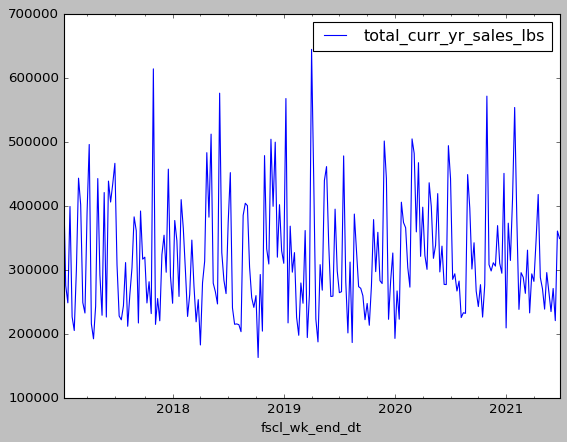

NA01NCSOLUBLEC


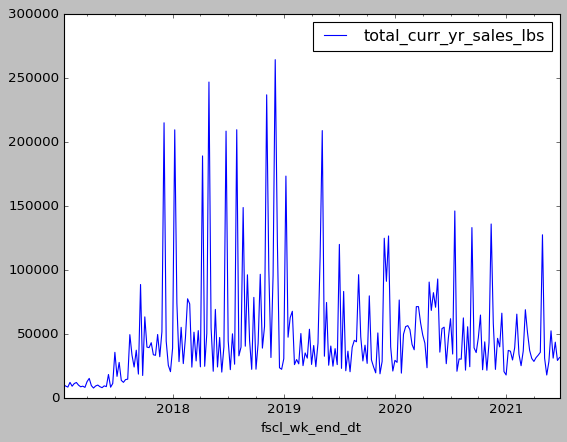

NA01NCVINEGAR


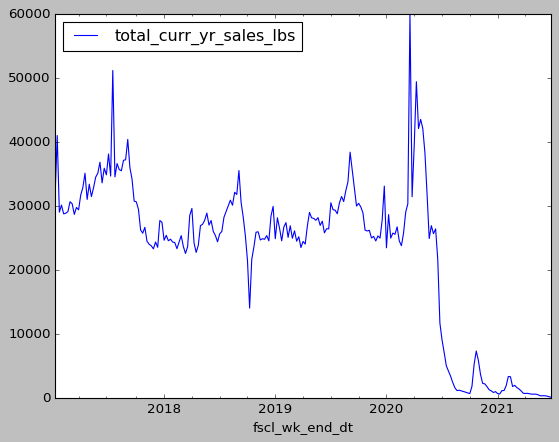

NA01NCTASSNAB


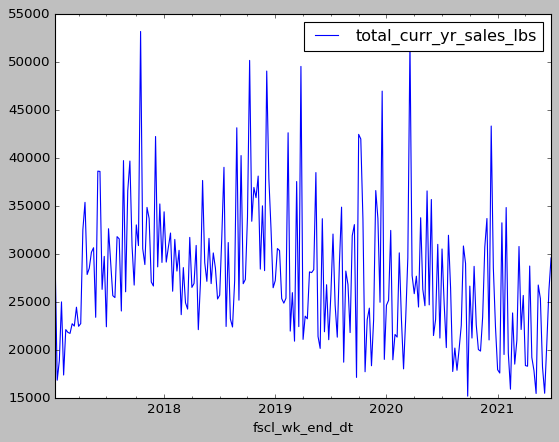

NA01NCLNPWORSC


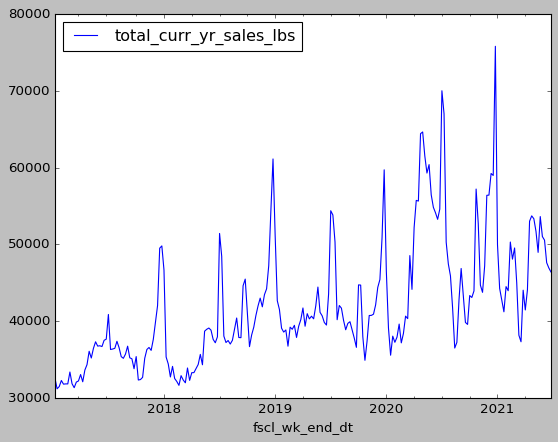

NA01NMCCAFERNG


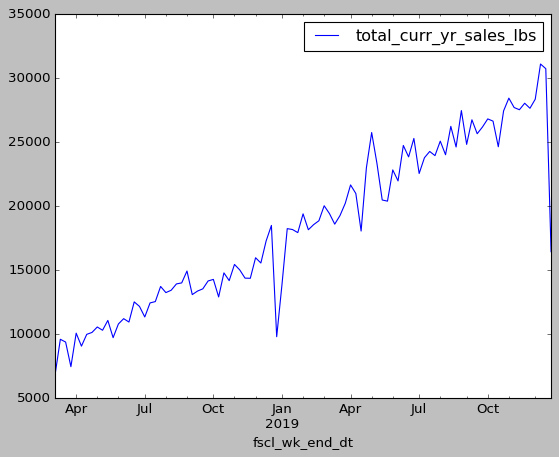

NA01NCFSPOURBL


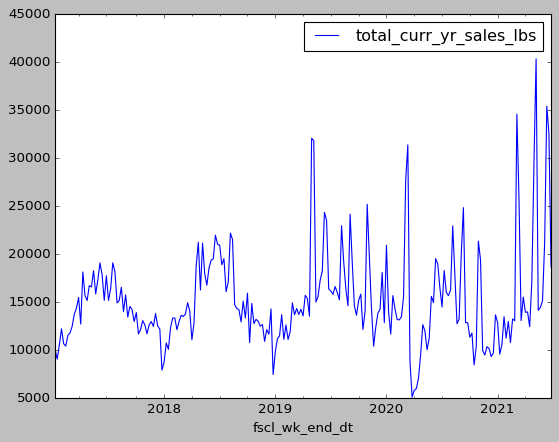

NA01NFSCPSDS


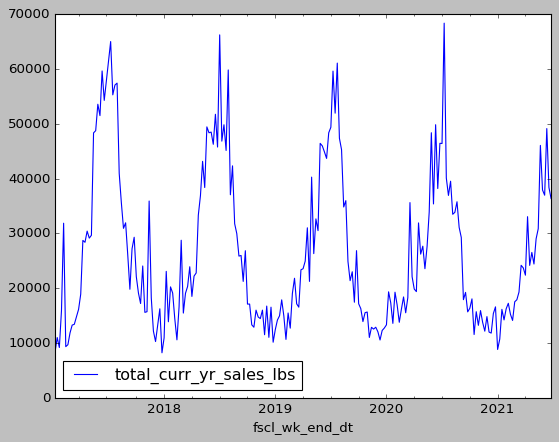

NA01NCRGDRESBT


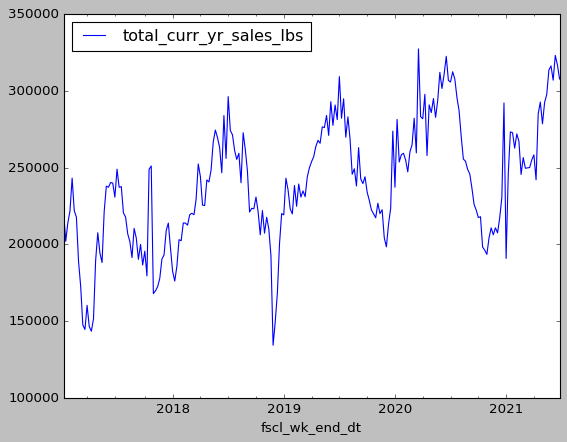

NA01NCNABCPOD


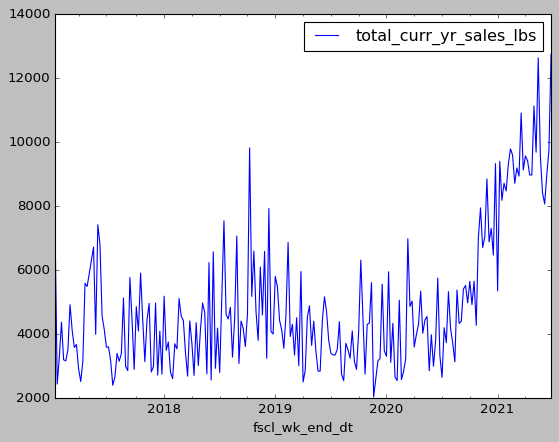

NA01NCOTHDINNR


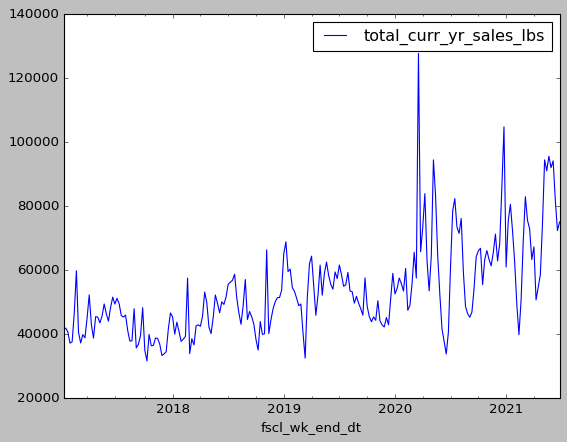

NA01NCINCEREAL


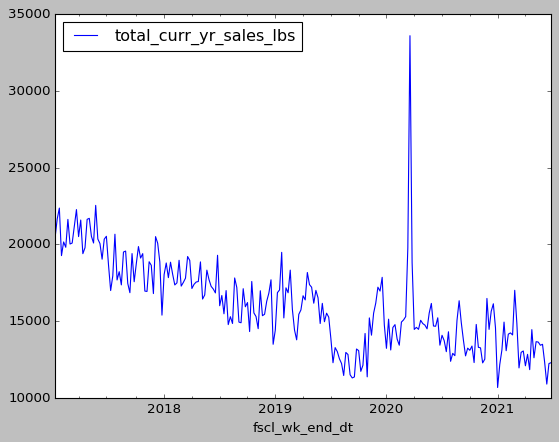

NA01NCSMARTONE


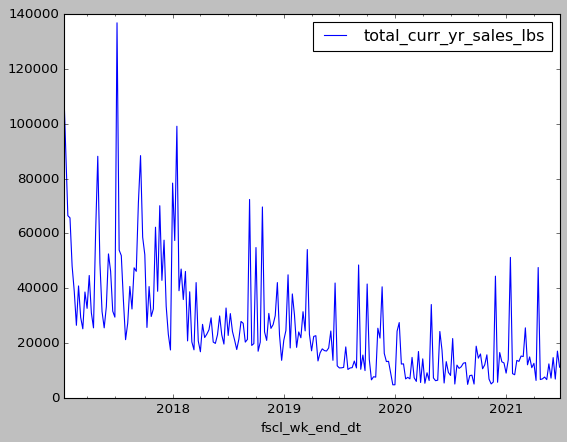

NA01NCRISERVA


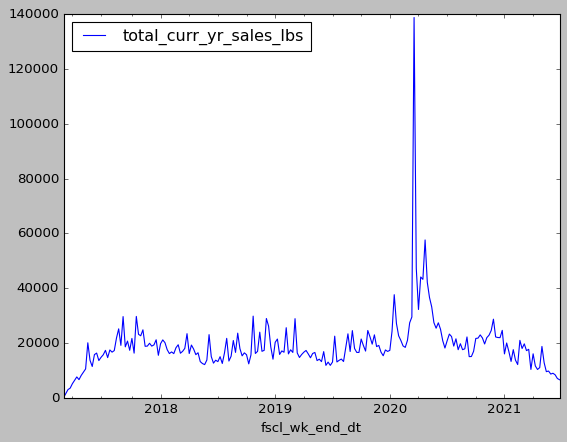

NA01NFSCSHELFS


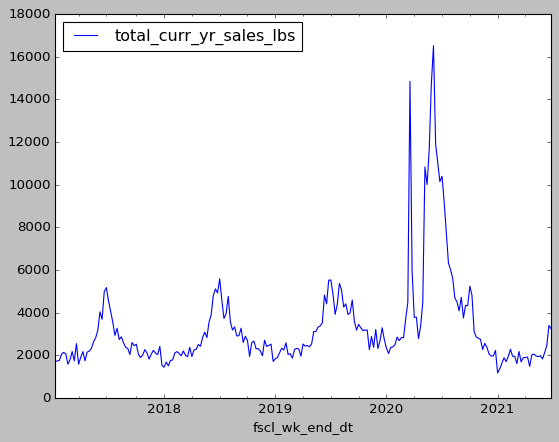

NA01NFSBKSBRND


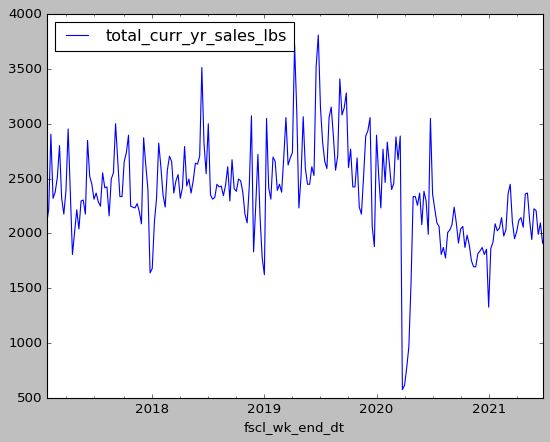

NA01NFSTOMESC


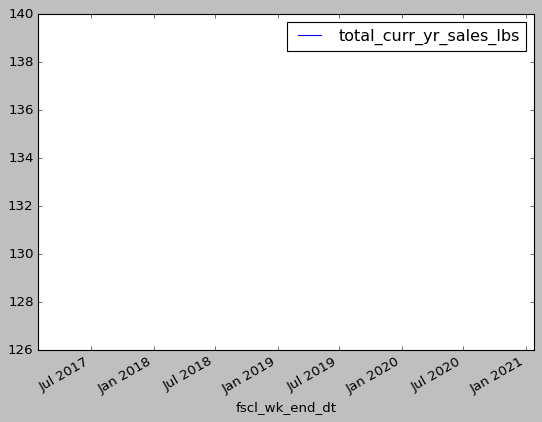

NA01NCCLASSICO


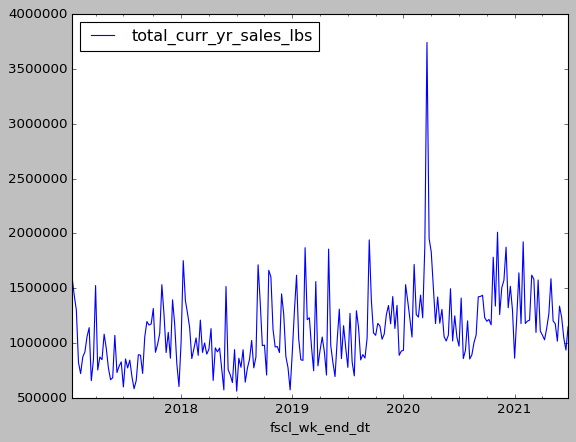

NA01NCSTUFFNG


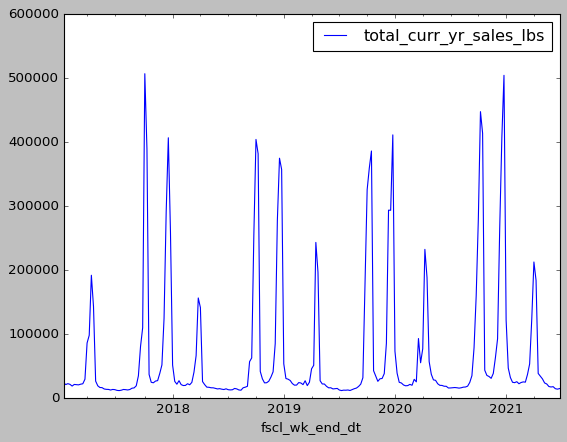

NA01NCDIASCE


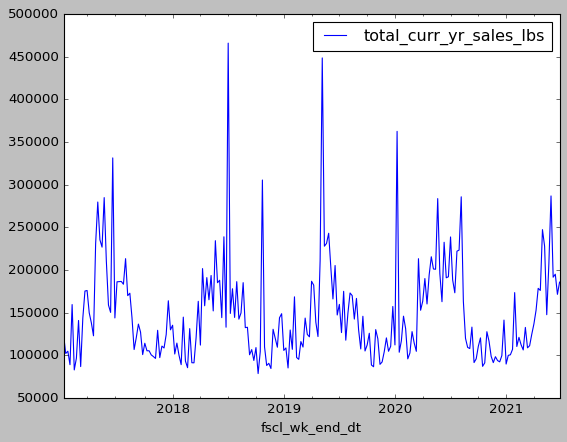

NA01NFSCSYRTOP


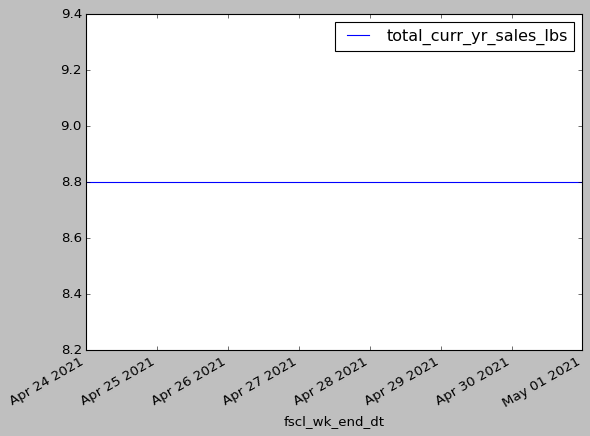

NA01NFSCTRUSO


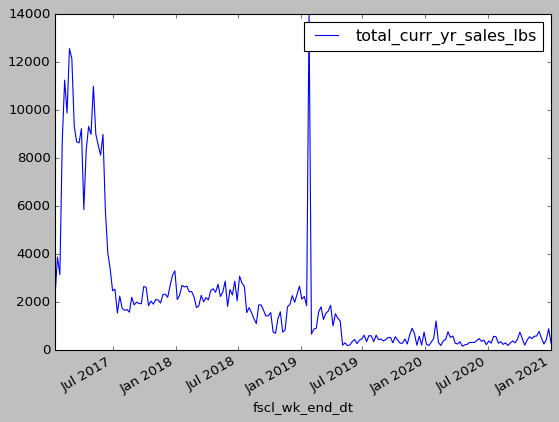

NA01NCSGDMAYO


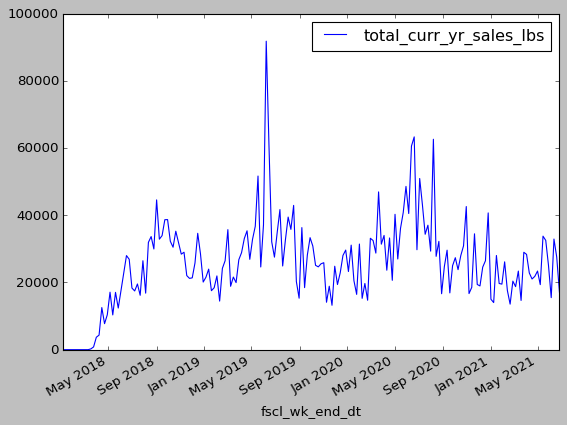

NA01NFSCRICHSC


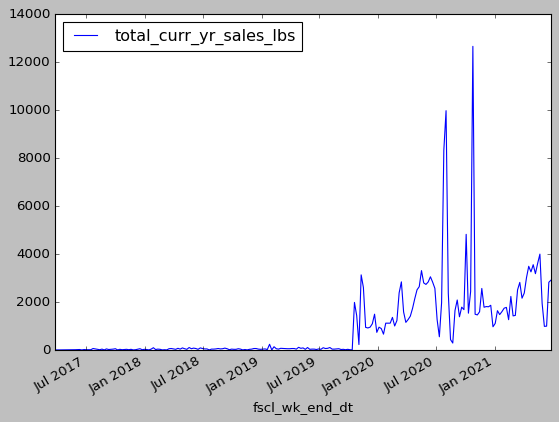

NA01NCFSCSAUCE


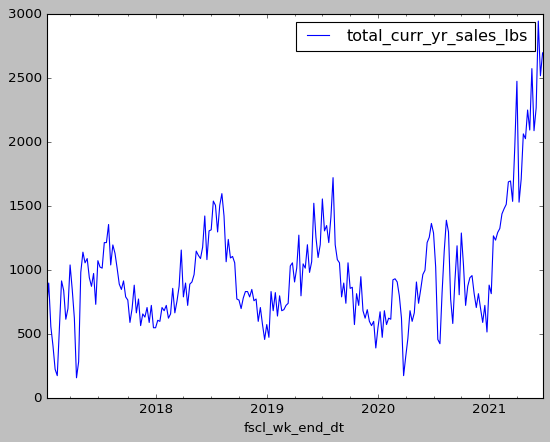

NA01NCBAKINGMM


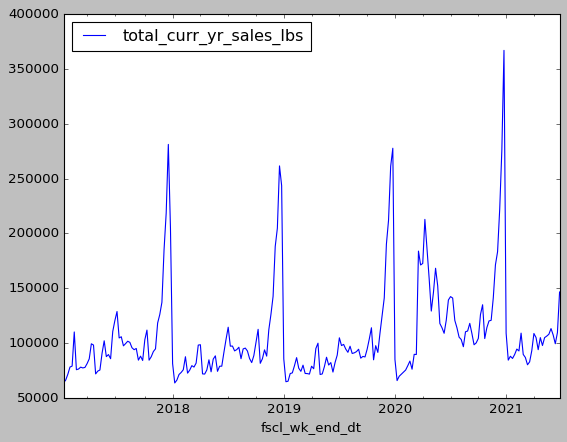

NA01NMXBOOSTPD


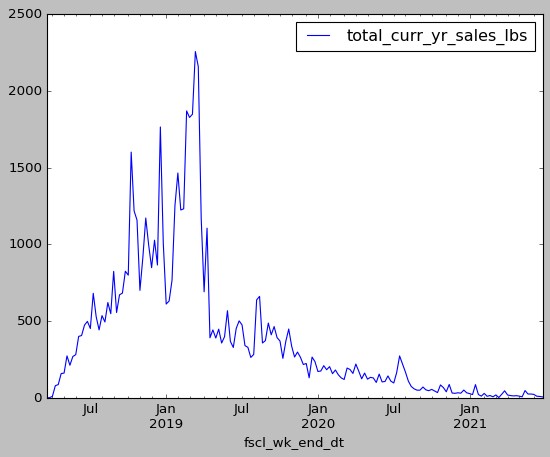

NA01NCTASSMAX


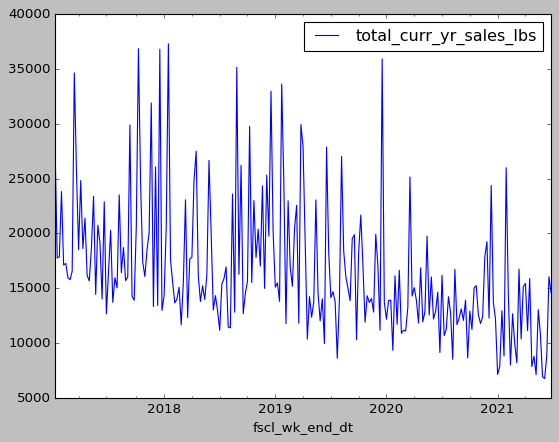

NA01NCCRSDIVMD


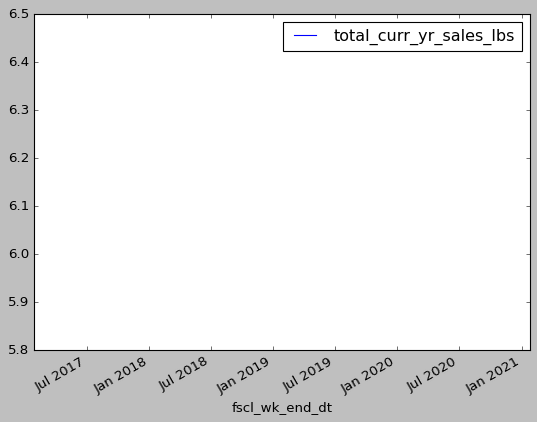

NA01NCCATELLI


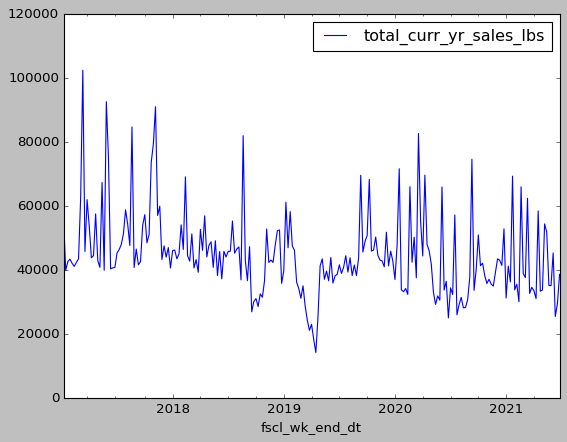

NA01NCPICSUMPK


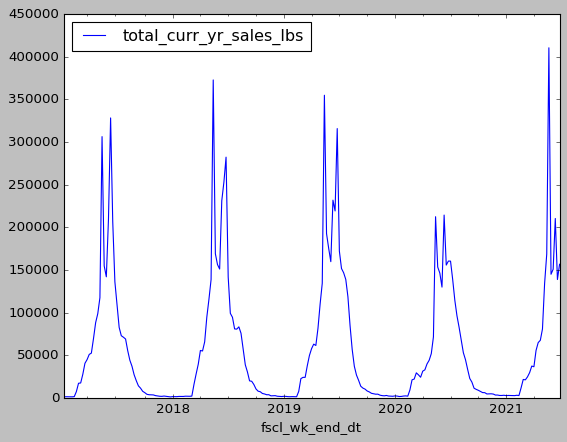

NA01NCMCTASS


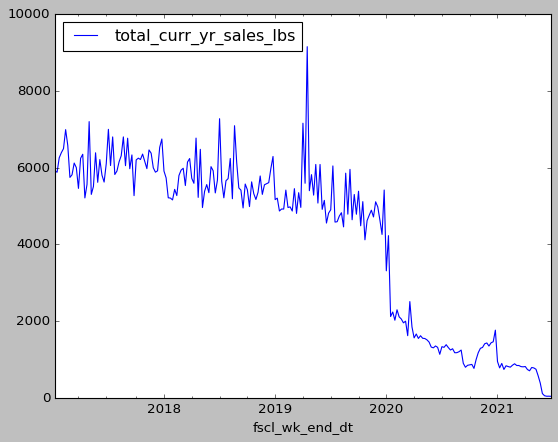

NA01NFSBTLHTSC


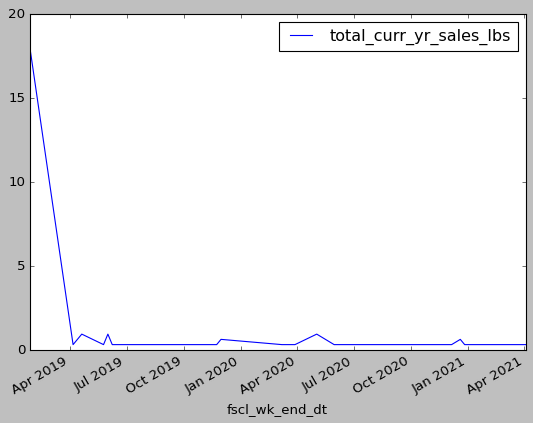

NA01NCOTHCOND


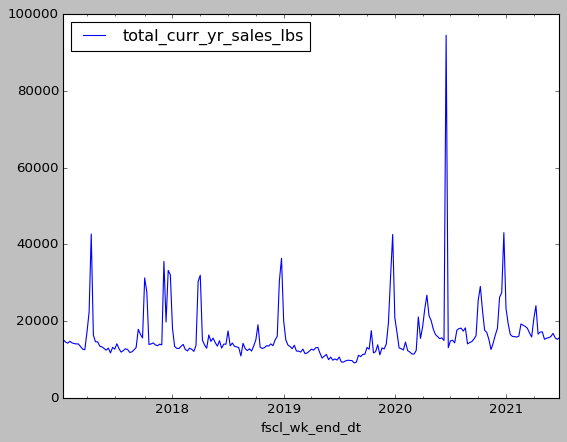

NA01NCMAXHSRG


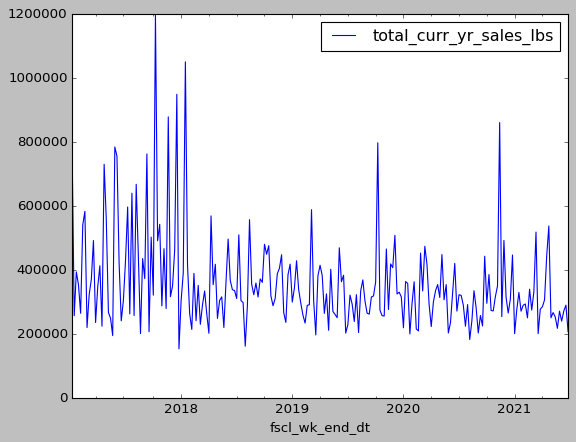

NA01NCRRTEJELL


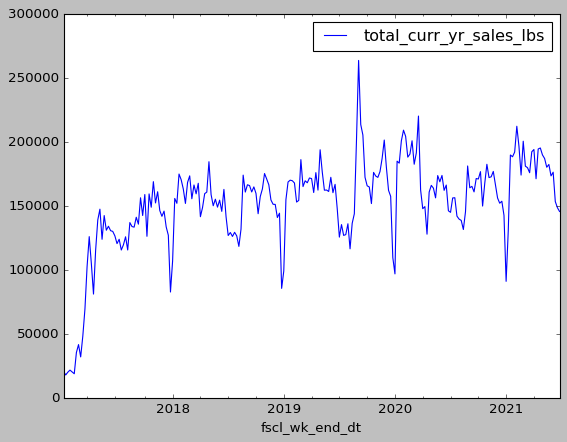

NA01NFSCCHEFSO


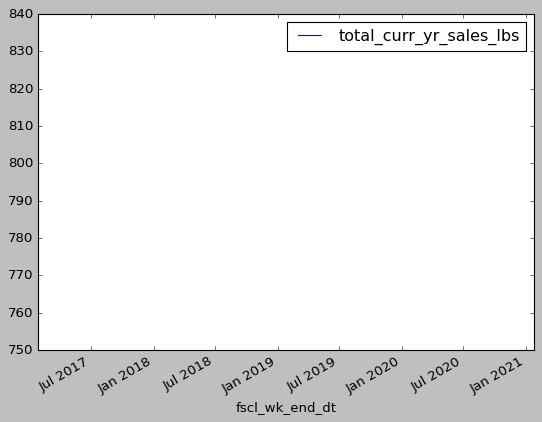

NA01NCOTHPSD


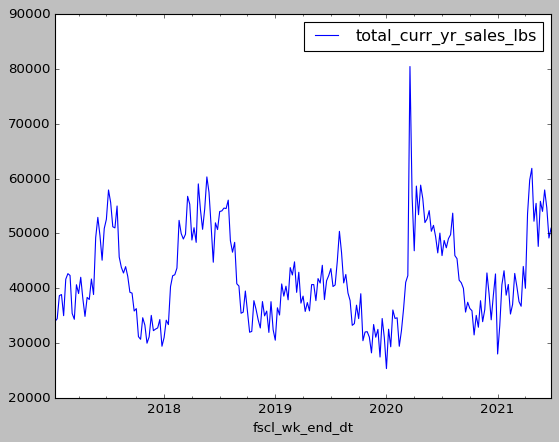

NA01NCTOMPNSCS


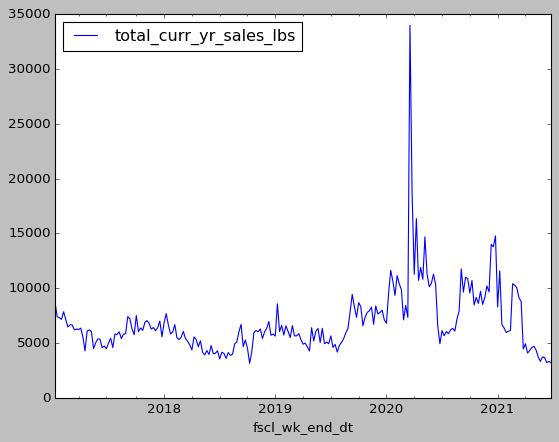

NA01NCDIAMARIN


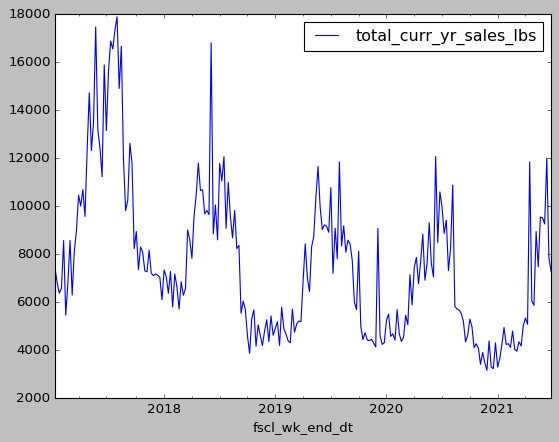

NA01NCRGDRESPP


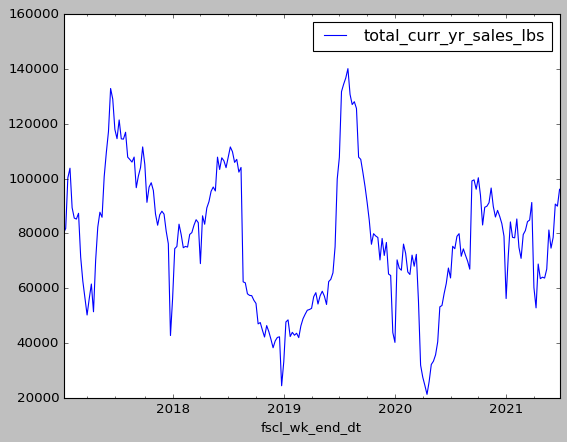

NA01NCFSCRMCHS


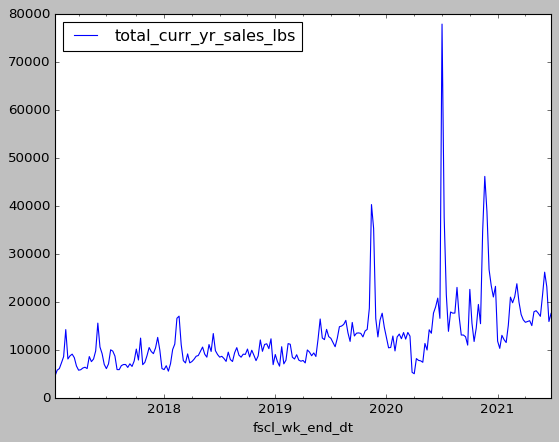

NA01NFSCCORNSS


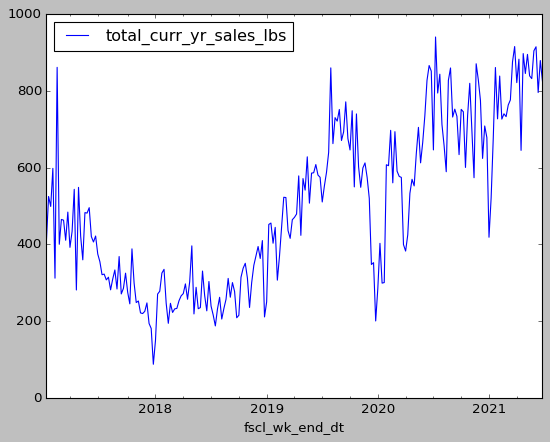

NA01NCRMFPICKL


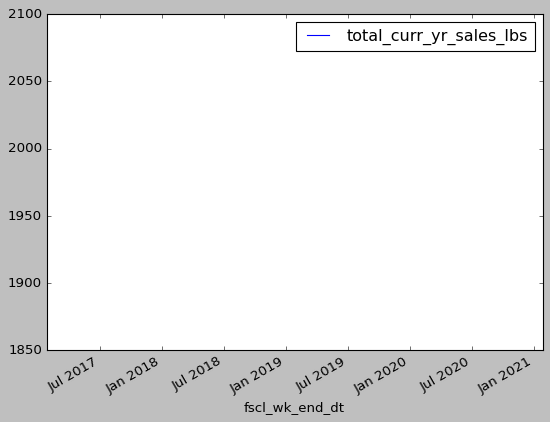

NA01NCINWETPCH


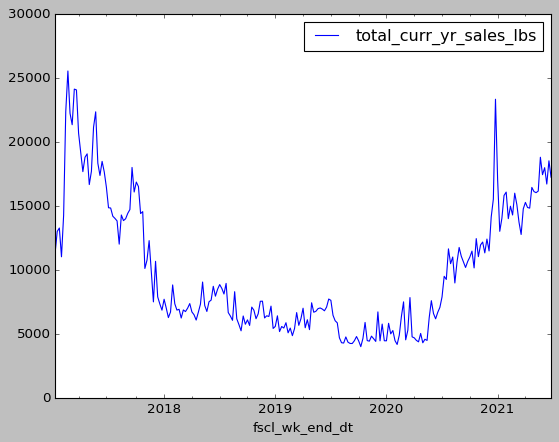

NA01NCPHLWHPCL


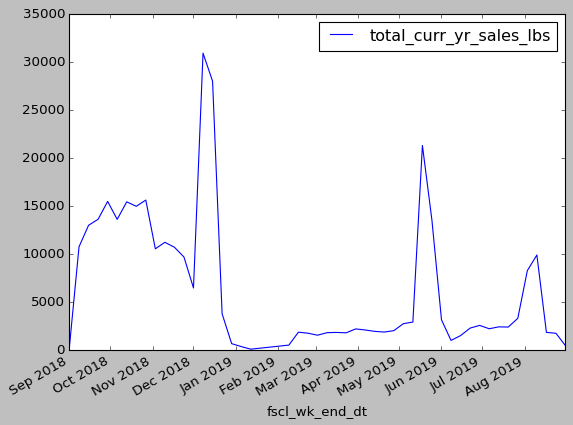

NA01NCBBQSAUCE


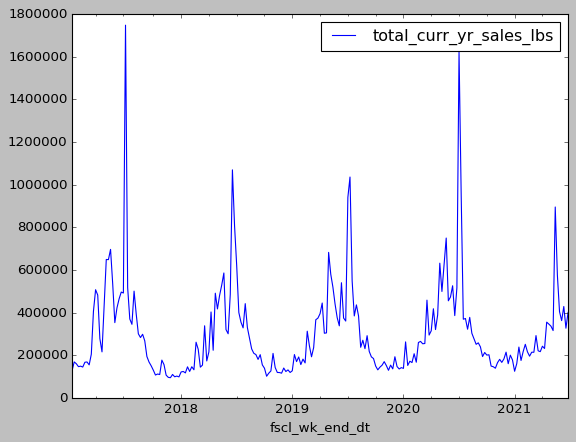

NA01NCPNBTRSPR


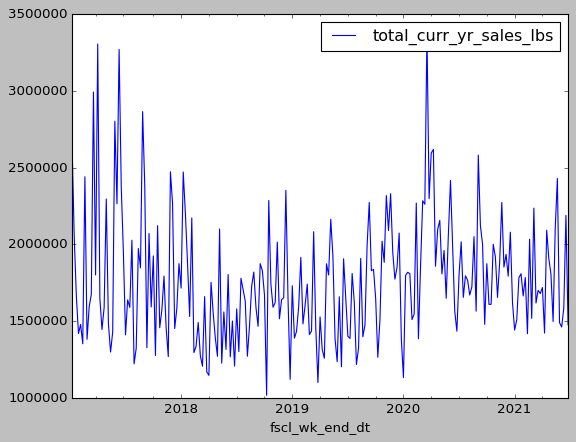

NA01NCBEANS


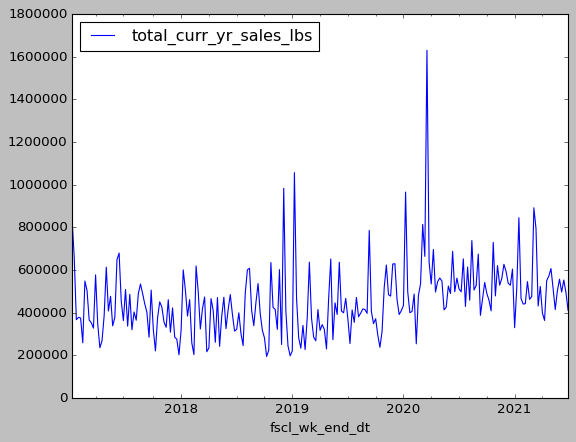

NA01NCINOTHER


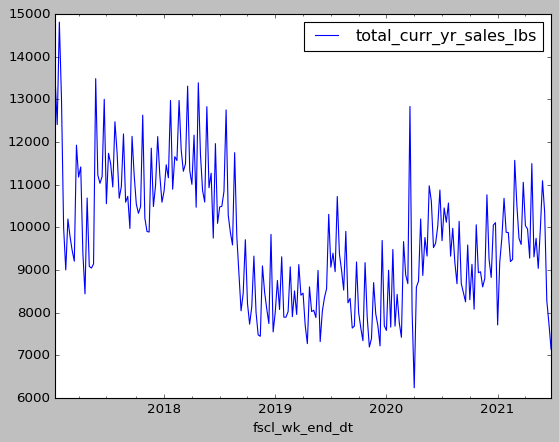

NA01NCPOPPERS


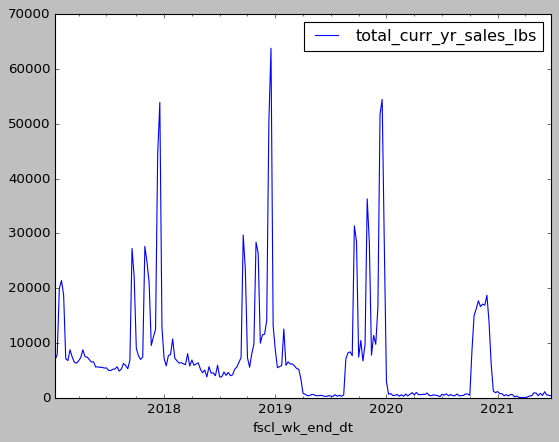

NA01NCEGRATED


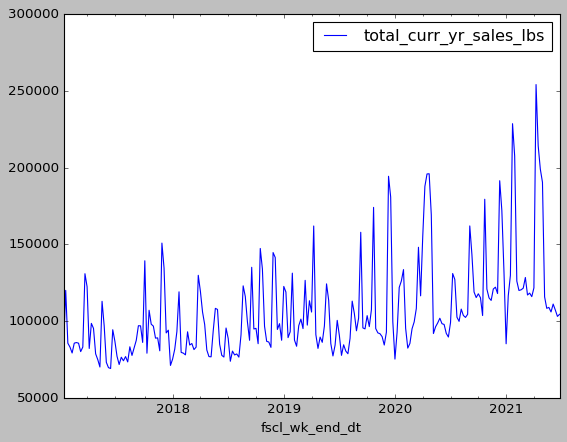

NA01NCBOCARTL


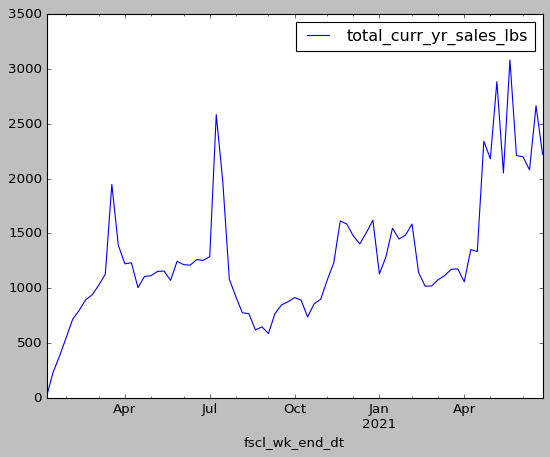

NA01NFSCPRVLB


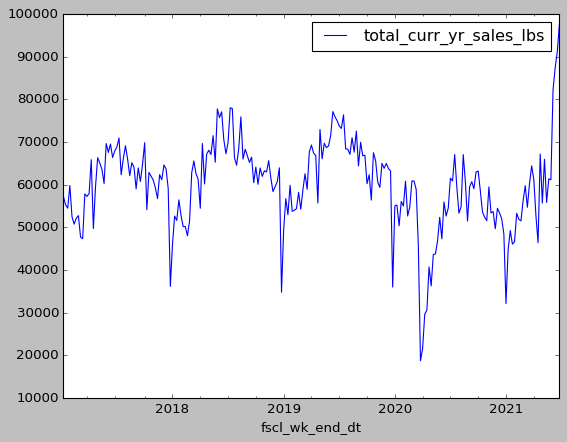

NA01NCGATTUSO


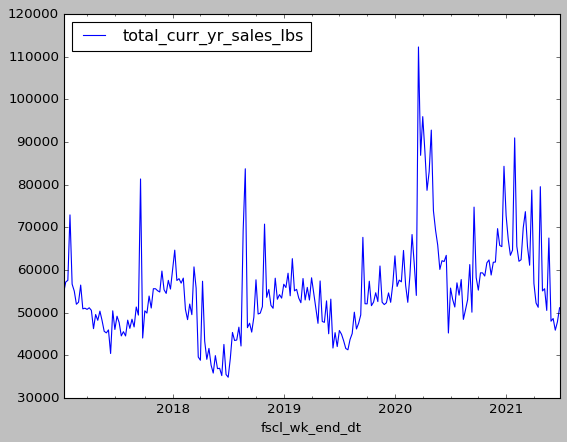

NA01NCCOATING


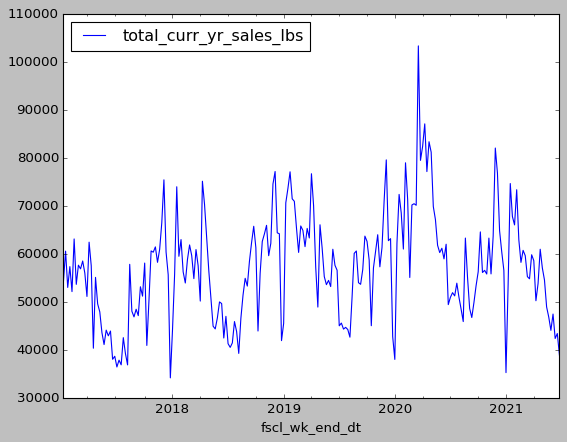

NA01NCBRAVO


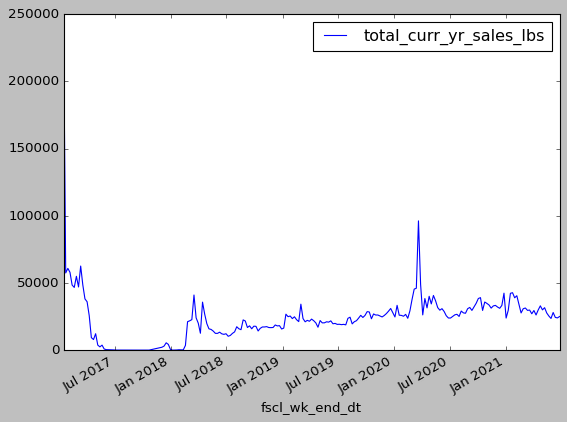

NA01NCFRUITSPR


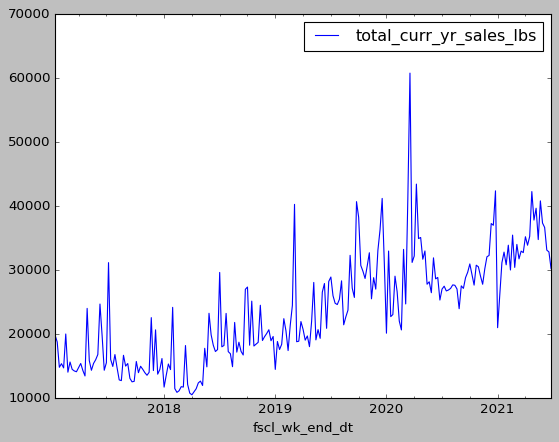

NA01NCMACCHS


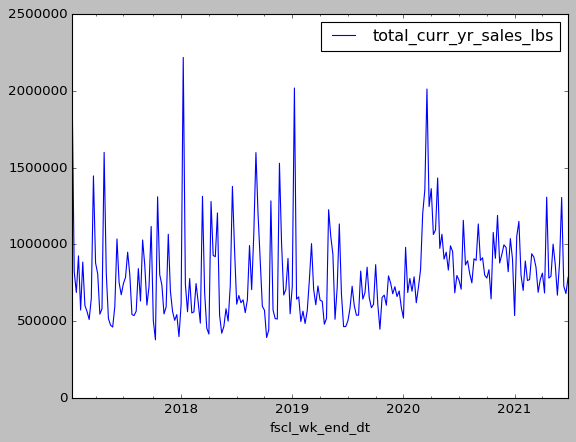

NA01NCSOUPCOND


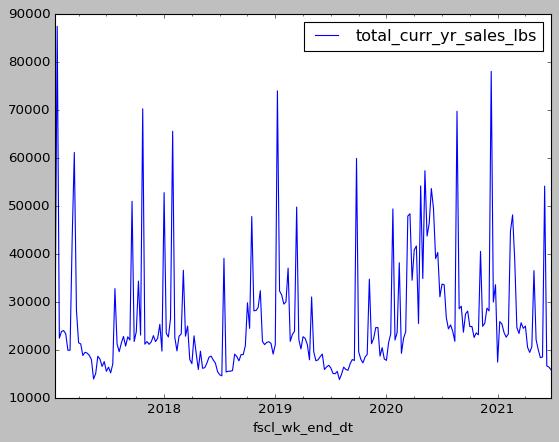

NA01NCEBCOFFEE


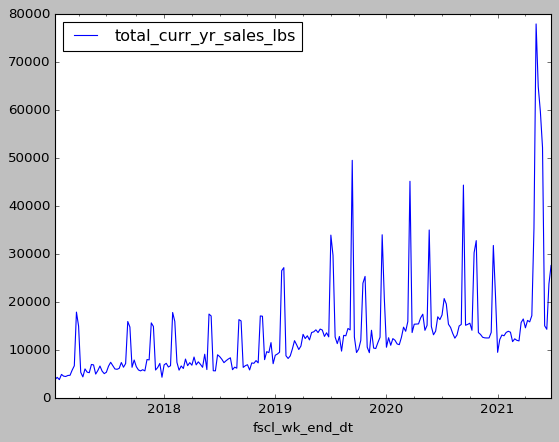

NA01NFSCRENDRS


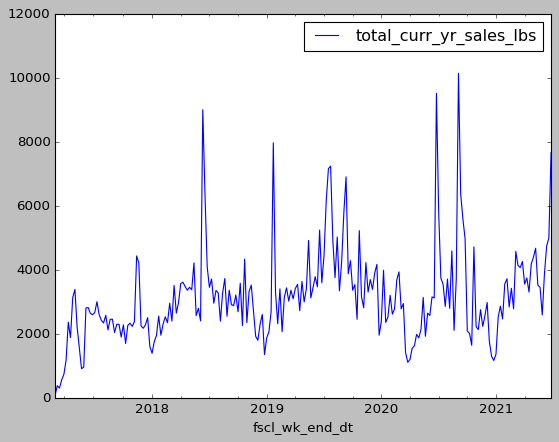

NA01NCGARDENST


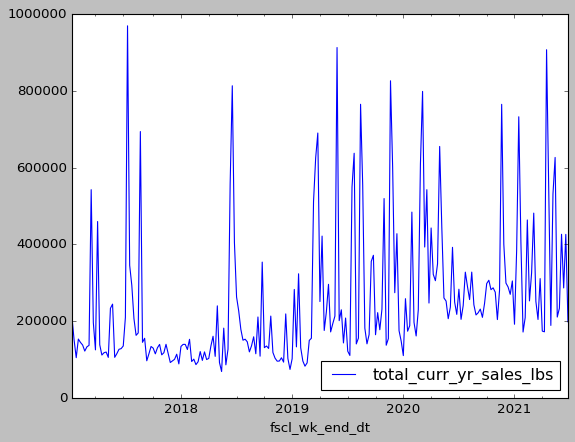

NA01NFSCKFRSP


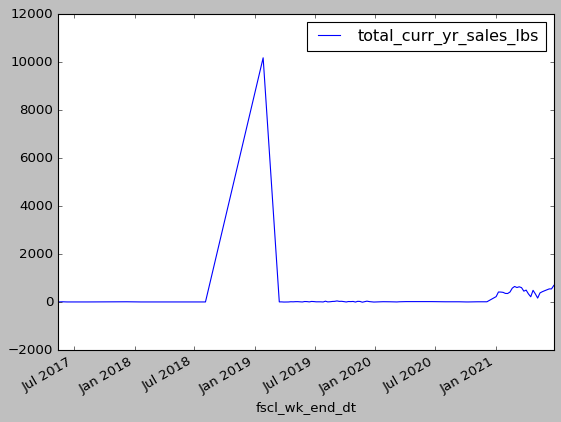

NA01NCSFTCLCC


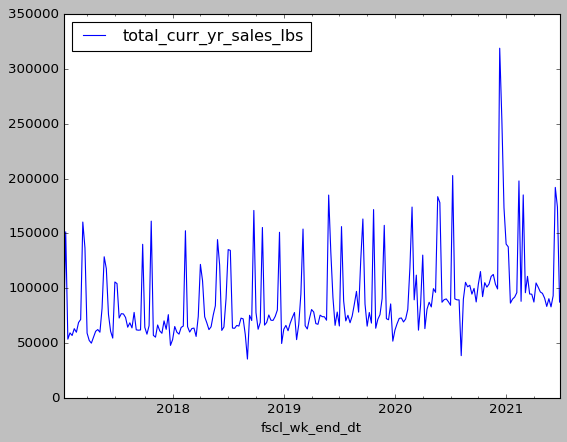

NA01NFSCTOMJU


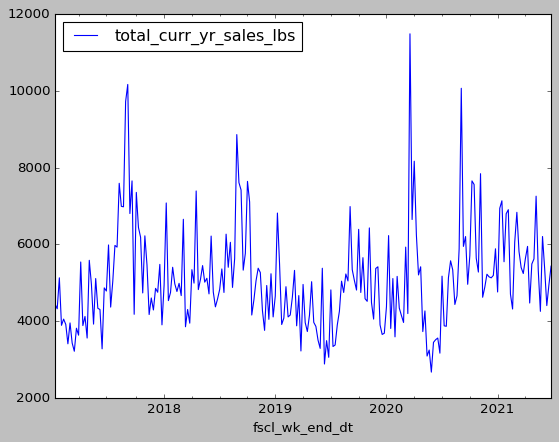

NA01NCPASTA


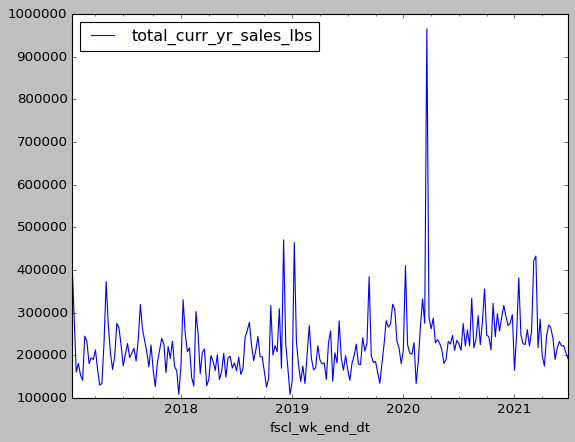

NA01NFSCKETCHP


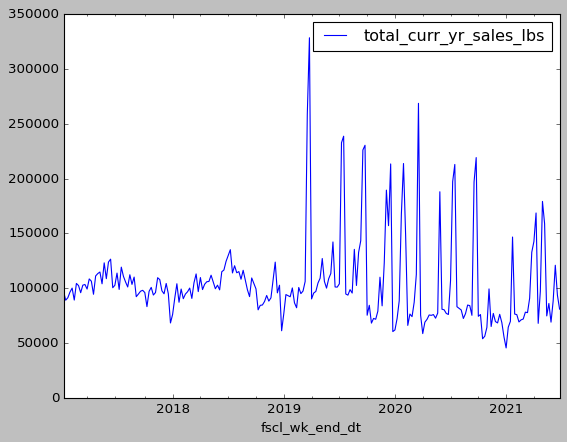

NA01NCFSCBBQ


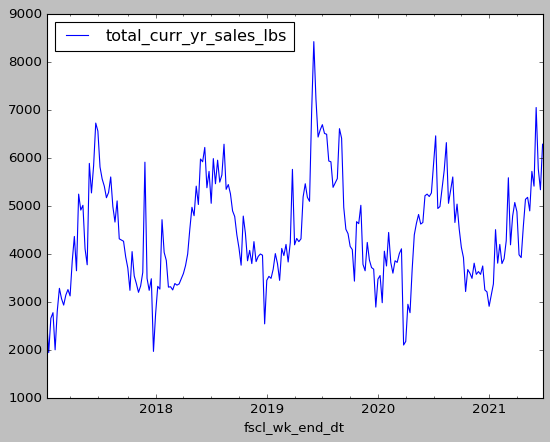

NA01NCWHATCOOK


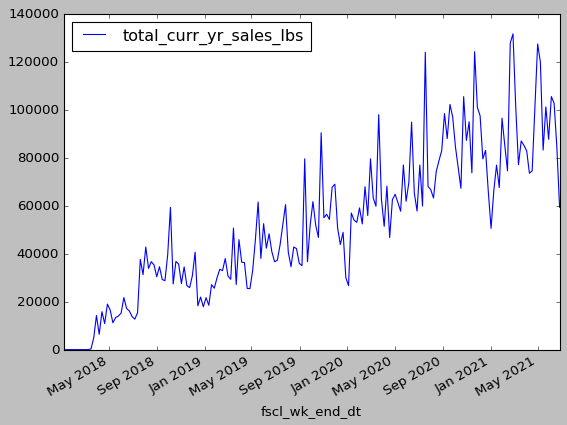

NA01NCPHLBRREG


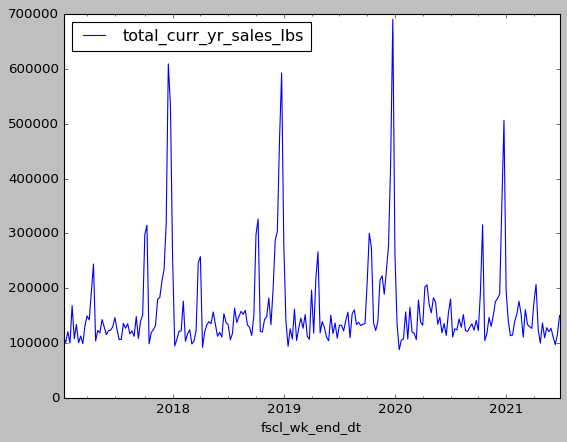

NA01NCOTHNAT


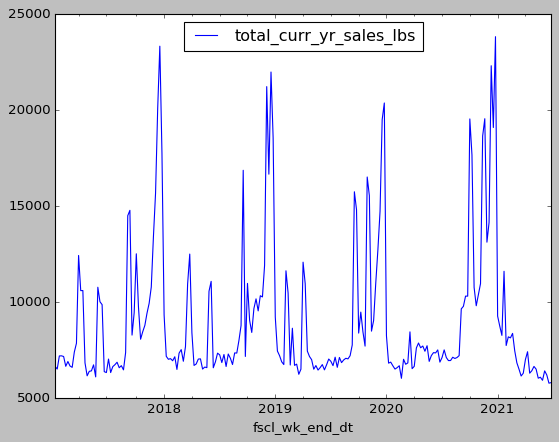

NA01NCCHILISCE


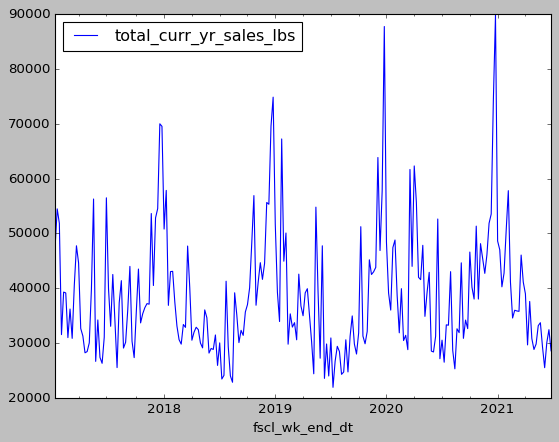

NA01NCMUSTARD


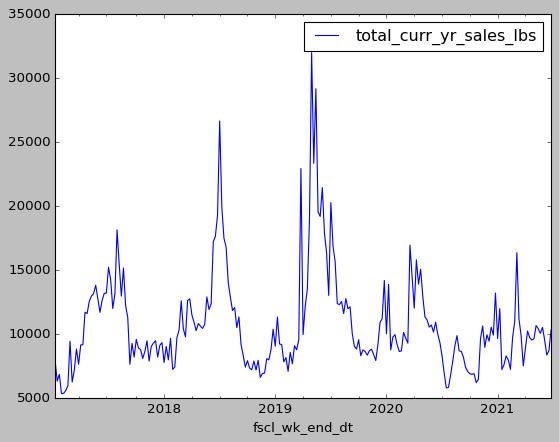

NA01NCTASSOTH


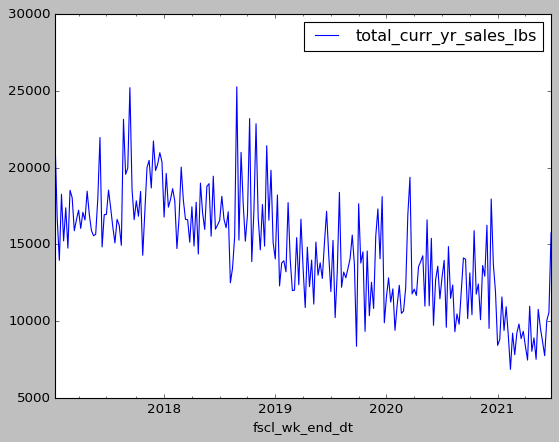

NA01NFSCPNTBTR


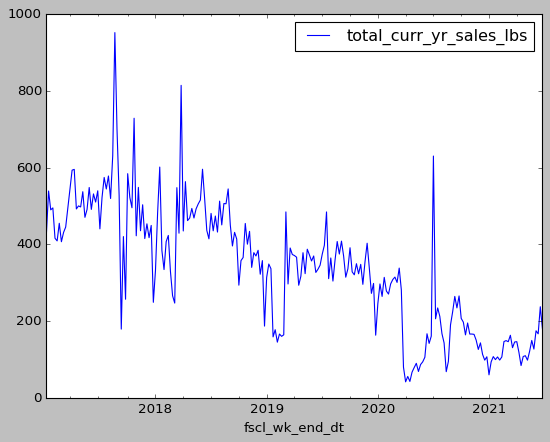

NA01NCEBPODS


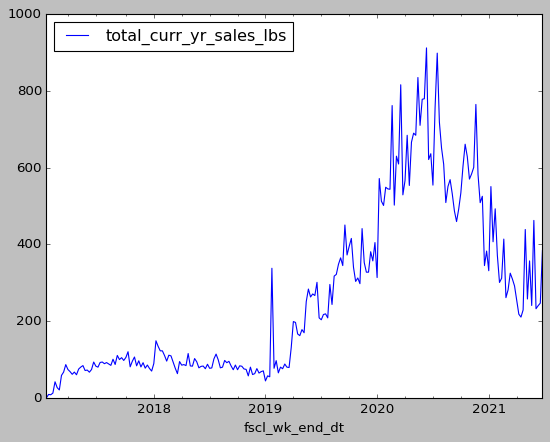

NA01NCHPSCE


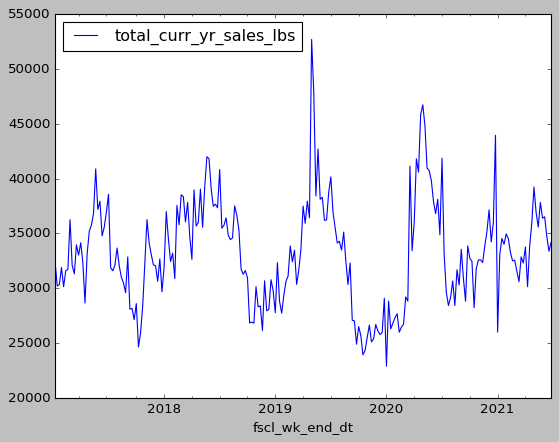

NA01NCLIQDRCL


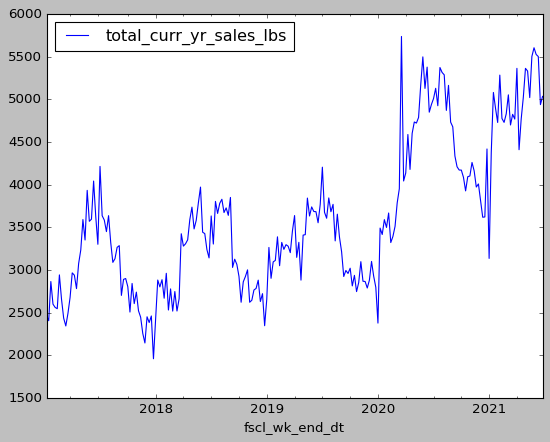

NA01NFSCOSPDRS


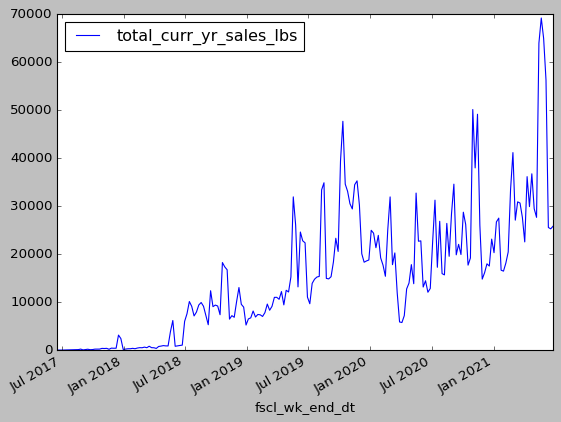

NA01NCHOTBITES


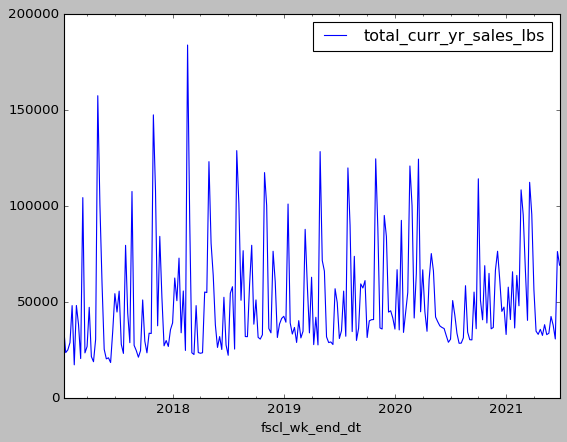

NA01NCTOMJUICE


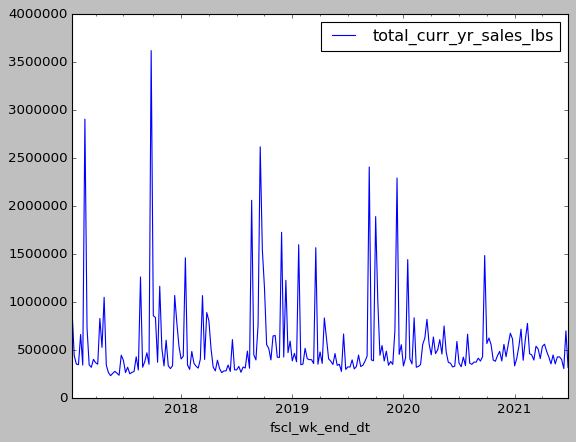

NA01NCFSSPOONB


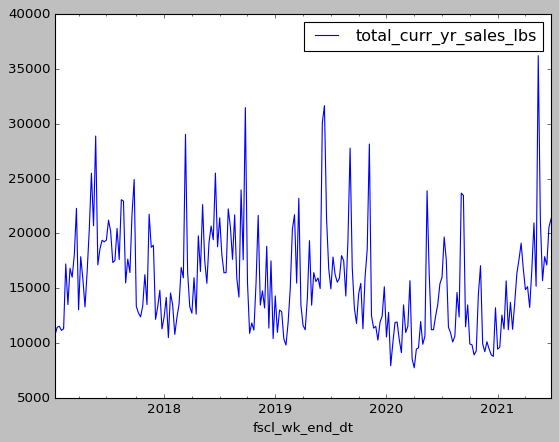

NA01NCMAYOPROD


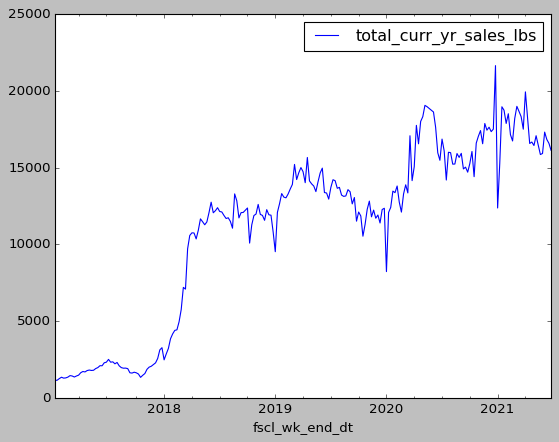

NA01NCHPTBBQSA


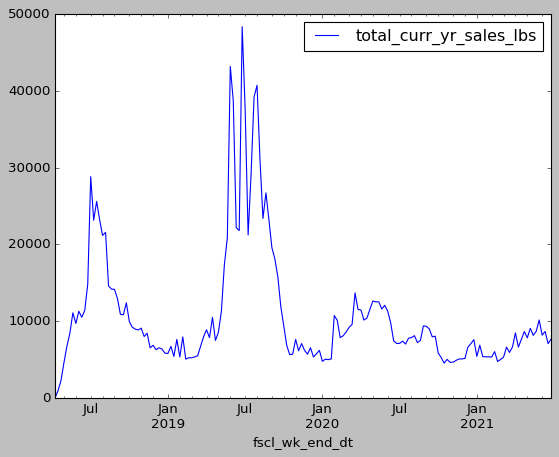

NA01NCSALADDRS


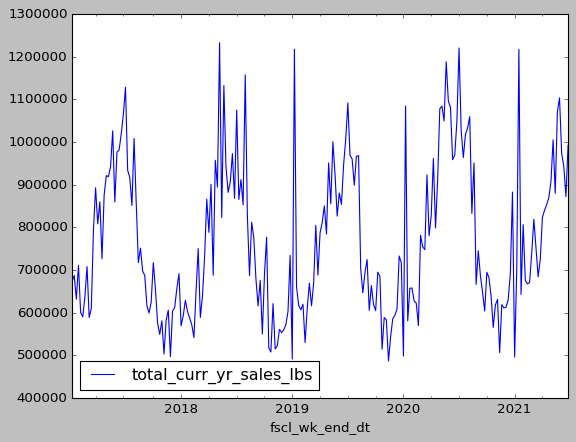

NA01NFSCDESSRT


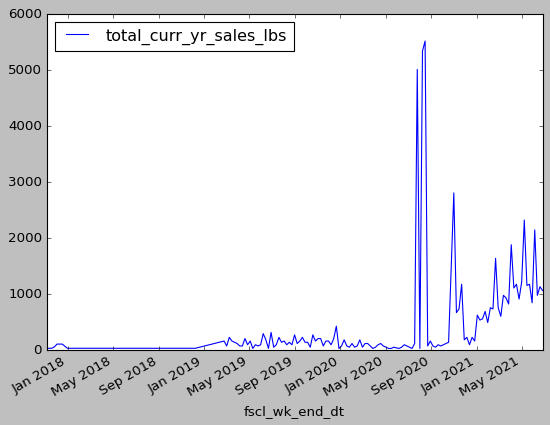

NA01NCMHPOD


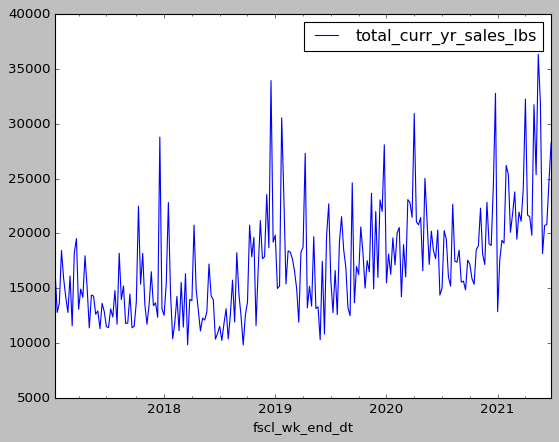

NA01NCMCRG


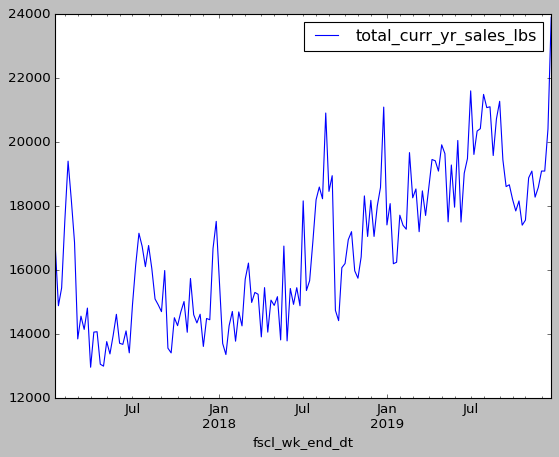

NA01NCLIQDRKMX


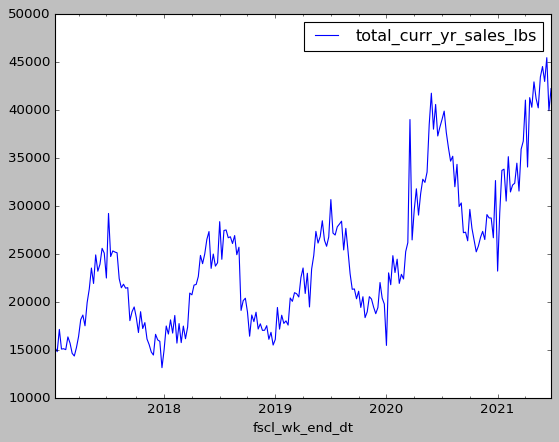

NA01NCFSPRCCHS


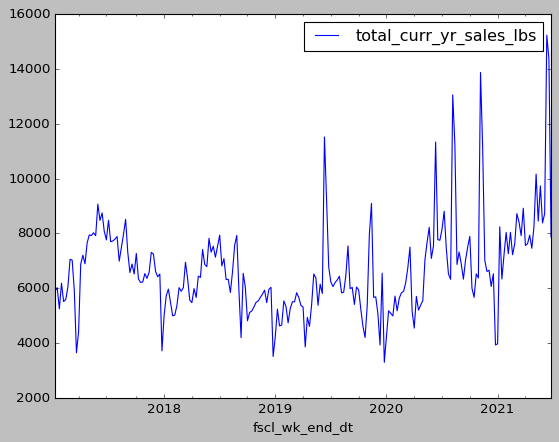

NA01NFSCOTSOUP


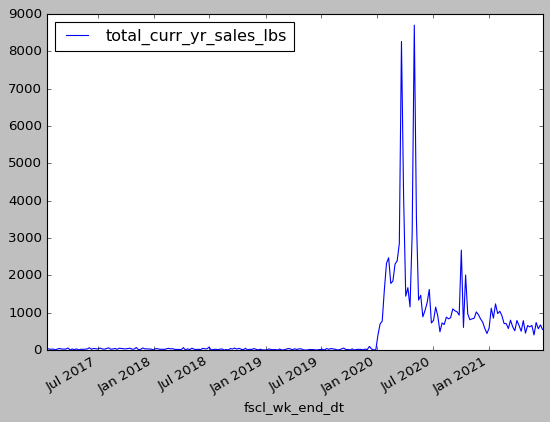

NA01NCESLICES


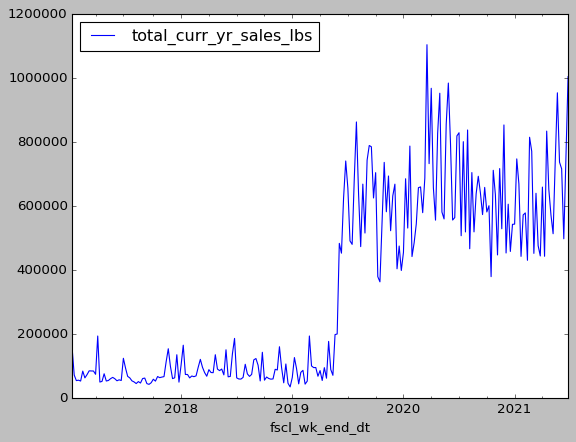

NA01NMXBOOSTRG


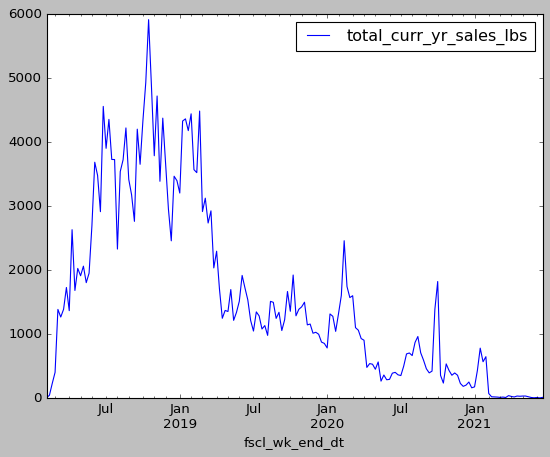

NA01NCFSNONCOF


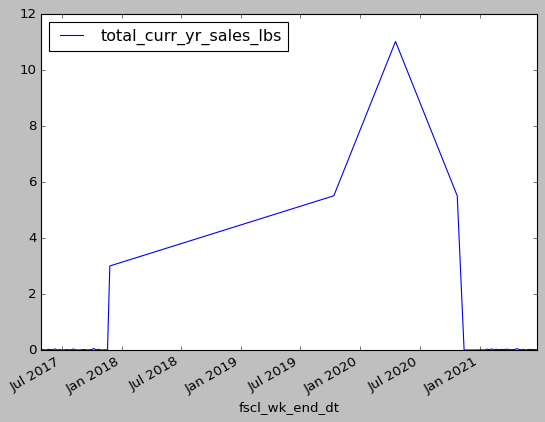

NA01NCSOFTCCR


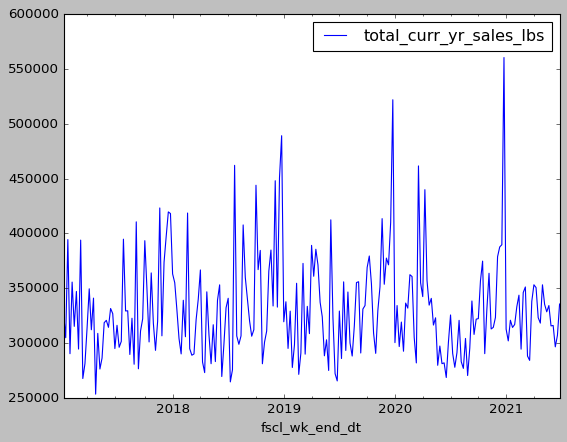

NA01NCPHLBRCLB


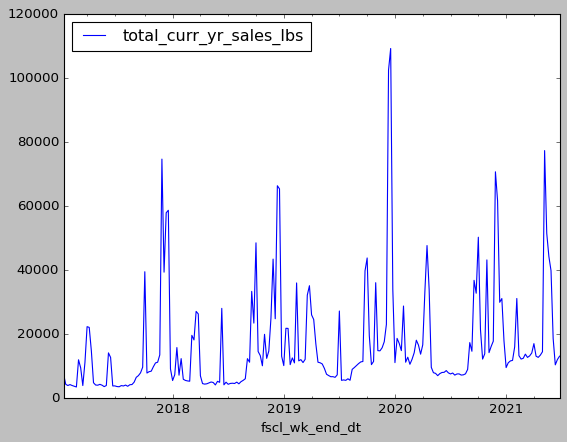

NA01NCRTDPOUCH


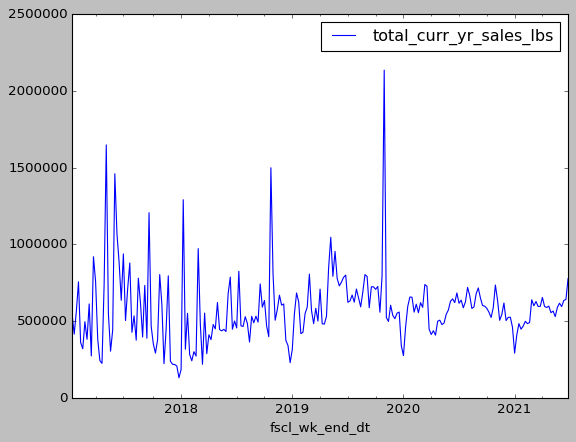

NA01NFSCDPD


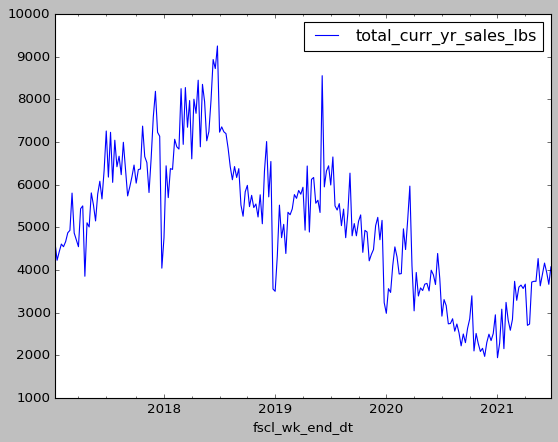

NA01NCPHILDIP


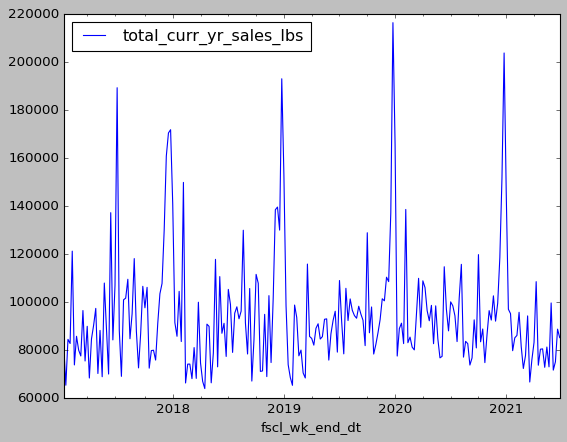

NA01NCCRYSTAL


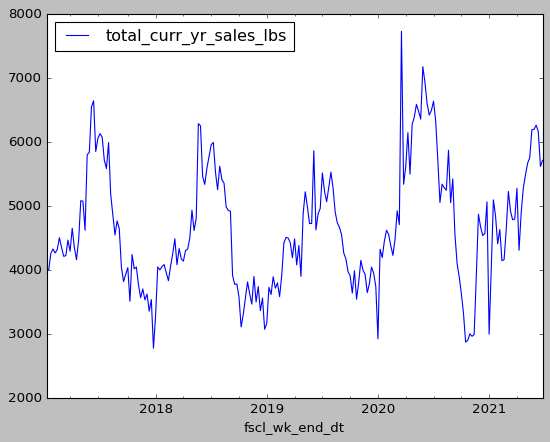

NA01NCKDCUPS


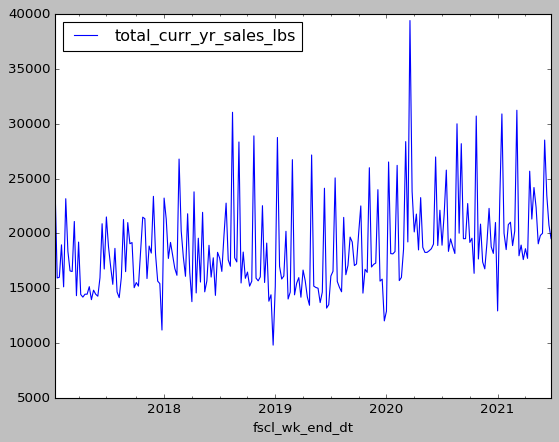

NA01NCFSPOURSS


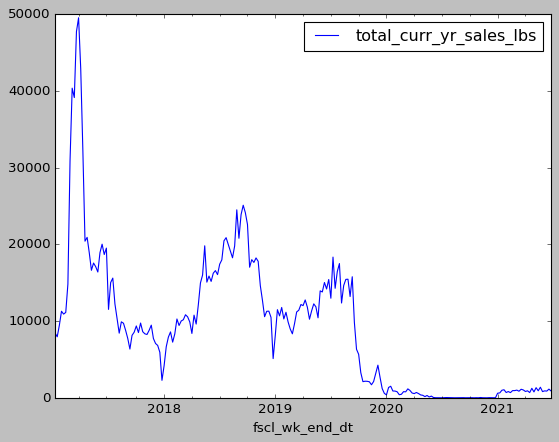

NA01NCWHIPCC


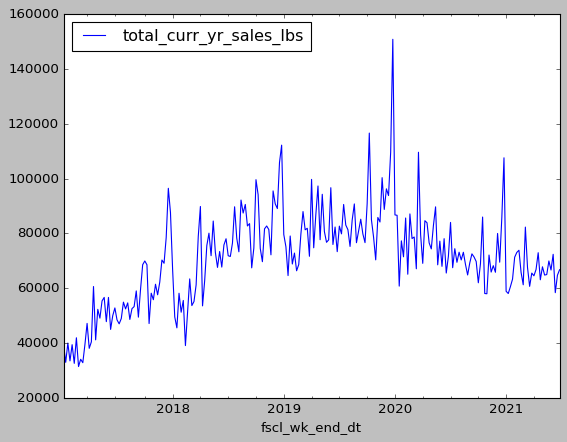

NA01NTASSRTL


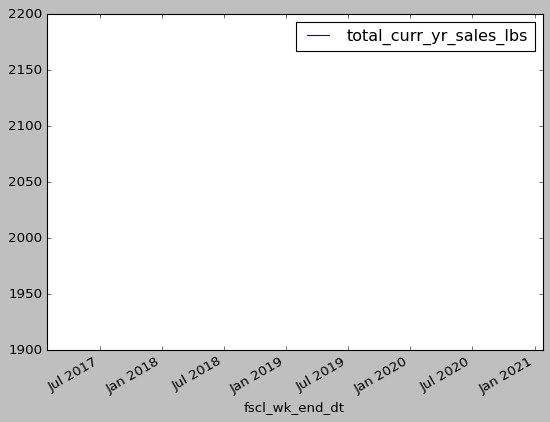

NA01NCINWETJAR


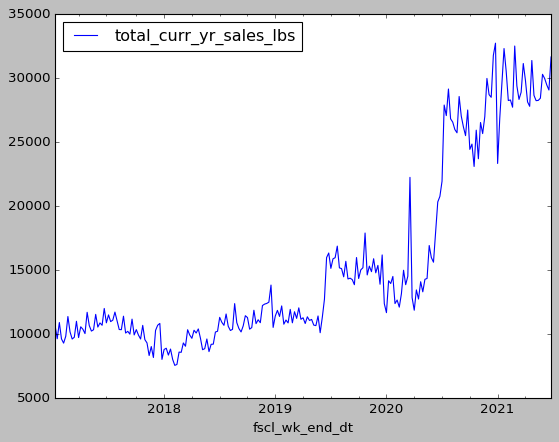

NA01NFSCMEALS


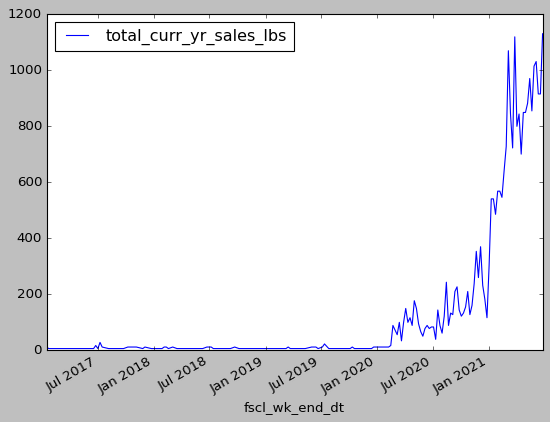

NA01NFSCTBLPRD


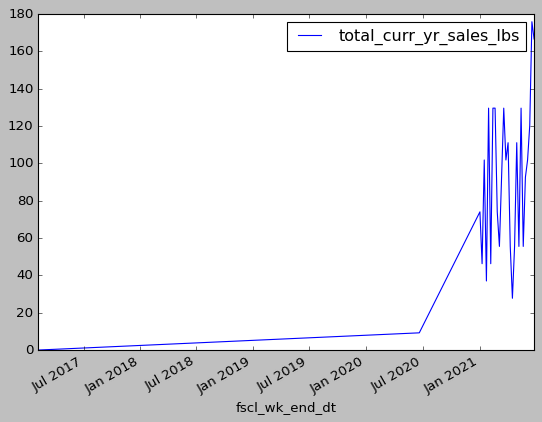

NA01NCHZLNTSPR


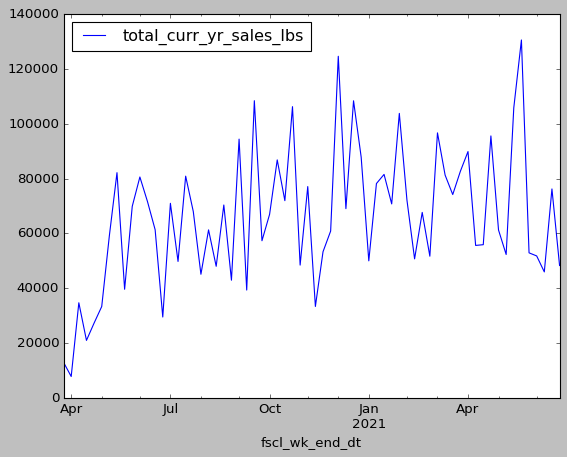

NA01NFSCPLKET


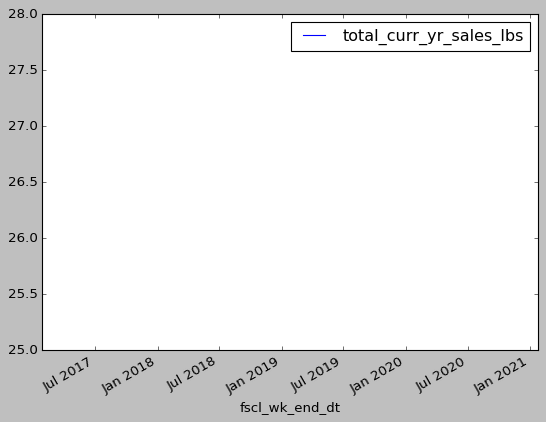

NA01NCSPONABLE


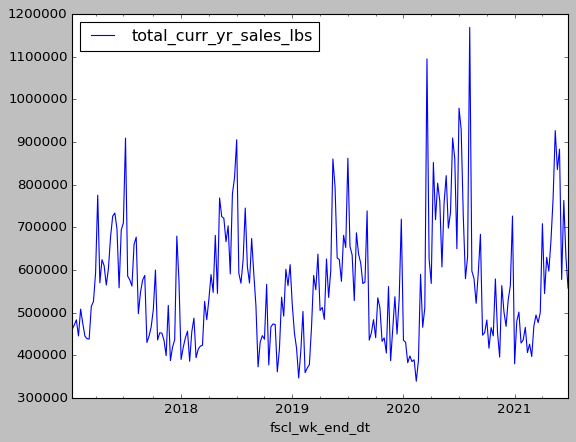

NA01NCTGIF


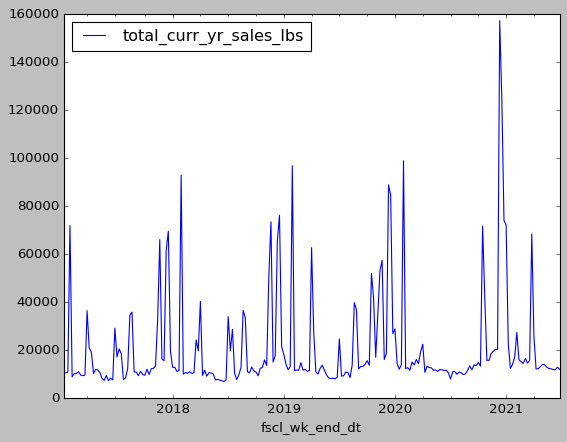

NA01NCMCPODS


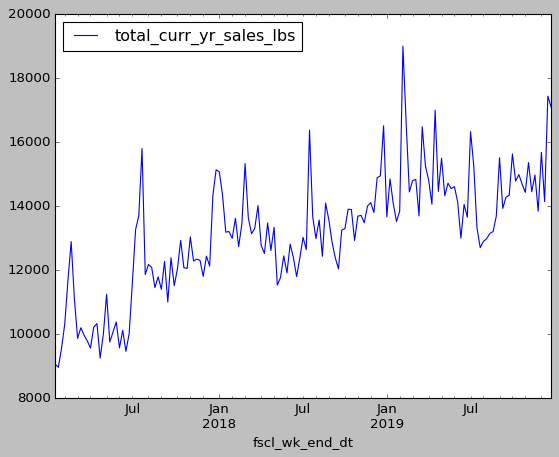

NA01NCFSOTHCON


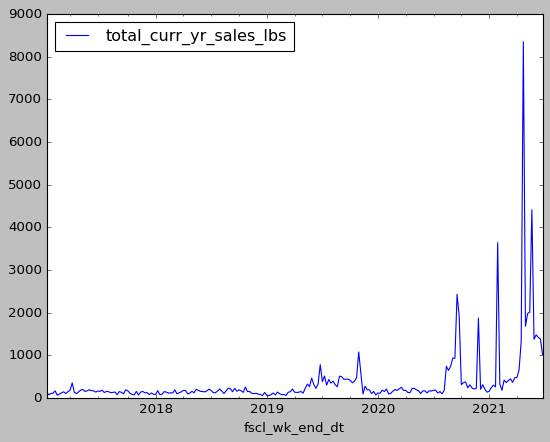

NA01NCDPD1


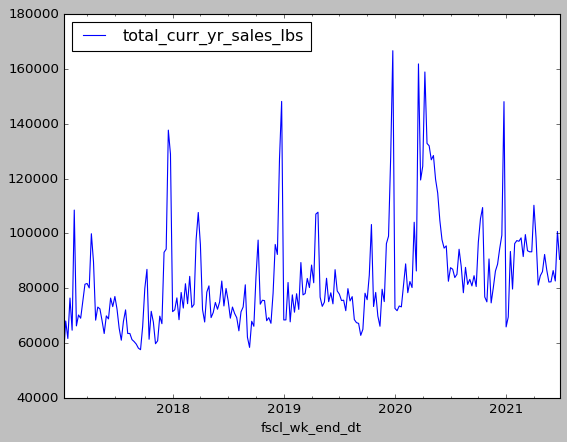

NA01NCTOPPING


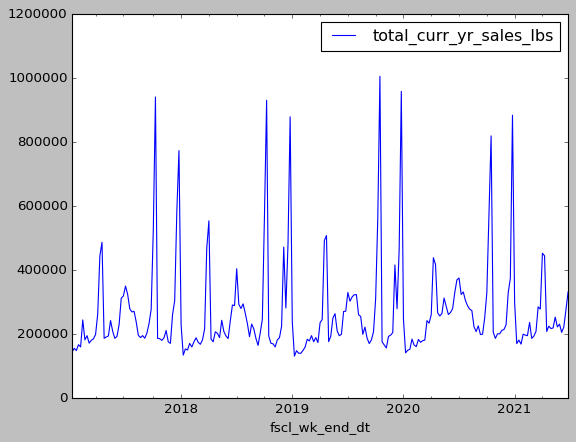

NA01NFSCOCOSCE


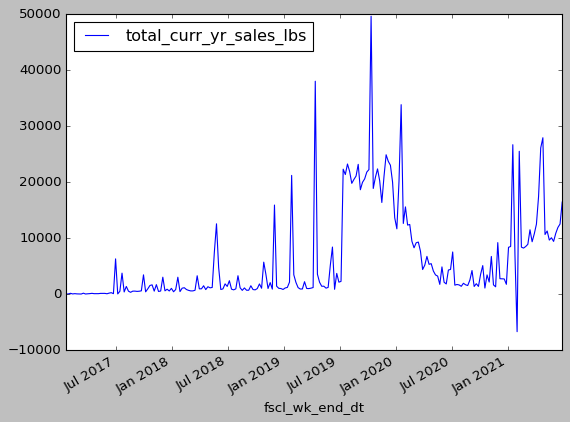

NA01NCNABOBRG


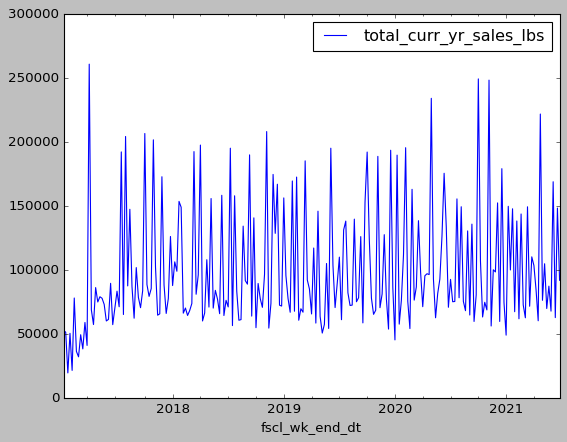

NA01NFSCTOMPRO


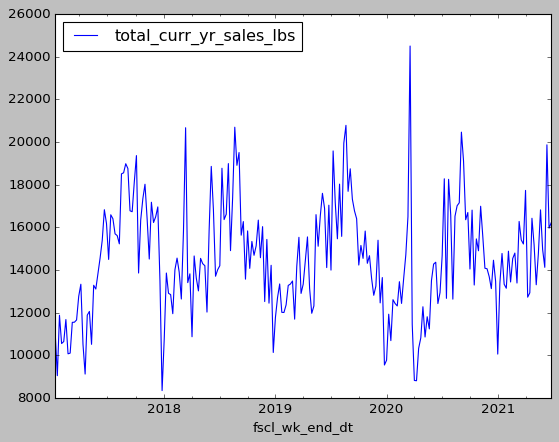

NA01NCA1SCE


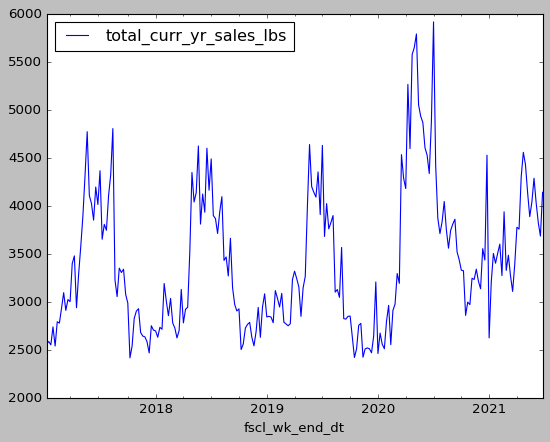

NA01NCKETCHUP


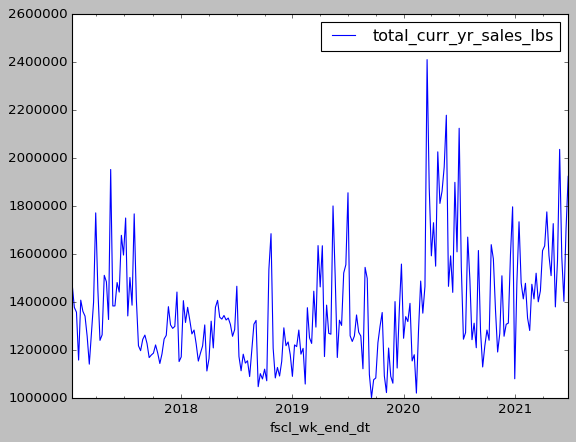

In [ ]:
for e in unique_epm_list:
    print(e)
    df[df.epm == e].plot(label=e)
    plt.show( block=False )

In [ ]:
lookback = 13
past = 720
future = 72
learning_rate = 0.001
batch_size = 32
epochs = 10
step = 1#(No resampling required)

def normalize(data):
    data_mean = data.mean(axis=0)
    data_std = data.std(axis=0)
    return (data - data_mean) / data_std

kpi_list = []
unprocessed_epm_list = []

for e in unique_epm_list:
    print("Processing epm " + e)
    kpi_dict = {}
    stat_dict = {}
    #train_value, train_value_pad, train_value_backfill, train_value_nearest = -1, -1, -1, -1

    epm_df = df[df.epm == e][['total_curr_yr_sales_lbs']]
    # Using multiple features (predictors)
    total_curr_yr_sales_lbs_values = epm_df.values#.flatten()
    print("Shape of training data " + str(total_curr_yr_sales_lbs_values.shape))
    
    '''
    # Method was mentioned in case excat index value is not present in the dataset
    try:
        train_value = epm_df.index.get_loc('2020-12-26')
    except:
        try:
            train_value_pad = epm_df.index.get_loc('2020-12-26',method='pad')
        except:
            try:
                train_value_backfill = epm_df.index.get_loc('2020-12-26',method='backfill')
            except:
                train_value_nearest = epm_df.index.get_loc('2020-12-26',method='nearest')
        
    if train_value != -1:
        final_train_value = train_value
    elif train_value == -1 and train_value_pad != -1:
        final_train_value = train_value_pad
    
    print(final_train_value, train_value, train_value_pad, train_value_backfill, train_value_nearest)
    '''
    # Excluding records with minimal records or no latest records or test period does not have enough data or no train data or not enough train data
    #if len(epm_df) < 10 or epm_df.reset_index().groupby(['epm']).agg(['max','count']).iloc[0][0].strftime('%Y-%m-%d') < '2020-12-26' or len(epm_df.iloc[final_train_value+1:]) < 13 or train_value_backfill == 0 or len(epm_df.iloc[0:final_train_value,:]) < 13:
    if len(epm_df) < 10 or len(epm_df) < 13:
        print("Error in processing epm " + e)
        unprocessed_epm_list.append(e)
        continue
    
    # normalize the dataset
    #scaler = StandardScaler()  #MinMaxScaler(feature_range=(0, 1))
    normalized_total_curr_yr_sales_lbs_values = normalize(total_curr_yr_sales_lbs_values) #scaler.fit_transform(total_curr_yr_sales_lbs_values)
    
    #train, test = total_curr_yr_sales_lbs_values[0:final_train_value,:], total_curr_yr_sales_lbs_values[final_train_value :,:]
    #print(len(train), len(test))
    
    trainX = normalized_total_curr_yr_sales_lbs_values
    print(len(trainX))

    gen_train = tf.keras.preprocessing.sequence.TimeseriesGenerator(train, train, lookback, batch_size=1)
    TX, TY = [], []
    
    for inputs, targets in gen_train:
        TX.append(inputs.flatten())
        TY.append(targets.flatten()[0])
    
    trainX, trainY = np.array(TX), np.array(TY)  
    # reshape input to be [samples, time steps, features]
    trainX = trainX.reshape(trainX.shape[0], trainX.shape[1], 1)
    #trainX = trainX.reshape(trainX.shape[0], 1, trainX.shape[1])
    
    #batch_size: The number of samples to return on each iteration . Here we are using 13 weeks of data to predict 14th entry. So lookback=13 and batch_size=1
    #gen_test = tf.keras.preprocessing.sequence.TimeseriesGenerator(test, test, lookback, batch_size=1)
    
    #TX1, TY1 = [], []
    
    #for inputs, targets in gen_test:
    #    TX1.append(inputs.flatten())
    #    TY1.append(targets.flatten()[0])
    
    #testX, testY = np.array(TX1), np.array(TY1)  
    
    # reshape input to be [samples, time steps, features]
    #testX = testX.reshape(testX.shape[0], testX.shape[1], 1)
    #testX = testX.reshape(testX.shape[0], 1, testX.shape[1])
    
    model = Sequential()
    model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2])))
    model.add(LSTM(units=32, activation='relu', return_sequences=False))
    #model.add(Dropout(0.1))
    # Output layer
    model.add(Dense(units=1, activation='relu'))
    
    # Compiling the Neural Network
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss='mean_squared_error')
    model.summary()
    
    es = EarlyStopping(monitor='val_loss', min_delta=0, patience=50, verbose=1)
    rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=50, verbose=1)
    mcp = ModelCheckpoint(filepath='weights.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True)
    tb = TensorBoard('logs')
    
    history = model.fit(trainX, trainY, epochs=epochs, callbacks=[es, rlr, mcp, tb], verbose=1)
    plt.style.use('classic')
    plt.plot(history.history["loss"], label='Train Loss')
    plt.plot(history.history['lr'], label='Test Loss')
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epochs')
    plt.legend(loc='upper right')
    plt.show();
    
    # make predictions
    trainPredict = model.predict(trainX)
    # invert predictions
    trainPredict = scaler.inverse_transform(trainPredict)

    #testPredict = model.predict(testX)
    # invert predictions
    #trainPredict = scaler.inverse_transform(trainPredict)
    #trainY = scaler.inverse_transform([trainY])
    #testPredict = scaler.inverse_transform(testPredict)
    #testY = scaler.inverse_transform([testY])
    
    # calculate root mean squared error
    trainScore_rmse = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
    print('Train Score: %.2f RMSE' % (trainScore_rmse))
    trainScore_mae = mean_absolute_error(trainY[0], trainPredict[:,0])
    print('Train Score: %.2f MAE' % (trainScore_mae))
    trainScore_mape = mean_absolute_percentage_error(trainY[0], trainPredict[:,0])
    print('Train Score: %.2f MAPE' % (trainScore_mape))
    '''
    testScore_rmse = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
    print('Test Score: %.2f RMSE' % (testScore_rmse))
    testScore_mae = mean_absolute_error(testY[0], testPredict[:,0])
    print('Test Score: %.2f MAE' % (testScore_mae))
    testScore_mape = mean_absolute_percentage_error(testY[0], testPredict[:,0])
    print('Test Score: %.2f MAPE' % (testScore_mape))
    '''
    # shift train predictions for plotting
    #trainPredictPlot = np.empty_like(trainY)
    #trainPredictPlot[:, :] = np.nan
    #trainPredictPlot[lookback:len(trainPredict)+lookback, :] = trainPredict
    # shift test predictions for plotting
    #testPredictPlot = np.empty_like(testY)
    #testPredictPlot[:, :] = np.nan
    #testPredictPlot[len(trainPredict)+(lookback*2)+1:len(total_curr_yr_sales_lbs_values)-1, :] = testPredict
    # plot baseline and predictions
    plt.plot(scaler.inverse_transform(total_curr_yr_sales_lbs_values), color='red', label = 'Actual consumption pounds')
    plt.plot(trainPredict, color = 'blue', label = 'Train predicted consumption pounds')
    #plt.plot(testPredict, color = 'green', label = 'Test predicted consumption pounds')
    plt.title('Prediction of Weekly EPM level consumption pounds')
    plt.legend(loc='upper right')
    plt.show()
    
    stat_dict['trainScore_rmse'] = trainScore_rmse
    stat_dict['trainScore_mae'] = trainScore_mae
    stat_dict['trainScore_mape'] = trainScore_mape
    
    stat_dict['testScore_rmse'] = testScore_rmse
    stat_dict['testScore_mae'] = testScore_mae
    stat_dict['testScore_mape'] = testScore_mape
    
    kpi_dict[e] = stat_dict
    kpi_list.append(kpi_dict)



SyntaxError: ignored

In [ ]:
tf.keras.preprocessing.timeseries_dataset_from_array(total_curr_yr_sales_lbs_values,total_curr_yr_sales_lbs_values,sequence_length=13,sequence_stride=1,sampling_rate=1,batch_size=13, seed=)

In [ ]:
def print_dataset(ds):
    for inputs, targets in ds:
        print("---Batch---")
        print("Feature:", inputs.numpy())
        print("Label:", targets.numpy())
        print("Input shape:", inputs.numpy().shape)
        print("Target shape:", targets.numpy().shape)
        print("")
 
def print_generator(gen):
    for inputs, targets in gen:
        print("---Batch---")
        print("Feature:", inputs)
        print("Label:", targets)
        print("")

unique_epm_list
df[df.epm=='NA01NCMCTASS']
epm_df = df[df.epm=='NA01NCMCTASS'][['total_curr_yr_sales_lbs']]
total_curr_yr_sales_lbs_values = epm_df.values#.flatten()
print("Shape of training data " + str(total_curr_yr_sales_lbs_values.shape))

scaler = StandardScaler()  
normalized_total_curr_yr_sales_lbs_values = scaler.fit_transform(total_curr_yr_sales_lbs_values) #MinMaxScaler(feature_range=(0, 1)) #normalize(total_curr_yr_sales_lbs_values)
trainX = normalized_total_curr_yr_sales_lbs_values
print(len(trainX))
print(trainX.shape)
def timeseries_generator_one_step(features, labels, input_sequence_length, batch_size):
    return tf.keras.preprocessing.sequence.TimeseriesGenerator(features, labels, input_sequence_length, batch_size=batch_size)
 
gen = timeseries_generator_one_step(total_curr_yr_sales_lbs_values, total_curr_yr_sales_lbs_values, input_sequence_length=13, batch_size=1)
for batch in gen:
    i,j = batch
    print("i")
    print(i)
    print("j")
    print(j)
    print("****")

print("#####################")
ds = tf.keras.preprocessing.timeseries_dataset_from_array(total_curr_yr_sales_lbs_values, total_curr_yr_sales_lbs_values, sequence_length=13, batch_size=1)
#print_dataset(ds)

for batch in ds.take(1):
    inputs, targets = batch
    print("Feature:", inputs.numpy())
    print("Label:", targets.numpy())
    print("Input shape:", inputs.numpy().shape)
    print("Target shape:", targets.numpy().shape)

print(inputs.shape[1], inputs.shape[2])

def create_model():
    model = tf.keras.models.Sequential([tf.keras.layers.LSTM(35, return_sequences=True, activation='relu'), tf.keras.layers.LSTM(45, return_sequences=False, activation='relu'), tf.keras.layers.Dense(1,activation='relu')])
    model.compile(loss=tf.losses.MeanSquaredError(),optimizer=tf.optimizers.Adam())
    return model
'''
m = create_model()
history = m.fit(inputs, epochs=40, verbose=1)
plt.style.use('classic')
plt.plot(history.history["loss"])

'''
model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(inputs.shape[1], inputs.shape[2])))
model.add(LSTM(units=32, activation='relu', return_sequences=False))
#model.add(Dropout(0.1))
# Output layer
model.add(Dense(units=1, activation='relu'))
    
# Compiling the Neural Network
model.compile(optimizer=keras.optimizers.Adam(learning_rate=.01), loss='mean_squared_error')
model.summary()


'''
trainX = tf.keras.preprocessing.timeseries_dataset_from_array(total_curr_yr_sales_lbs_values,total_curr_yr_sales_lbs_values,sequence_length=13,sequence_stride=1,sampling_rate=1,batch_size=1,seed=99)
for batch in trainX.take(1):
    inputs, targets = batch
'''

Shape of training data (233, 1)
233
(233, 1)
i
[[[5913.12594224]
  [5879.88027264]
  [6255.55633912]
  [6388.79475344]
  [6493.64648064]
  [6988.49548584]
  [6578.03933424]
  [5744.08449912]
  [5813.64466936]
  [6118.22615008]
  [5999.5646832 ]
  [5458.93894832]
  [6242.25807128]]]
j
[[6347.3655344]]
****
i
[[[5879.88027264]
  [6255.55633912]
  [6388.79475344]
  [6493.64648064]
  [6988.49548584]
  [6578.03933424]
  [5744.08449912]
  [5813.64466936]
  [6118.22615008]
  [5999.5646832 ]
  [5458.93894832]
  [6242.25807128]
  [6347.3655344 ]]]
j
[[5210.36363408]]
****
i
[[[6255.55633912]
  [6388.79475344]
  [6493.64648064]
  [6988.49548584]
  [6578.03933424]
  [5744.08449912]
  [5813.64466936]
  [6118.22615008]
  [5999.5646832 ]
  [5458.93894832]
  [6242.25807128]
  [6347.3655344 ]
  [5210.36363408]]]
j
[[5562.51199592]]
****
i
[[[6388.79475344]
  [6493.64648064]
  [6988.49548584]
  [6578.03933424]
  [5744.08449912]
  [5813.64466936]
  [6118.22615008]
  [5999.5646832 ]
  [5458.93894832]
  [

ValueError: ignored

In [ ]:
epm_df
total_curr_yr_sales_lbs_values = epm_df.values#.flatten()
print("Shape of training data " + str(total_curr_yr_sales_lbs_values.shape))
    
scaler = StandardScaler()  
normalized_total_curr_yr_sales_lbs_values = scaler.fit_transform(total_curr_yr_sales_lbs_values) #MinMaxScaler(feature_range=(0, 1)) #normalize(total_curr_yr_sales_lbs_values)
trainX = normalized_total_curr_yr_sales_lbs_values
print(len(trainX))
print(trainX.shape)

gen_train = tf.keras.preprocessing.sequence.TimeseriesGenerator(trainX, trainX, lookback, batch_size=1)
TX, TY = [], []

for inputs, targets in gen_train:
    TX.append(list(np.ravel(inputs)))
    TY.append(list(np.ravel(targets)))

trainX, trainY = np.array(TX), np.array(TY)  
# reshape input to be [samples, time steps, features]
trainX = trainX.reshape(trainX.shape[0], trainX.shape[1], 1)
#trainX = np.reshape(trainX, (trainX.shape[0],trainX.shape[1],1))
#trainX = trainX.reshape(trainX.shape[0], 1, trainX.shape[1])
print(trainX.shape)

model.add(LSTM(32, return_sequences=True, activation='relu',  input_shape=(lookback,1)))
'''
model.add(LSTM(units=32, activation='relu', return_sequences=False))
#model.add(Dropout(0.1))
# Output layer
model.add(Dense(units=1, activation='relu'))

# Compiling the Neural Network
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss='mean_squared_error')
model.summary()

es = EarlyStopping(monitor='val_loss', min_delta=0, patience=50, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=50, verbose=1)
mcp = ModelCheckpoint(filepath='weights.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True)
tb = TensorBoard('logs')

history = model.fit(trainX, trainY, epochs=epochs, callbacks=[es, rlr, mcp, tb], verbose=1)

plt.style.use('classic')
plt.plot(history.history["loss"], label='Train Loss')
plt.plot(history.history['lr'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show();
plt.show( block=False )
'''

Shape of training data (233, 1)
233
(233, 1)
(220, 13, 1)


ValueError: ignored

In [ ]:
# This function takes in the hyperparameters and returns a score (Cross validation).
def keras_mlp_cv_score(parameterization, weight=None):
    
    model = get_keras_model(parameterization.get('num_hidden_layers'),
                            parameterization.get('neurons_per_layer'),
                            parameterization.get('dropout_rate'),
                            parameterization.get('activation'))
    
    opt = parameterization.get('optimizer')
    opt = opt.lower()
    
    learning_rate = parameterization.get('learning_rate')
    
    if opt == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif opt == 'rms':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    
    NUM_EPOCHS = 50
    
    # Specify the training configuration.
    model.compile(optimizer=optimizer,
                  loss=tf.keras.losses.MeanSquaredError(),
                  metrics=['mse'])

    data = X_train_scaled
    labels = y_train.values
    
    # fit the model using a 20% validation set.
    res = model.fit(data, labels, epochs=NUM_EPOCHS, batch_size=parameterization.get('batch_size'),
                    validation_split=0.2)
    
    # look at the last 10 epochs. Get the mean and standard deviation of the validation score.
    last10_scores = np.array(res.history['val_loss'][-10:])
    mean = last10_scores.mean()
    sem = last10_scores.std()
    
    # If the model didn't converge then set a high loss.
    if np.isnan(mean):
        return 9999.0, 0.0
    
    return mean, sem

In [ ]:
lookback = 13
past = 720
future = 72
learning_rate = 0.001
batch_size = 1
epochs = 10
step = 1#(No resampling required)

In [ ]:
lookback = 13
gen_train = tf.keras.preprocessing.sequence.TimeseriesGenerator(train, train, lookback, batch_size=1)
 
TX, TY = [], []

for inputs, targets in gen_train:
    TX.append(inputs.flatten())
    TY.append(targets.flatten()[0])

trainX, trainY = np.array(TX), np.array(TY)  

#batch_size: The number of samples to return on each iteration . Here we are using 13 weeks of data to predict 14th entry. So lookback=13 and batch_size=1
gen_test = tf.keras.preprocessing.sequence.TimeseriesGenerator(test, test, sampling_rate=1, batch_size=1,length=13)
 
TX1, TY1 = [], []

for inputs, targets in gen_test:
    TX1.append(inputs.flatten())
    TY1.append(targets.flatten()[0])

testX, testY = np.array(TX1), np.array(TY1)  
trainX.shape, trainY.shape, testX.shape, testY.shape

((193, 13), (193,), (14, 13), (14,))

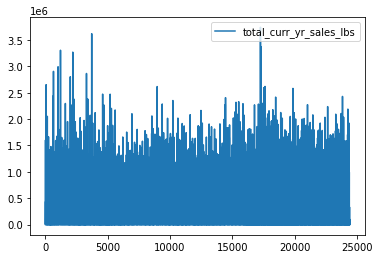

In [ ]:
df[['epm','total_curr_yr_sales_lbs']].plot()

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
test_df = df.copy()
test_df["epm"] = test_df["epm"].astype('category')
#test_df["epm_cat"] = test_df["epm"].cat.codes
test_df
test_df_1=test_df.reset_index().groupby(['epm','fscl_wk_end_dt']).agg(['sum']).reset_index()#.pivot(index='epm', columns='total_curr_yr_sales_lbs')
test_df_1.columns = ['epm','fscl_wk_end_dt','total_curr_yr_sales_lbs']
test_df_1
test_df_1 = test_df_1.pivot(index='fscl_wk_end_dt', columns='epm', values='total_curr_yr_sales_lbs')
#test_df_1.pivot(index='epm', columns='total_curr_yr_sales_lbs')
#test_df.groupby('epm_cat').agg(['sum']).reset_index()#.pivot(index='epm', columns='total_curr_yr_sales_lbs')#.plot()

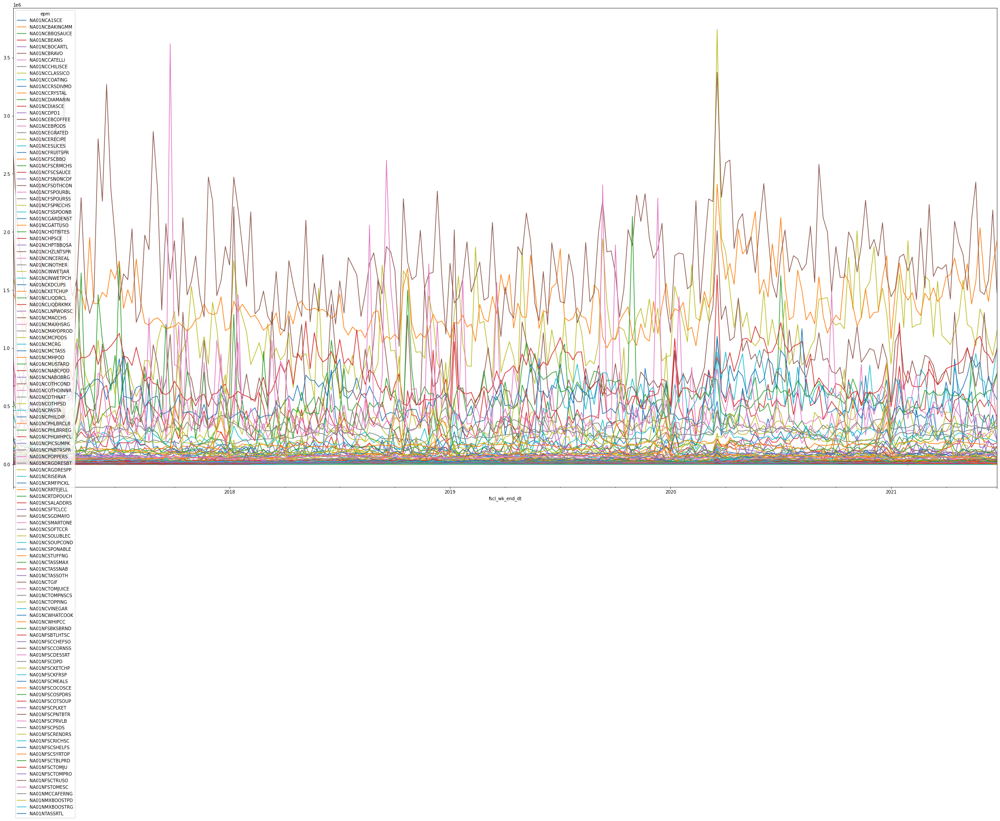

In [ ]:
test_df_1.plot(figsize = (40,20))

NA01NCA1SCE


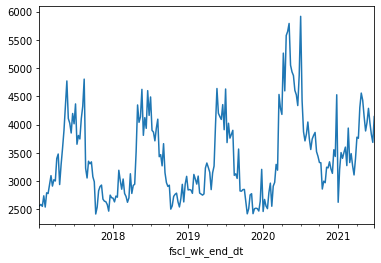

NA01NCBAKINGMM


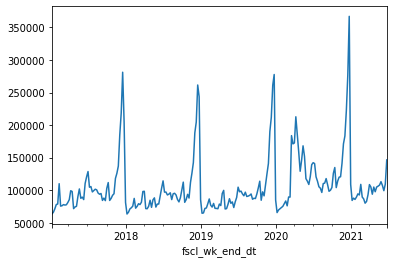

NA01NCBBQSAUCE


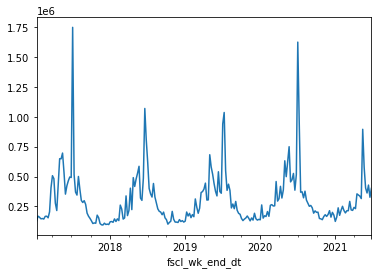

NA01NCBEANS


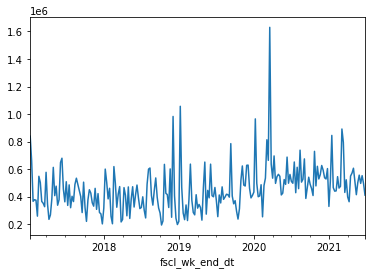

NA01NCBOCARTL


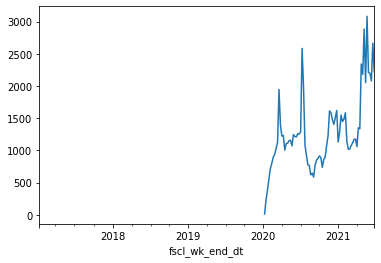

NA01NCBRAVO


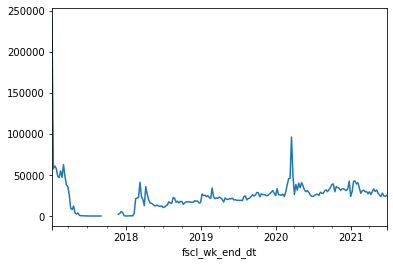

NA01NCCATELLI


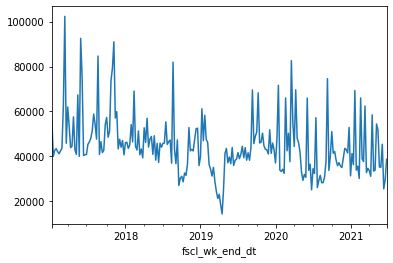

NA01NCCHILISCE


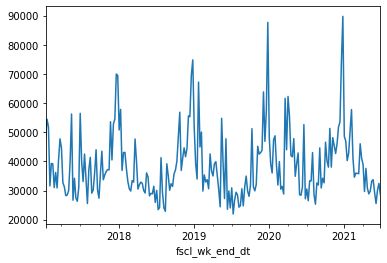

NA01NCCLASSICO


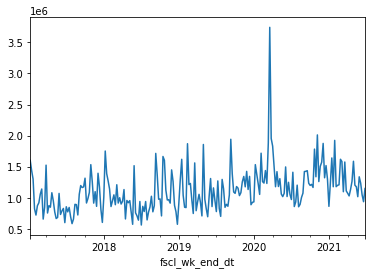

NA01NCCOATING


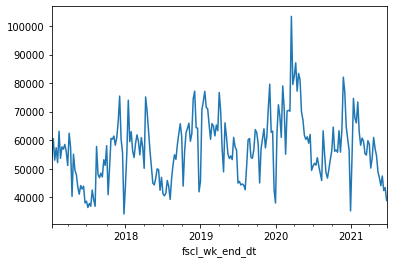

NA01NCCRSDIVMD


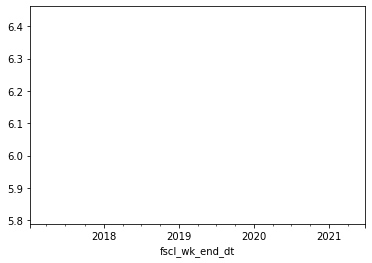

NA01NCCRYSTAL


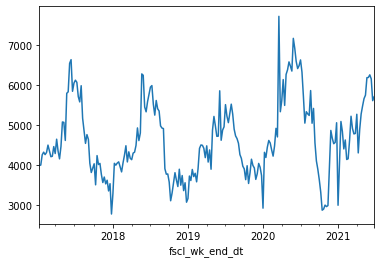

NA01NCDIAMARIN


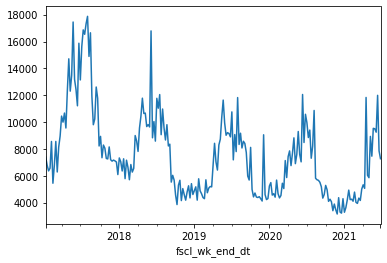

NA01NCDIASCE


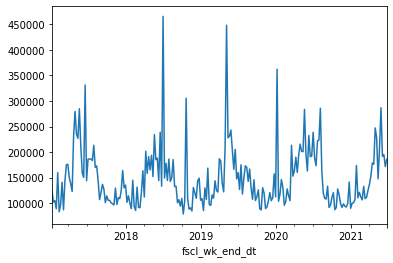

NA01NCDPD1


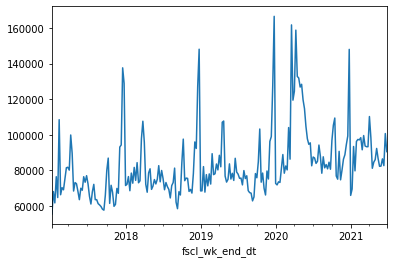

NA01NCEBCOFFEE


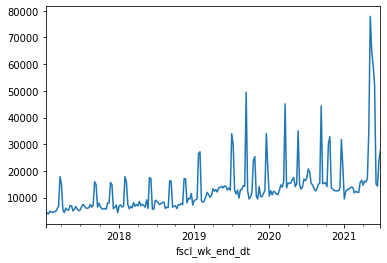

NA01NCEBPODS


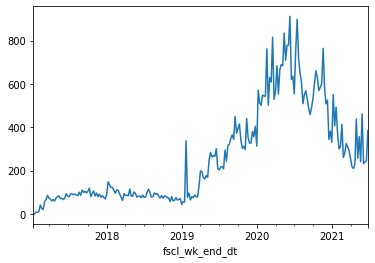

NA01NCEGRATED


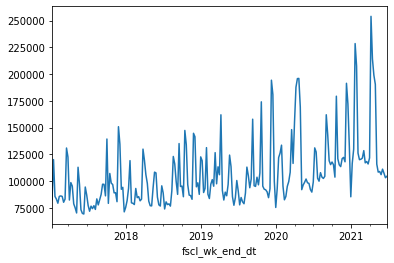

NA01NCERECIPE


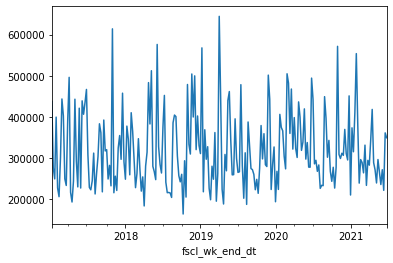

NA01NCESLICES


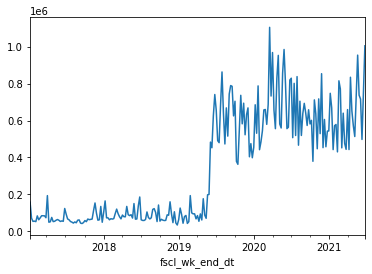

NA01NCFRUITSPR


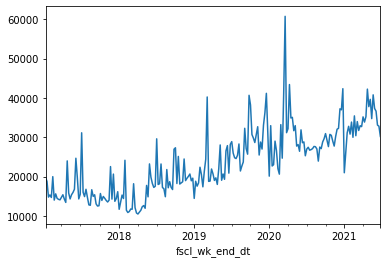

NA01NCFSCBBQ


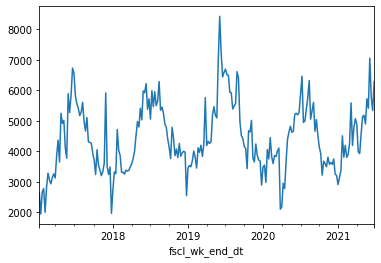

NA01NCFSCRMCHS


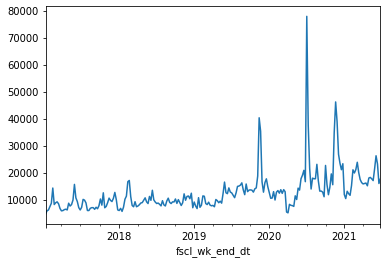

NA01NCFSCSAUCE


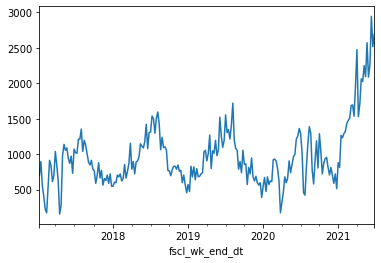

NA01NCFSNONCOF


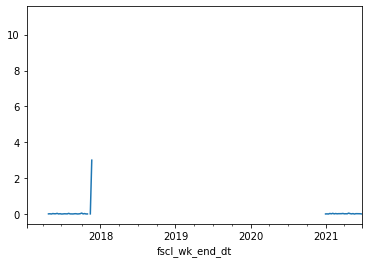

NA01NCFSOTHCON


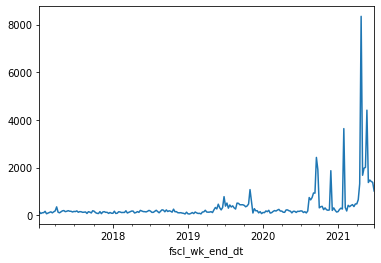

NA01NCFSPOURBL


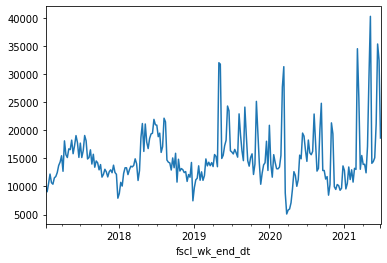

NA01NCFSPOURSS


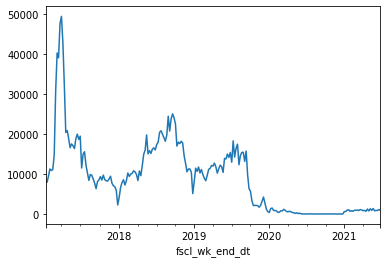

NA01NCFSPRCCHS


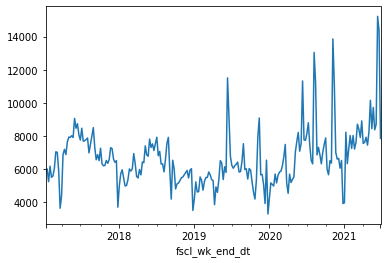

NA01NCFSSPOONB


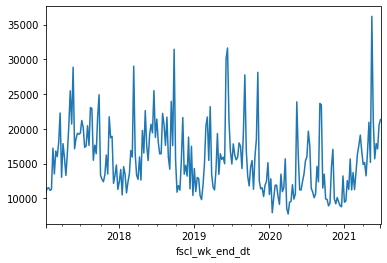

NA01NCGARDENST


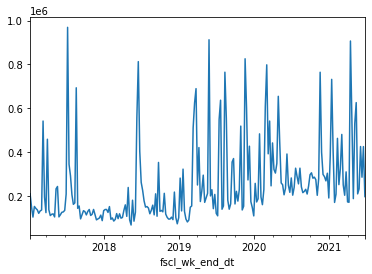

NA01NCGATTUSO


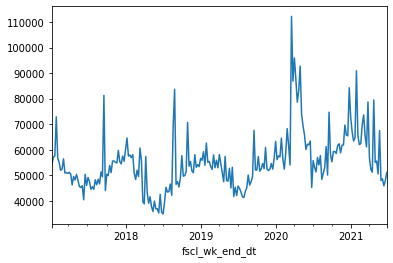

NA01NCHOTBITES


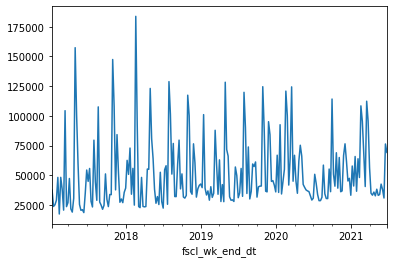

NA01NCHPSCE


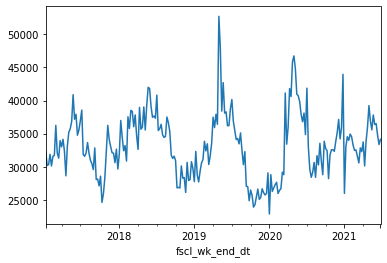

NA01NCHPTBBQSA


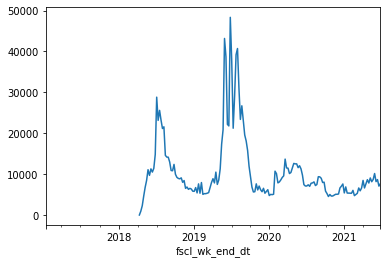

NA01NCHZLNTSPR


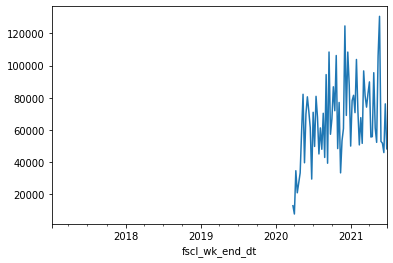

NA01NCINCEREAL


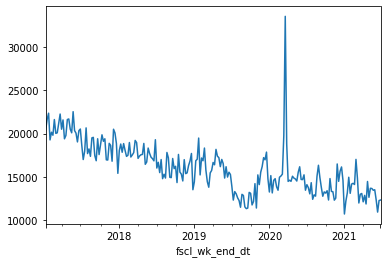

NA01NCINOTHER


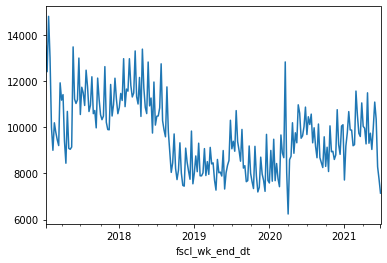

NA01NCINWETJAR


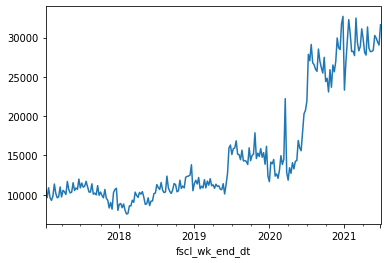

NA01NCINWETPCH


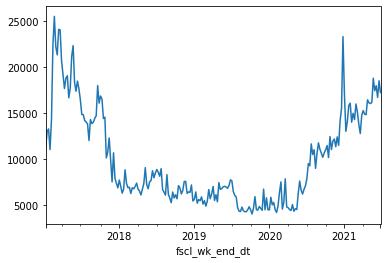

NA01NCKDCUPS


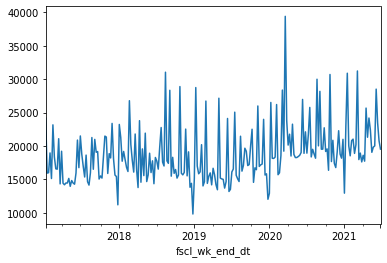

NA01NCKETCHUP


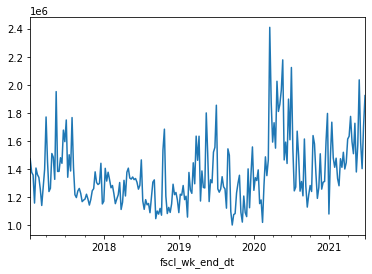

NA01NCLIQDRCL


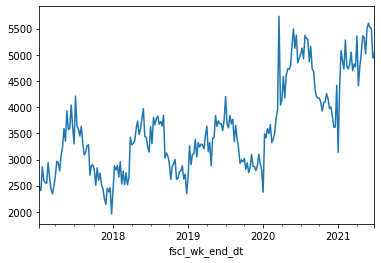

NA01NCLIQDRKMX


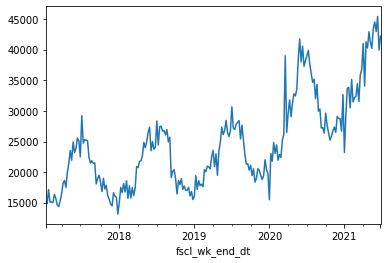

NA01NCLNPWORSC


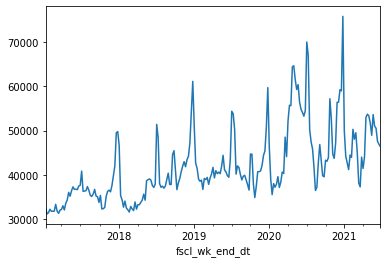

NA01NCMACCHS


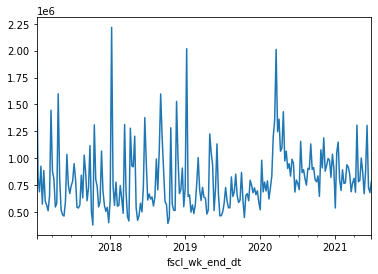

NA01NCMAXHSRG


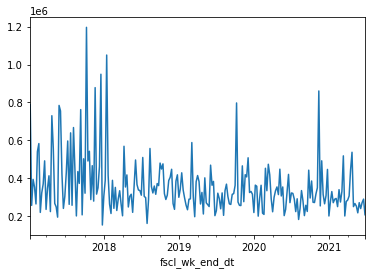

NA01NCMAYOPROD


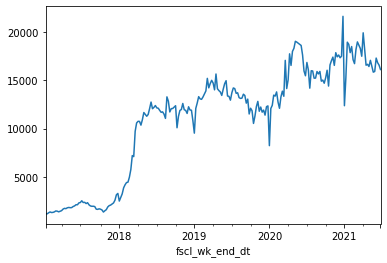

NA01NCMCPODS


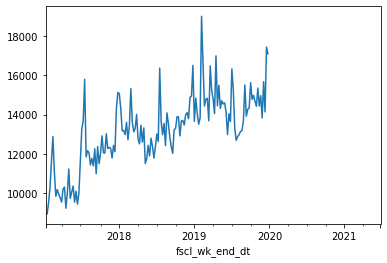

NA01NCMCRG


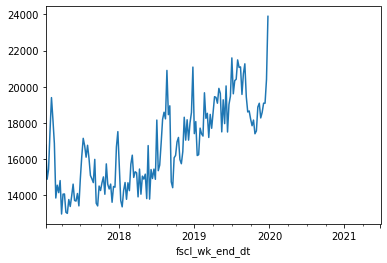

NA01NCMCTASS


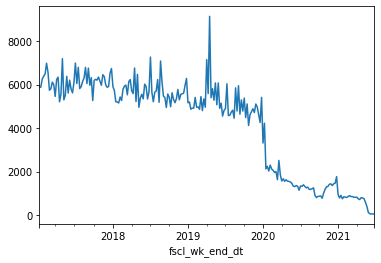

NA01NCMHPOD


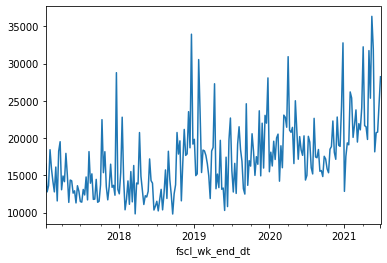

NA01NCMUSTARD


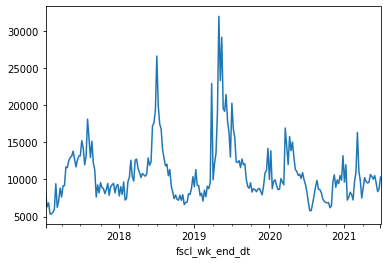

NA01NCNABCPOD


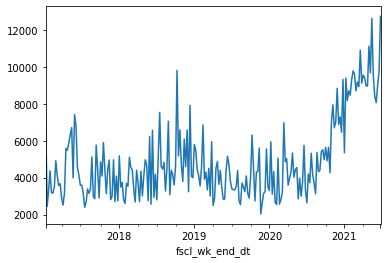

NA01NCNABOBRG


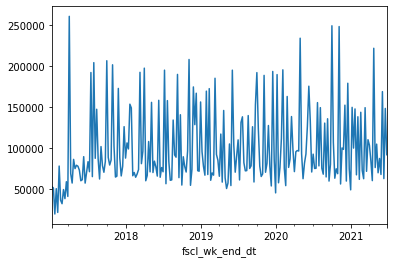

NA01NCOTHCOND


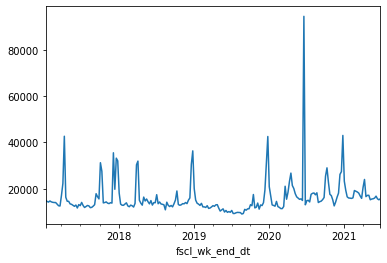

NA01NCOTHDINNR


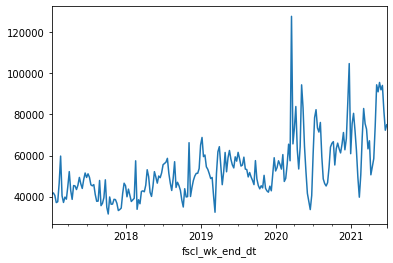

NA01NCOTHNAT


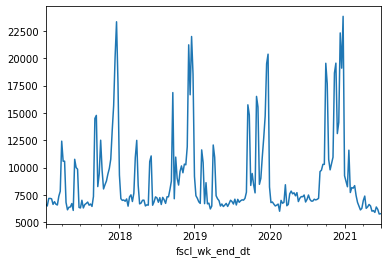

NA01NCOTHPSD


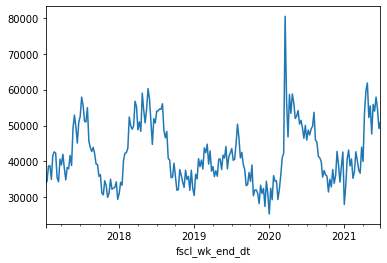

NA01NCPASTA


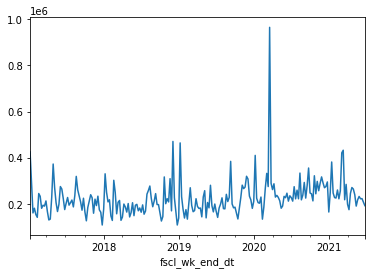

NA01NCPHILDIP


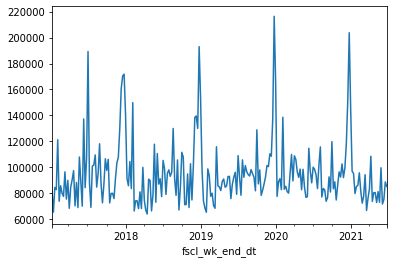

NA01NCPHLBRCLB


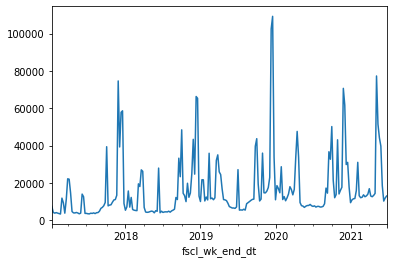

NA01NCPHLBRREG


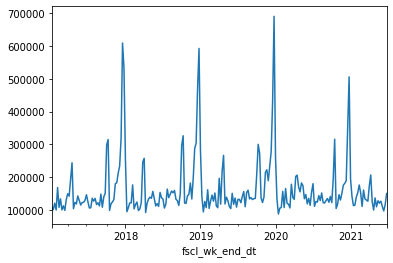

NA01NCPHLWHPCL


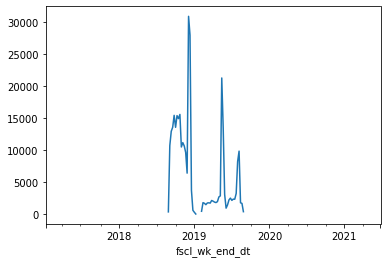

NA01NCPICSUMPK


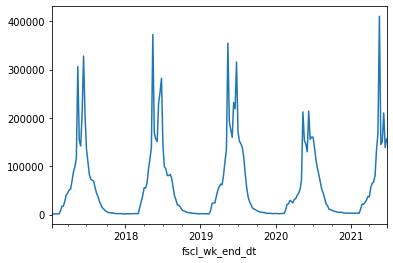

NA01NCPNBTRSPR


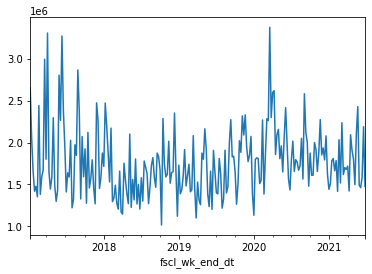

NA01NCPOPPERS


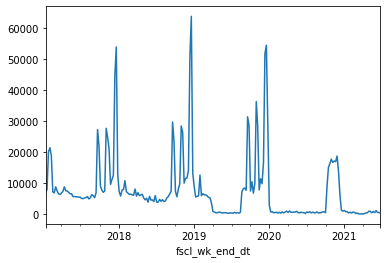

NA01NCRGDRESBT


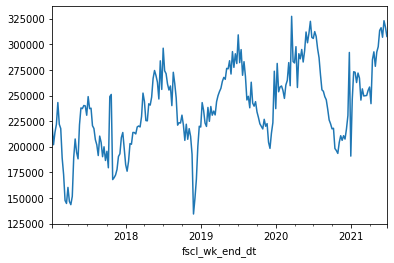

NA01NCRGDRESPP


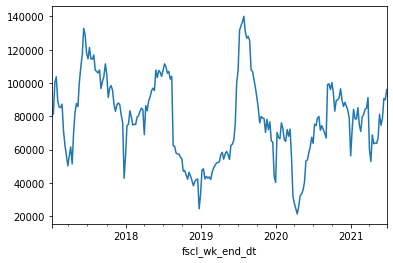

NA01NCRISERVA


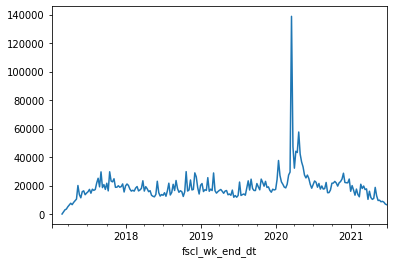

NA01NCRMFPICKL


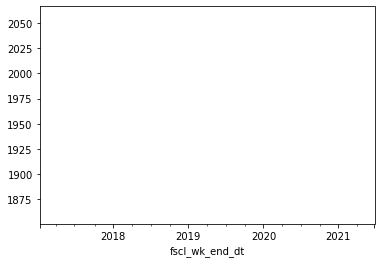

NA01NCRRTEJELL


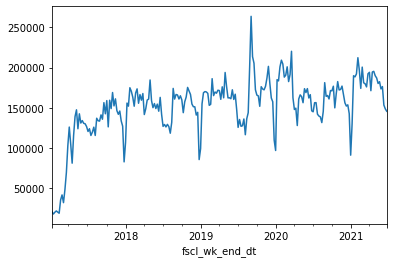

NA01NCRTDPOUCH


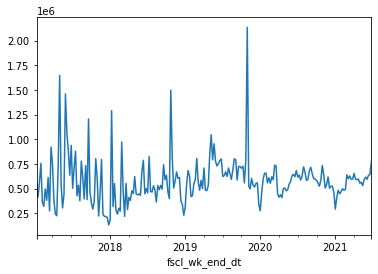

NA01NCSALADDRS


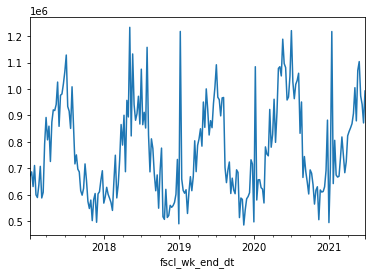

NA01NCSFTCLCC


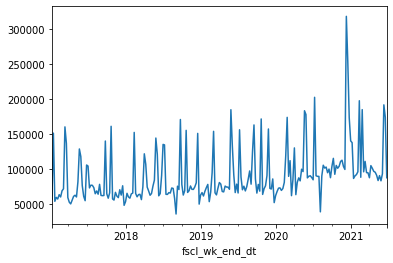

NA01NCSGDMAYO


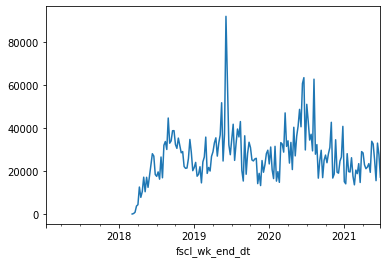

NA01NCSMARTONE


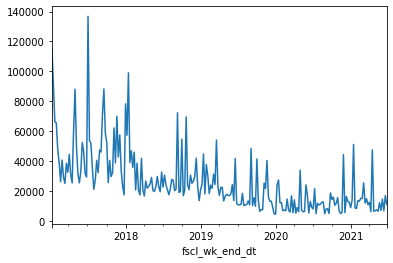

NA01NCSOFTCCR


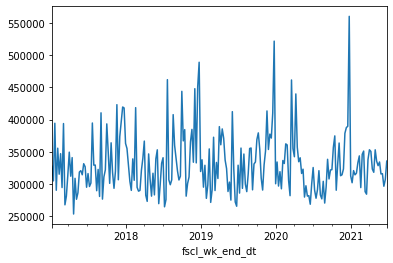

NA01NCSOLUBLEC


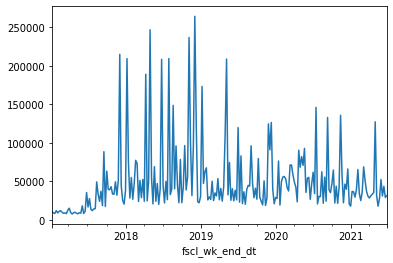

NA01NCSOUPCOND


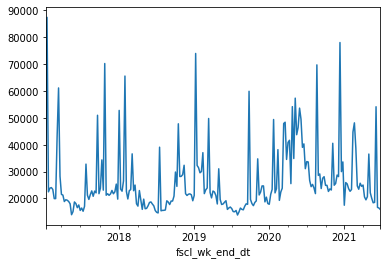

NA01NCSPONABLE


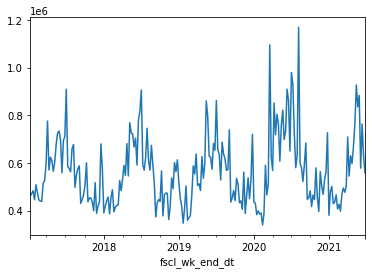

NA01NCSTUFFNG


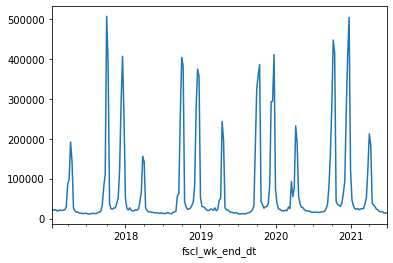

NA01NCTASSMAX


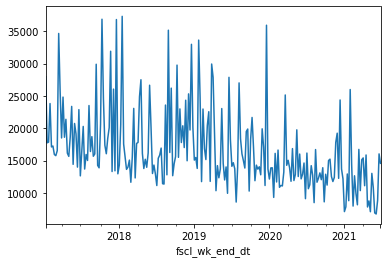

NA01NCTASSNAB


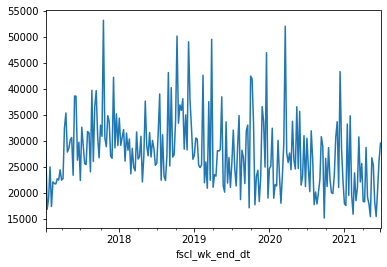

NA01NCTASSOTH


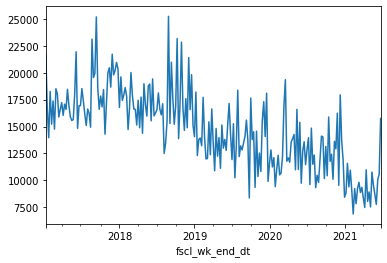

NA01NCTGIF


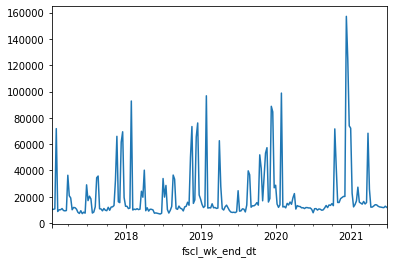

NA01NCTOMJUICE


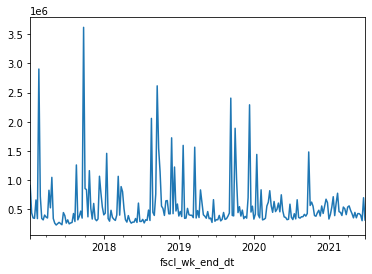

NA01NCTOMPNSCS


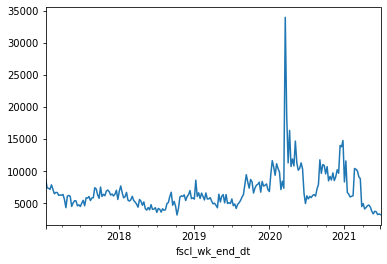

NA01NCTOPPING


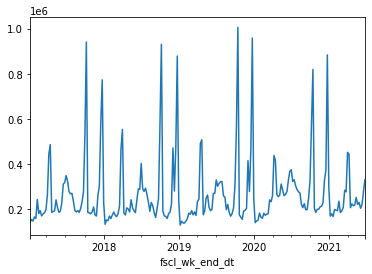

NA01NCVINEGAR


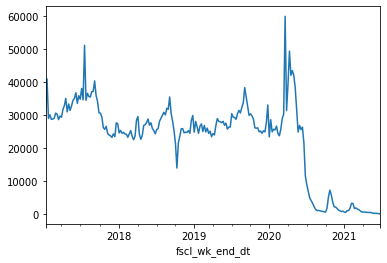

NA01NCWHATCOOK


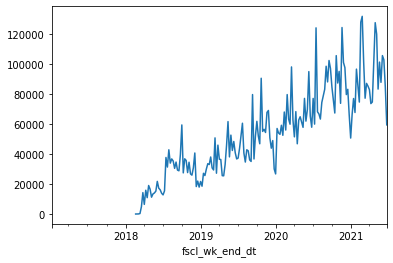

NA01NCWHIPCC


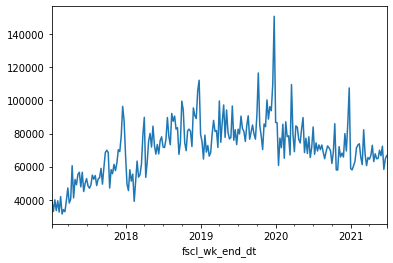

NA01NFSBKSBRND


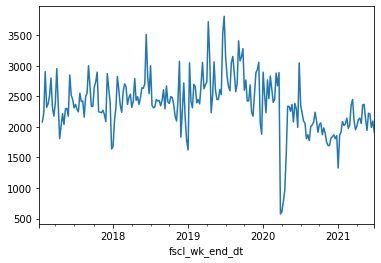

NA01NFSBTLHTSC


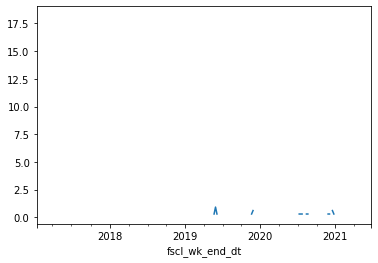

NA01NFSCCHEFSO


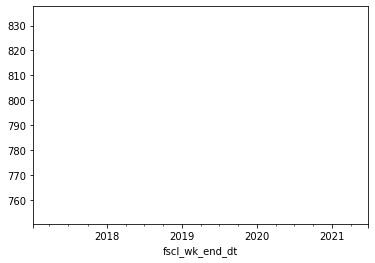

NA01NFSCCORNSS


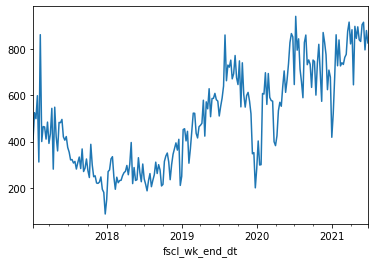

NA01NFSCDESSRT


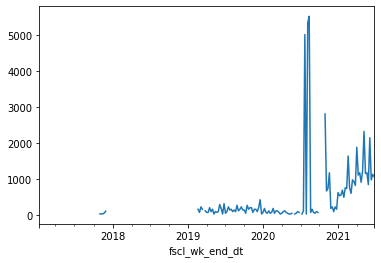

NA01NFSCDPD


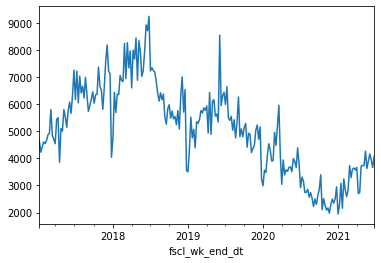

NA01NFSCKETCHP


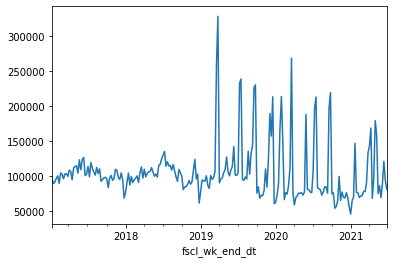

NA01NFSCKFRSP


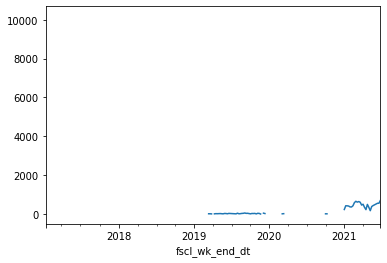

NA01NFSCMEALS


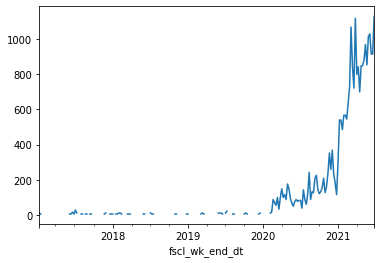

NA01NFSCOCOSCE


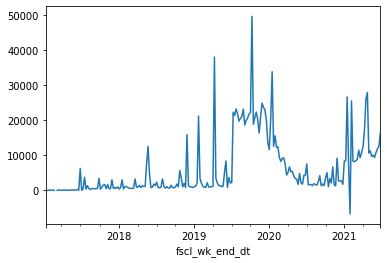

NA01NFSCOSPDRS


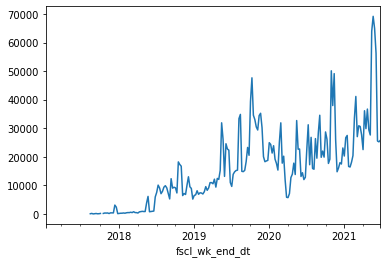

NA01NFSCOTSOUP


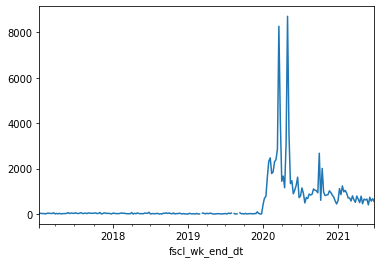

NA01NFSCPLKET


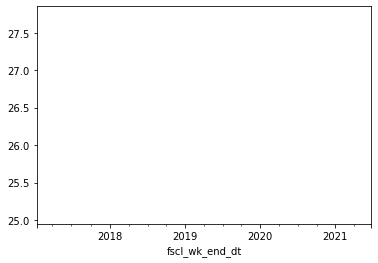

NA01NFSCPNTBTR


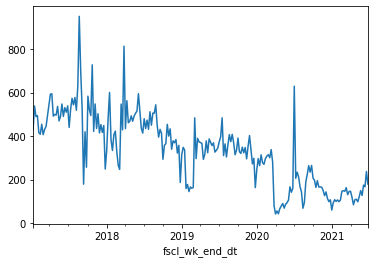

NA01NFSCPRVLB


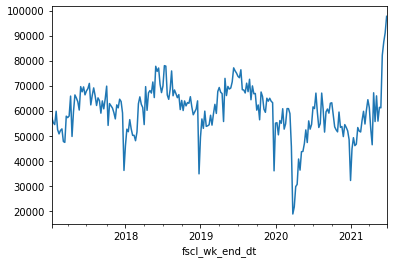

NA01NFSCPSDS


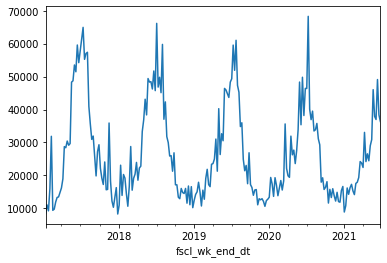

NA01NFSCRENDRS


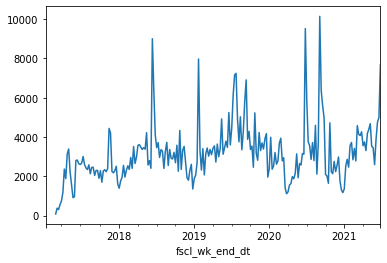

NA01NFSCRICHSC


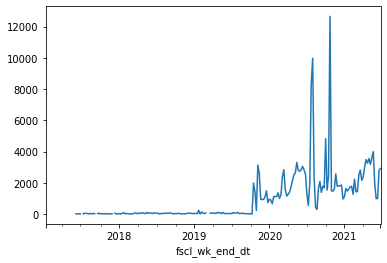

NA01NFSCSHELFS


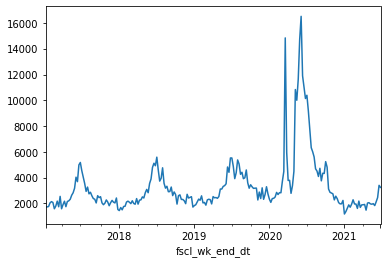

NA01NFSCSYRTOP


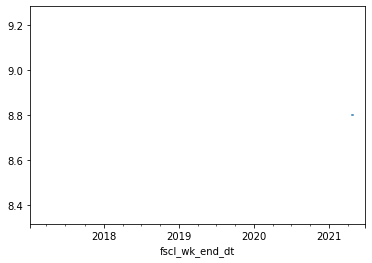

NA01NFSCTBLPRD


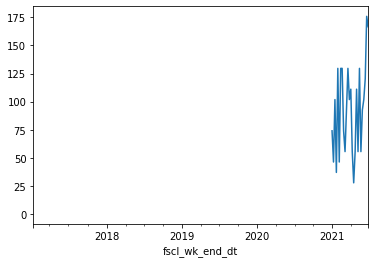

NA01NFSCTOMJU


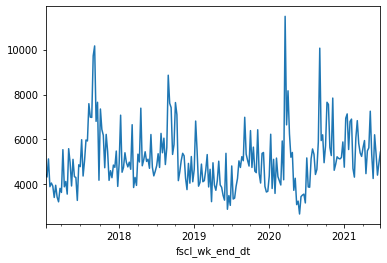

NA01NFSCTOMPRO


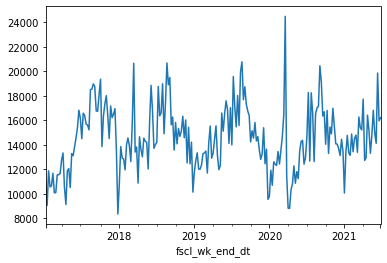

NA01NFSCTRUSO


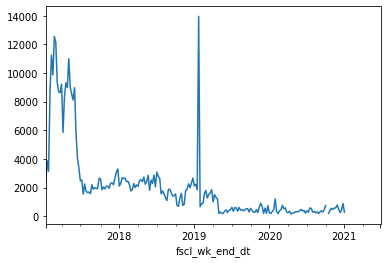

NA01NFSTOMESC


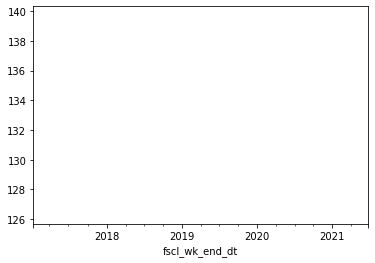

NA01NMCCAFERNG


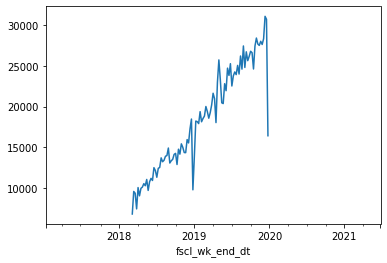

NA01NMXBOOSTPD


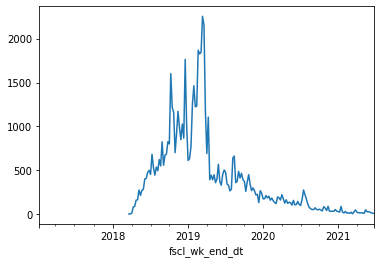

NA01NMXBOOSTRG


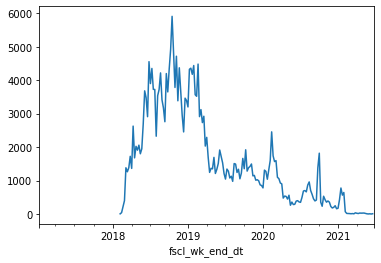

NA01NTASSRTL


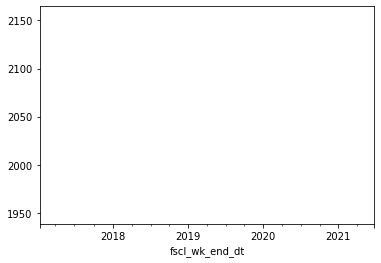

In [ ]:
for c in test_df_1.columns:
    print(c)
    test_df_1[c].plot()
    plt.show( block=False )

In [ ]:
pd.isnull(test_df_1).sum() > 0

epm
NA01NCA1SCE       False
NA01NCBAKINGMM    False
NA01NCBBQSAUCE    False
NA01NCBEANS       False
NA01NCBOCARTL      True
                  ...  
NA01NFSTOMESC      True
NA01NMCCAFERNG     True
NA01NMXBOOSTPD     True
NA01NMXBOOSTRG     True
NA01NTASSRTL       True
Length: 121, dtype: bool

In [ ]:
test_df_1['NA01NCCRSDIVMD'].sum()

6.125

In [ ]:
epm_df = df[df.epm=='NA01NCPICSUMPK'][['total_curr_yr_sales_lbs']]

,epm,total_curr_yr_sales_lbs
fscl_wk_end_dt,,
2019-01-26,NA01NCCRSDIVMD,6.125000000000000


In [ ]:
dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    train,
    train,
    sequence_length=13,
    sampling_rate=1,
    batch_size=1,
)

Shape of training data (233, 1)
233 14
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_42 (LSTM)               (None, 13, 64)            16896     
_________________________________________________________________
lstm_43 (LSTM)               (None, 32)                12416     
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 33        
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Epoch 1/32
6/6 [==============================] - 6s 311ms/step - loss: 1312837696.0000 - val_loss: 412190944.0000

Epoch 00001: val_loss improved from inf to 412190944.00000, saving model to weights.h5
Epoch 2/32
6/6 [==============================] - 0s 21ms/step - loss: 882444310.8571 - val_loss: 823649856.0000

Epoch 00002: val_loss d

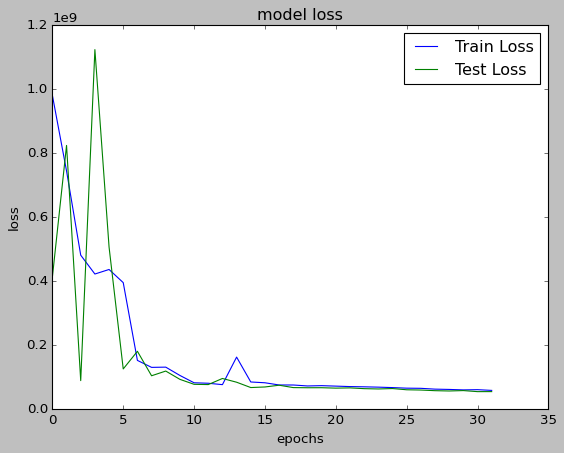

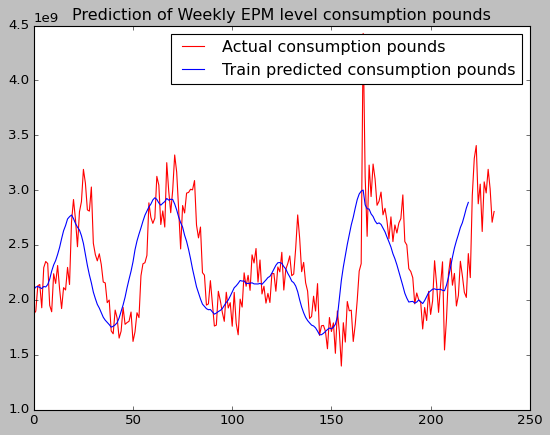

In [ ]:
#https://machinelearningmastery.com/how-to-develop-deep-learning-models-for-univariate-time-series-forecasting/

#epm_df = df[df.epm == 'NA01NCPNBTRSPR'][['total_curr_yr_sales_lbs']]
#NA01NCOTHPSD
epm_df = df[df.epm == 'NA01NCOTHPSD'][['total_curr_yr_sales_lbs']]
# Using multiple features (predictors)
total_curr_yr_sales_lbs_values = epm_df.values#.flatten()
print("Shape of training data " + str(total_curr_yr_sales_lbs_values.shape))

# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(total_curr_yr_sales_lbs_values)

#train_value = epm_df.index.get_loc('2021-03-27')
train = total_curr_yr_sales_lbs_values#[0:train_value,:], 
#test = total_curr_yr_sales_lbs_values[train_value:,:]
print(len(train), len(test))

lookback = 13
gen_train = tf.keras.preprocessing.sequence.TimeseriesGenerator(train, train, lookback, batch_size=1)
 
TX, TY = [], []

for inputs, targets in gen_train:
    TX.append(inputs.flatten())
    TY.append(targets.flatten()[0])

trainX, trainY = np.array(TX), np.array(TY)  
'''
#batch_size: The number of samples to return on each iteration . Here we are using 13 weeks of data to predict 14th entry. So lookback=13 and batch_size=1
gen_test = tf.keras.preprocessing.sequence.TimeseriesGenerator(test, test, lookback, batch_size=1)
 
TX1, TY1 = [], []

for inputs, targets in gen_test:
    TX1.append(inputs.flatten())
    TY1.append(targets.flatten()[0])

testX, testY = np.array(TX1), np.array(TY1)  
'''

# reshape input to be [samples, time steps, features]
trainX = trainX.reshape(trainX.shape[0], trainX.shape[1], 1)
#testX = testX.reshape(testX.shape[0], testX.shape[1], 1)

#trainX = trainX.reshape(trainX.shape[0], 1, trainX.shape[1])
#testX = testX.reshape(testX.shape[0], 1, testX.shape[1])

model = Sequential()
model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2])))
#model.add(LSTM(50, return_sequences=True, activation='relu', input_dim = lookback ))
#model.add(Dropout(0.1))
model.add(LSTM(units=32, activation='relu', return_sequences=False))
#model.add(Dropout(0.1))
# Output layer
model.add(Dense(units=1, activation='relu'))

# Compiling the Neural Network
model.compile(optimizer = Adam(learning_rate=0.01), loss='mean_squared_error')

model.summary()

es = EarlyStopping(monitor='val_loss', min_delta=1e-10, patience=10, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
mcp = ModelCheckpoint(filepath='weights.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True)
tb = TensorBoard('logs')

history = model.fit(trainX, trainY, shuffle=True, epochs=32, callbacks=[es, rlr, mcp, tb], validation_split=0.2, verbose=1, batch_size=32) #model.fit(trainX, trainY, epochs=200, callbacks=[es, rlr, mcp, tb], verbose=1)

plt.style.use('classic')
plt.plot(history.history["loss"], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show();

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(trainX[-lookback:])
# invert predictions
trainPredict_inverse = scaler.inverse_transform(trainPredict)
#trainY = scaler.inverse_transform([trainY])
testPredict_inverse = scaler.inverse_transform(testPredict)
#testY = scaler.inverse_transform([testY])
'''
# calculate root mean squared error
trainScore_rmse = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore_rmse))
trainScore_mae = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train Score: %.2f MAE' % (trainScore_mae))
trainScore_mape = mean_absolute_percentage_error(trainY[0], trainPredict[:,0])
print('Train Score: %.2f MAPE' % (trainScore_mape))

testScore_rmse = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore_rmse))
testScore_mae = mean_absolute_error(testY[0], testPredict[:,0])
print('Test Score: %.2f MAE' % (testScore_mae))
testScore_mape = mean_absolute_percentage_error(testY[0], testPredict[:,0])
print('Test Score: %.2f MAPE' % (testScore_mape))

# shift train predictions for plotting
trainPredictPlot = np.empty_like(trainY)
trainPredictPlot[:, :] = np.nan
#trainPredictPlot[lookback:len(trainPredict)+lookback, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(testY)
testPredictPlot[:, :] = np.nan
#testPredictPlot[len(trainPredict)+(lookback*2)+1:len(total_curr_yr_sales_lbs_values)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(total_curr_yr_sales_lbs_values), color='red', label = 'Actual consumption pounds')
plt.plot(trainPredict, color = 'blue', label = 'Train predicted consumption pounds')
plt.plot(testPredict, color = 'green', label = 'Test predicted consumption pounds')

plt.plot(PREDICTIONS_FUTURE.index, PREDICTIONS_FUTURE['Open'], color='r', label='Predicted Stock Price')
plt.plot(PREDICTION_TRAIN.loc[START_DATE_FOR_PLOTTING:].index, PREDICTION_TRAIN.loc[START_DATE_FOR_PLOTTING:]['Open'], color='orange', label='Training predictions')
plt.plot(dataset_train.loc[START_DATE_FOR_PLOTTING:].index, dataset_train.loc[START_DATE_FOR_PLOTTING:]['Open'], color='b', label='Actual Stock Price')
'''
plt.plot(scaler.inverse_transform(total_curr_yr_sales_lbs_values), color='red', label = 'Actual consumption pounds')
#plt.plot(epm_df.reset_index()[['total_curr_yr_sales_lbs']], color='red', label = 'Actual consumption pounds')
plt.plot(trainPredict_inverse, color = 'blue', label = 'Train predicted consumption pounds')

plt.title('Prediction of Weekly EPM level consumption pounds')
plt.legend(loc='upper right')
plt.show()

In [ ]:
lookback = 13
gen_train = tf.keras.preprocessing.sequence.TimeseriesGenerator(trainX, trainX, lookback, batch_size=1)
 
TX, TY = [], []

for inputs, targets in gen_train:
    TX.append(np.ravel(inputs))
    TY.append(np.ravel(targets))

trainX, trainY = np.array(TX), np.array(TY)  
TX

[array([-0.16779777, -0.63121974, -0.60575497, -0.28041271, -0.64602056,
        -0.34292549, -0.31470281,  0.63071108, -0.237665  , -0.4003821 ,
         0.15193672, -0.04387538,  0.19137493]),
 array([-0.63121974, -0.60575497, -0.28041271, -0.64602056, -0.34292549,
        -0.31470281,  0.63071108, -0.237665  , -0.4003821 ,  0.15193672,
        -0.04387538,  0.19137493, -0.18949339]),
 array([-0.60575497, -0.28041271, -0.64602056, -0.34292549, -0.31470281,
         0.63071108, -0.237665  , -0.4003821 ,  0.15193672, -0.04387538,
         0.19137493, -0.18949339, -0.95674586]),
 array([-0.28041271, -0.64602056, -0.34292549, -0.31470281,  0.63071108,
        -0.237665  , -0.4003821 ,  0.15193672, -0.04387538,  0.19137493,
        -0.18949339, -0.95674586, -0.02328293]),
 array([-0.64602056, -0.34292549, -0.31470281,  0.63071108, -0.237665  ,
        -0.4003821 ,  0.15193672, -0.04387538,  0.19137493, -0.18949339,
        -0.95674586, -0.02328293,  0.41274372]),
 array([-0.34292549, -0.3

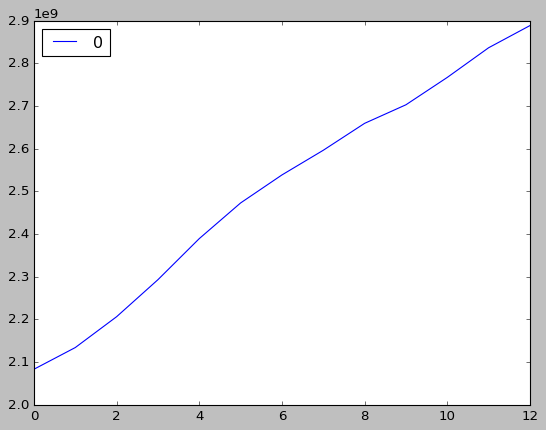

In [ ]:
pd.DataFrame(testPredict_inverse).plot()

In [ ]:
trainX.shape

(220, 13, 1)

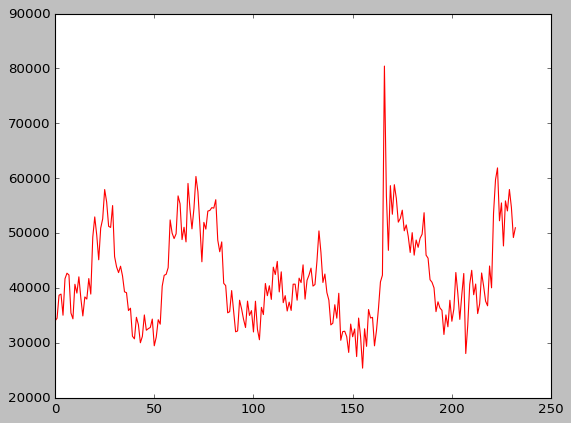

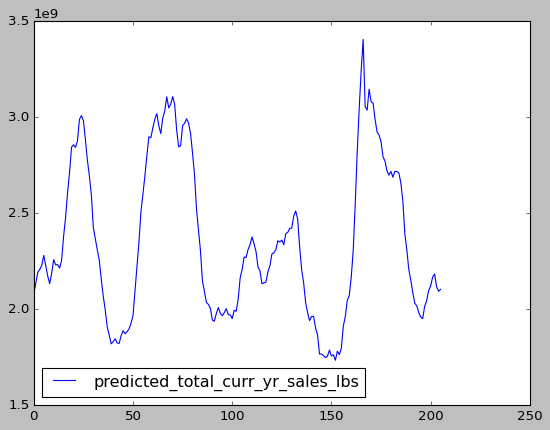

In [ ]:
plt.plot(epm_df.reset_index()[['total_curr_yr_sales_lbs']], color='red', label = 'Actual consumption pounds')
train_pred_df = pd.DataFrame(trainPredict_inverse, columns = ['predicted_total_curr_yr_sales_lbs'])
#train_pred_df.index = epm_df.index
train_pred_df.plot(color='blue', label = 'Predicted consumption pounds')

In [ ]:
train_pred_df = pd.DataFrame(trainPredict_inverse, columns = 'predicted_total_curr_yr_sales_lbs')
train_pred_df.plot(color='blue', label = 'Predicted consumption pounds'))

,0
0,2182084096.000000000000000
1,2228071424.000000000000000
2,2218522880.000000000000000
3,2209037056.000000000000000
4,2164829440.000000000000000
...,...
188,1913930624.000000000000000
189,1969772416.000000000000000
190,2034569216.000000000000000
191,2090465792.000000000000000


In [ ]:
keras.utils.plot_model(model, "my_first_model.png")

AssertionError: ignored

In [ ]:
keras.utils.plot_model(model, "my_first_model_with_shape_info.png", show_shapes=True)

AssertionError: ignored

In [ ]:
scan_object = talos.Scan(trainX, trainY, model=model, params=p, experiment_name='epm', fraction_limit=0.1)

IndexError: ignored

In [ ]:
# define the grid search parameters
from sklearn.metrics import fbeta_score, make_scorer
ftwo_scorer = make_scorer(fbeta_score, beta=2)
ftwo_scorer
make_scorer(fbeta_score, beta=2)

batch_size = [1, 2, 3, 4, 5, 10]
epochs = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3, scoring=fbeta_score)
grid_result = grid.fit(trainX, trainY)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

ValueError: ignored

In [ ]:
import numpy
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
# Function to create model, required for KerasClassifier
def create_model():
	# create model
	model = Sequential()
	model.add(Dense(12, input_dim=8, activation='relu'))
	model.add(Dense(1, activation='sigmoid'))
	# Compile model
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
# load dataset
dataset = numpy.loadtxt("pima-indians-diabetes.csv", delimiter=",")
# split into input (X) and output (Y) variables
X = dataset[:,0:8]
Y = dataset[:,8]
# create model
model = KerasClassifier(build_fn=create_model, verbose=0)
# define the grid search parameters
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X, Y)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
# reshape input to be [samples, time steps, features]
X_train = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
X_train.shape

(193, 1, 13)

In [ ]:
trainX.reshape(trainX.shape[0], trainX.shape[1], 1).shape

(193, 13, 1)

In [ ]:
datelist_future = df_mth_end_dates.fscl_wk_end_dt
datelist_future

0    2021-07-03
1    2021-07-10
2    2021-07-17
3    2021-07-24
4    2021-07-31
        ...    
74   2022-12-03
75   2022-12-10
76   2022-12-17
77   2022-12-24
78   2022-12-31
Name: fscl_wk_end_dt, Length: 79, dtype: datetime64[ns]

In [ ]:
# Perform predictions
predictions_future = model.predict(trainX[-lookback:])
predictions_future = scaler.inverse_transform(predictions_future)
predictions_future

'''
PREDICTIONS_FUTURE = pd.DataFrame(y_pred_future, columns=['Open']).set_index(pd.Series(datelist_future))
PREDICTION_TRAIN = pd.DataFrame(y_pred_train, columns=['Open']).set_index(pd.Series(datelist_train[2 * n_past + n_future -1:]))

# Convert <datetime.date> to <Timestamp> for PREDCITION_TRAIN
PREDICTION_TRAIN.index = PREDICTION_TRAIN.index.to_series().apply(datetime_to_timestamp)

PREDICTION_TRAIN.head(3)
'''

"\nPREDICTIONS_FUTURE = pd.DataFrame(y_pred_future, columns=['Open']).set_index(pd.Series(datelist_future))\nPREDICTION_TRAIN = pd.DataFrame(y_pred_train, columns=['Open']).set_index(pd.Series(datelist_train[2 * n_past + n_future -1:]))\n\n# Convert <datetime.date> to <Timestamp> for PREDCITION_TRAIN\nPREDICTION_TRAIN.index = PREDICTION_TRAIN.index.to_series().apply(datetime_to_timestamp)\n\nPREDICTION_TRAIN.head(3)\n"

In [ ]:
trainX[-13:]

array([[[1434935.3053376],
        [1798984.25003  ],
        [2016623.7632288],
        [1655279.3802138],
        [1795481.10885  ],
        [1767564.5348988],
        [1670226.72586  ],
        [1723702.5176888],
        [2050227.6835788],
        [1565255.3539326],
        [2581467.270855 ],
        [2121606.0921176],
        [2001373.2823326]],

       [[1798984.25003  ],
        [2016623.7632288],
        [1655279.3802138],
        [1795481.10885  ],
        [1767564.5348988],
        [1670226.72586  ],
        [1723702.5176888],
        [2050227.6835788],
        [1565255.3539326],
        [2581467.270855 ],
        [2121606.0921176],
        [2001373.2823326],
        [1479540.8526888]],

       [[2016623.7632288],
        [1655279.3802138],
        [1795481.10885  ],
        [1767564.5348988],
        [1670226.72586  ],
        [1723702.5176888],
        [2050227.6835788],
        [1565255.3539326],
        [2581467.270855 ],
        [2121606.0921176],
        [2001373.2823326

In [ ]:
predictions_future

array([[4.1318899e+12],
       [4.3441269e+12],
       [4.1503501e+12],
       [4.1303102e+12],
       [4.3293648e+12],
       [4.4389635e+12],
       [4.1663563e+12],
       [4.5922176e+12],
       [4.1671889e+12],
       [4.2174057e+12],
       [4.5265857e+12],
       [4.2812705e+12],
       [4.0460519e+12]], dtype=float32)

---Batch---
Feature: [[[0.        ]
  [0.00063915]
  [0.00050608]
  [0.00017541]
  [0.00036494]
  [0.00088513]
  [0.0155372 ]
  [0.03927447]
  [0.0400104 ]
  [0.06497154]
  [0.0964149 ]
  [0.10698407]
  [0.12185591]]]
Label: [[0.]]

---Batch---
Feature: [[[0.00063915]
  [0.00050608]
  [0.00017541]
  [0.00036494]
  [0.00088513]
  [0.0155372 ]
  [0.03927447]
  [0.0400104 ]
  [0.06497154]
  [0.0964149 ]
  [0.10698407]
  [0.12185591]
  [0.12553757]]]
Label: [[0.00063915]]

---Batch---
Feature: [[[0.00050608]
  [0.00017541]
  [0.00036494]
  [0.00088513]
  [0.0155372 ]
  [0.03927447]
  [0.0400104 ]
  [0.06497154]
  [0.0964149 ]
  [0.10698407]
  [0.12185591]
  [0.12553757]
  [0.16727991]]]
Label: [[0.00050608]]

---Batch---
Feature: [[[1.7541344e-04]
  [3.6494085e-04]
  [8.8513247e-04]
  [1.5537198e-02]
  [3.9274473e-02]
  [4.0010404e-02]
  [6.4971536e-02]
  [9.6414901e-02]
  [1.0698407e-01]
  [1.2185591e-01]
  [1.2553757e-01]
  [1.6727991e-01]
  [2.1278661e-01]]]
Label: [[0.00017541]]

---Ba

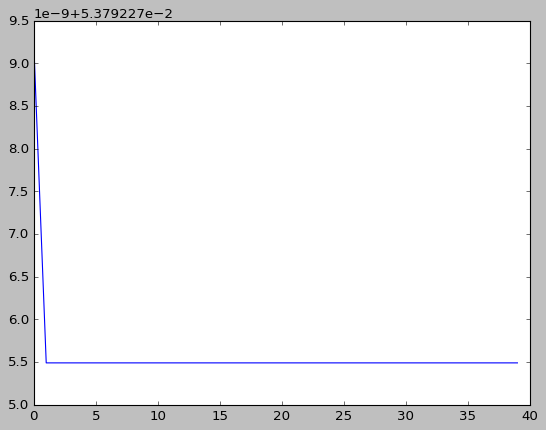

34/34 [==============================] - 1s 2ms/step - loss: 10750616576.0000


TypeError: ignored

In [ ]:
def print_dataset(ds):
    for inputs, targets in ds:
        print("---Batch---")
        print("Feature:", inputs.numpy())
        print("Label:", targets.numpy())
        print("")
 
def print_generator(gen):
    for inputs, targets in gen:
        print("---Batch---")
        print("Feature:", inputs)
        print("Label:", targets)
        print("")

def get_dataset(df, seq_len, batch_size):
    val = df.values
    return tf.keras.preprocessing.sequence.TimeseriesGenerator(val, val, seq_len, batch_size=batch_size)

def create_model():
    model = tf.keras.models.Sequential([tf.keras.layers.LSTM(64, return_sequences=True, activation='relu'),tf.keras.layers.LSTM(32, return_sequences=False, activation='relu'),tf.keras.layers.Dense(1, activation='relu')])
    model.compile(loss=tf.losses.MeanSquaredError(),optimizer=tf.optimizers.Adam(learning_rate=0.01))
    return model

epm_df = df[df.epm=='NA01NCPICSUMPK'][['total_curr_yr_sales_lbs']]
#df = epm_df #pd.read_csv("https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv", usecols=["Temp"])
total_curr_yr_sales_lbs_values = epm_df.total_curr_yr_sales_lbs.values
entire_dataset = epm_df.total_curr_yr_sales_lbs.values #numpy.ndarray
entire_dataset = entire_dataset.astype('float32')
entire_dataset = np.reshape(entire_dataset, (-1, 1))
scaler = MinMaxScaler(feature_range=(0, 1))
entire_dataset = scaler.fit_transform(entire_dataset)

num_samples = len(entire_dataset)
separator = int(num_samples * 0.8)

train = epm_df[:separator]
test = epm_df[separator:]

train_values = entire_dataset[:separator]
test_values = entire_dataset[separator:]

#train_ds = get_dataset(train, 13, 1)
train_ds = tf.keras.preprocessing.timeseries_dataset_from_array(train_values, train_values, sequence_length=13, batch_size=1)
for tr_inputs, tr_targets in train_ds:
    print("---Batch---")
    print("Feature:", tr_inputs.numpy())
    print("Label:", tr_targets.numpy())
    print("")

test_ds = tf.keras.preprocessing.timeseries_dataset_from_array(test_values, test_values, sequence_length=13, batch_size=1)
for tt_inputs, tt_targets in test_ds:
    print("---Batch---")
    print("Feature:", tt_inputs.numpy())
    print("Label:", tt_targets.numpy())
    print("")

m = create_model()
es = EarlyStopping(monitor='val_loss', min_delta=0.0001, patience=20, verbose=1)
rlr = ReduceLROnPlateau(monitor='val_loss', min_delta=0.0001, factor=0.01, patience=5, verbose=1)
mcp = ModelCheckpoint(filepath='weights.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True)
tb = TensorBoard('logs')

#history = model.fit(trainX, trainY, shuffle=True, epochs=32, callbacks=[es, rlr, mcp, tb], validation_split=0.2, verbose=1, batch_size=32) #model.fit(trainX, trainY, epochs=200, callbacks=[es, rlr, mcp, tb], verbose=1)

#history = m.fit(train_ds, epochs=40, verbose=1, callbacks=[es, rlr, mcp, tb])
history = m.fit(train_ds, epochs=40, verbose=1)
 
plt.style.use('classic')
plt.plot(history.history["loss"], label="Train Loss")
#plt.plot(history.history["val_loss"])
plt.show( block=False )

test_ds = get_dataset(test, 13, 1)
m.evaluate(test_ds)

train_predictions = m.predict(train_ds)
# invert predictions
train_predictions_inverse = scaler.inverse_transform(train_predictions)

test_predictions = m.predict(test_ds)
# invert predictions
test_predictions_inverse = scaler.inverse_transform(test_predictions)

# Perform predictions
predictions_future = m.predict(train_ds[-104:])
predictions_future_inverse = scaler.inverse_transform(predictions_future)

plt.plot(scaler.inverse_transform(entire_dataset), color='red', label = 'Actual consumption pounds')
plt.plot(train_predictions_inverse, color = 'blue', label = 'Train predicted consumption pounds')
plt.plot(test_predictions_inverse, color = 'green', label = 'Test predicted consumption pounds')
plt.plot(predictions_future_inverse, color = 'green', label = 'Test predicted consumption pounds')

plt.title('Prediction of Weekly EPM level consumption pounds')
plt.legend(loc='upper right')
plt.show( block=False )


'''
# shift train predictions for plotting
trainPredictPlot = np.empty_like(trainY)
trainPredictPlot[:, :] = np.nan
#trainPredictPlot[lookback:len(trainPredict)+lookback, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(testY)
testPredictPlot[:, :] = np.nan
#testPredictPlot[len(trainPredict)+(lookback*2)+1:len(total_curr_yr_sales_lbs_values)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(entire_dataset), color='red', label = 'Actual consumption pounds')
plt.plot(train_predictions_inverse, color = 'blue', label = 'Train predicted consumption pounds')
plt.plot(test_predictions_inverse, color = 'green', label = 'Test predicted consumption pounds')

plt.plot(PREDICTIONS_FUTURE.index, PREDICTIONS_FUTURE['Open'], color='r', label='Predicted Stock Price')
plt.plot(PREDICTION_TRAIN.loc[START_DATE_FOR_PLOTTING:].index, PREDICTION_TRAIN.loc[START_DATE_FOR_PLOTTING:]['Open'], color='orange', label='Training predictions')
plt.plot(dataset_train.loc[START_DATE_FOR_PLOTTING:].index, dataset_train.loc[START_DATE_FOR_PLOTTING:]['Open'], color='b', label='Actual Stock Price')

plt.plot(scaler.inverse_transform(total_curr_yr_sales_lbs_values), color='red', label = 'Actual consumption pounds')
#plt.plot(epm_df.reset_index()[['total_curr_yr_sales_lbs']], color='red', label = 'Actual consumption pounds')
plt.plot(trainPredict_inverse, color = 'blue', label = 'Train predicted consumption pounds')

plt.title('Prediction of Weekly EPM level consumption pounds')
plt.legend(loc='upper right')
plt.show()

test_labels = []
 
for batch in test_ds:
    test_labels.append(batch[1][0][0])
 
days = np.arange(0, predictions.shape[0])
plt.plot(days, test_labels)
plt.plot(days, predictions[:,0], color='yellow')

'''

In [ ]:
tr_inputs.shape

TensorShape([1, 13, 1])

In [ ]:
test_predictions_inverse

array([[1.2234750e+03],
       [1.7831787e+08],
       [1.2234750e+03],
       [7.9105584e+07],
       [2.4205674e+08],
       [1.6138125e+08],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [6.0826758e+08],
       [1.2234750e+03],
       [4.6244252e+07],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [7.5651994e+08],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.4220852e+09],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03],
       [5.7496064e+09],
       [1.2234750e+03],
       [1.2234750e+03],
       [1.2234750e+03]], dtype=float32)

In [ ]:
entire_dataset = entire_dataset.reshape((-1))

def predict(num_prediction, model):
    prediction_list = entire_dataset[-13:]
    
    for _ in range(num_prediction):
        x = prediction_list[-13:]
        x = x.reshape((1, 13, 1))
        out = model.predict(x)[0][0]
        prediction_list = np.append(prediction_list, out)
    prediction_list = prediction_list[13-1:]
        
    return prediction_list
    
def predict_dates(num_prediction):
    last_date = epm_df['fscl_wk_end_dt'].values[-1]
    prediction_dates = pd.date_range(last_date, periods=num_prediction+1).tolist()
    return prediction_dates

num_prediction = 1
forecast = predict(num_prediction, m)
forecast_dates = df_mth_end_dates.fscl_wk_end_dt
forecast_inverse = scaler.inverse_transform(forecast)
forecast_inverse

ValueError: ignored

In [ ]:
epm_df.total_curr_yr_sales_lbs.values.reshape(-1,1)

array([[  1223.475    ],
       [  1485.       ],
       [  1430.55     ],
       [  1295.25     ],
       [  1372.8      ],
       [  1585.65     ],
       [  7580.925    ],
       [ 17293.65     ],
       [ 17594.775    ],
       [ 27808.275    ],
       [ 40674.15     ],
       [ 44998.8      ],
       [ 51084.       ],
       [ 52590.45     ],
       [ 69670.425    ],
       [ 88290.675    ],
       [ 98872.125    ],
       [117556.725    ],
       [306295.275    ],
       [154818.675    ],
       [142024.575    ],
       [209352.825    ],
       [328206.45     ],
       [206506.575    ],
       [136257.825    ],
       [109557.525    ],
       [ 82759.05     ],
       [ 72968.775    ],
       [ 71221.425    ],
       [ 69124.275    ],
       [ 55531.575    ],
       [ 44305.8      ],
       [ 37204.2      ],
       [ 27256.35     ],
       [ 20341.2      ],
       [ 14270.025    ],
       [ 11540.1      ],
       [  7852.35     ],
       [  6241.95     ],
       [  4316.4      ],


In [ ]:
entire_dataset.reshape((-1))

array([0.00000000e+00, 6.39150152e-04, 5.06078126e-04, 1.75413443e-04,
       3.64940846e-04, 8.85132467e-04, 1.55371977e-02, 3.92744727e-02,
       4.00104038e-02, 6.49715364e-02, 9.64149013e-02, 1.06984071e-01,
       1.21855907e-01, 1.25537574e-01, 1.67279914e-01, 2.12786615e-01,
       2.38646999e-01, 2.84310967e-01, 7.45575845e-01, 3.75376761e-01,
       3.44108820e-01, 5.08654714e-01, 7.99125314e-01, 5.01698673e-01,
       3.30015242e-01, 2.64761418e-01, 1.99267671e-01, 1.75340876e-01,
       1.71070471e-01, 1.65945172e-01, 1.32725492e-01, 1.05290420e-01,
       8.79345685e-02, 6.36226609e-02, 4.67224866e-02, 3.18849273e-02,
       2.52131633e-02, 1.62005424e-02, 1.22648301e-02, 7.55890924e-03,
       6.36730716e-03, 5.97817171e-03, 5.82896918e-03, 3.84296663e-03,
       2.83685932e-03, 1.94366183e-03, 1.75010227e-03, 2.57474696e-03,
       1.75413443e-03, 1.15934201e-03, 1.63316028e-04, 9.87960957e-04,
       9.77879390e-04, 9.27473418e-04, 1.49403885e-03, 1.51621737e-03,
      

In [ ]:
test_ds

Epoch 1/50
221/221 [==============================] - 6s 10ms/step - loss: 0.0892
Epoch 2/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0271
Epoch 3/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0262
Epoch 4/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0258
Epoch 5/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0255
Epoch 6/50
221/221 [==============================] - 2s 9ms/step - loss: 0.0253
Epoch 7/50
221/221 [==============================] - 2s 9ms/step - loss: 0.0251
Epoch 8/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0250
Epoch 9/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0249
Epoch 10/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0248
Epoch 11/50
221/221 [==============================] - 2s 9ms/step - loss: 0.0247
Epoch 12/50
221/221 [==============================] - 2s 10ms/step - loss: 0.0247
Epoch 13/50
221/

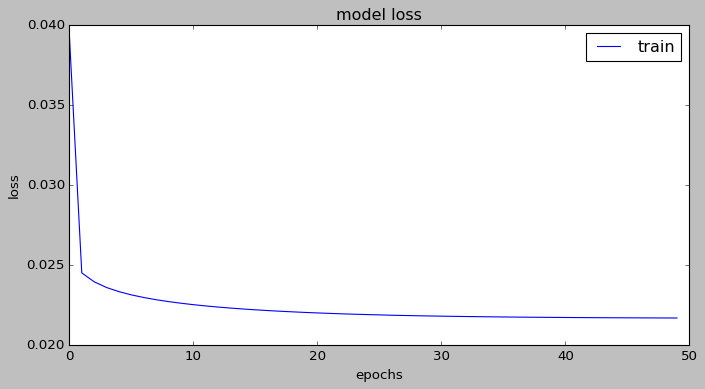

In [ ]:
epm_df = df[df.epm=='NA01NCPICSUMPK'][['total_curr_yr_sales_lbs']]
total_curr_yr_sales_lbs_values = epm_df.total_curr_yr_sales_lbs.values.reshape(-1,1)

scaler = MinMaxScaler(feature_range=(0, 1))
total_curr_yr_sales_lbs_values_scaled = scaler.fit_transform(total_curr_yr_sales_lbs_values)

v_sequence_length = 13
v_batch_size = 1
#v_window_length = v_sequence_length - 1
v_epochs = 50
total_curr_yr_sales_lbs_values_prep = tf.keras.preprocessing.timeseries_dataset_from_array(total_curr_yr_sales_lbs_values_scaled, total_curr_yr_sales_lbs_values_scaled, sequence_length = v_sequence_length, batch_size = v_batch_size)

'''
for tr_inputs, tr_targets in total_curr_yr_sales_lbs_values_prep:
    print("---Batch---")
    print("Feature:", tr_inputs.numpy())
    print("Label:", tr_targets.numpy())
    print("")
'''
for batch in total_curr_yr_sales_lbs_values_prep.take(1):
    tr_inputs, tr_targets = batch


model = Sequential()
#model.add(Bidirectional(LSTM(64, return_sequences = True, input_shape = (tr_inputs.shape[1], tr_inputs.shape[2]))))
#model.add(Bidirectional(LSTM(32, return_sequences = False))) 
model.add(LSTM(64, return_sequences = True, input_shape = (tr_inputs.shape[1], tr_inputs.shape[2])))
model.add(LSTM(32, return_sequences = False))
model.add(Dense(units=1))
#model.add(Activation('relu'))
model.compile(optimizer = Adam(learning_rate=0.1), loss='mean_squared_error')
es = EarlyStopping(monitor = 'val_loss', patience = 5, verbose = 1, min_delta = .01, mode = 'min', baseline = 0.05, restore_best_weights = True)
chkpt = keras.callbacks.ModelCheckpoint(monitor = "val_loss",  filepath = 'weights.h5', verbose = 1, save_weights_only = True, save_best_only = True,)
history = model.fit(total_curr_yr_sales_lbs_values_prep, shuffle = False, epochs = v_epochs, verbose = 1, callbacks = [es, chkpt])
history.history.keys()

plt.figure(figsize=(10,5))
plt.style.use('classic')
plt.plot(history.history["loss"], label='Train Loss')
#plt.plot(history.history['lr'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train'], loc='upper right')
plt.show(block=False)



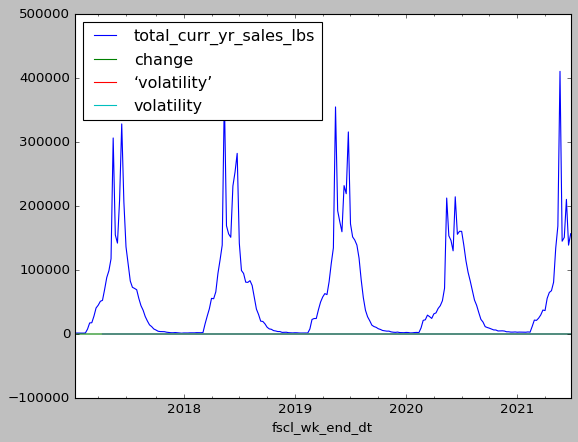

In [ ]:
epm_df.plot()

In [ ]:
import os
####*IMPORANT*: Have to do this line *before* importing tensorflow
os.environ['PYTHONHASHSEED']= str(50)

Shape of X : 233


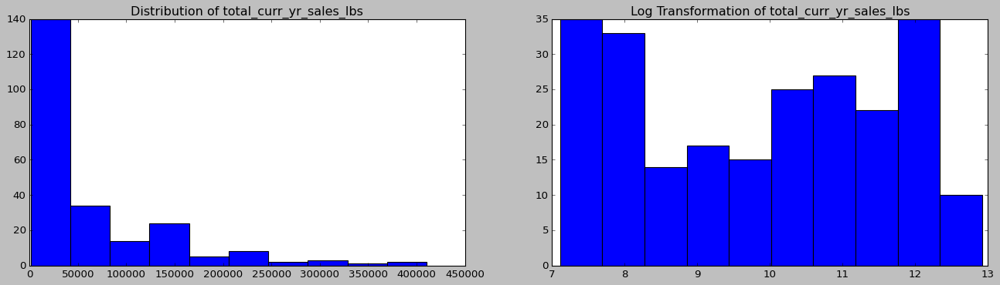

After preprocessing
(220, 13, 1) (220, 1)
Shape of train_x, train_y, test_x, yest_y
(186, 13, 1) (186, 1) (34, 13, 1) (34, 1)
******************************************************************
Model: "sequential_72"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_189 (LSTM)              (None, 13, 64)            16896     
_________________________________________________________________
lstm_190 (LSTM)              (None, 13, 32)            12416     
_________________________________________________________________
lstm_191 (LSTM)              (None, 16)                3136      
_________________________________________________________________
dense_69 (Dense)             (None, 1)                 17        
Total params: 32,465
Trainable params: 32,465
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
6/6 [==============================] - 7s 

In [ ]:

window_size=13

df = pd.read_csv('result_ppg_canada_sales.csv')

df.columns = [c.lower() for c in df.columns]

fact_col_list = ['total_curr_yr_sales_dollar', 'total_curr_yr_sales_units',	'total_curr_yr_sales_lbs']
for c in fact_col_list:
    df[c] = df[c].astype(float)

df['fscl_wk_end_dt'] = pd.to_datetime(df['fscl_wk_end_dt'])
df['fscl_mth_end_dt'] = pd.to_datetime(df['fscl_mth_end_dt'])

df = df.sort_values(by=['fscl_wk_end_dt','epm'])
df.set_index('fscl_wk_end_dt', inplace=True)
unique_epm_list = list(set(list(df.epm)))

df_orig = df.copy()
df = df[['epm','total_curr_yr_sales_lbs']]

epm_df = df[df.epm=='NA01NCPICSUMPK'][['total_curr_yr_sales_lbs']]
df = epm_df 
X = epm_df['total_curr_yr_sales_lbs'].values.reshape(-1,1)
scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X)

print("Shape of X : " + str(len(X)))
plt.figure(figsize=(20,5))
plt.subplot(121)
plt.hist(X)
plt.title('Distribution of total_curr_yr_sales_lbs')
plt.subplot(122)
plt.hist(np.log(X))
plt.title('Log Transformation of total_curr_yr_sales_lbs')
plt.show()

def convert2matrix(data_arr, look_back):
    X, Y =[], []
    for i in range(len(data_arr)-look_back):
        d=i+look_back 
        X.append(data_arr[i:d])
        Y.append(data_arr[d])
    return np.array(X), np.array(Y)

x, y = convert2matrix(X_scaled,window_size)
print("After preprocessing")
print(x.shape,y.shape)

total_length = len(X_scaled)
split_value = int(total_length *  .8)

train_x = x[:split_value]
train_y = y[:split_value]

test_x = x[split_value:]
test_y = y[split_value:]

print("Shape of train_x, train_y, test_x, yest_y")
print(train_x.shape, train_y.shape, test_x.shape, test_y.shape)
print("******************************************************************")

model = Sequential()
model.add(LSTM(64, return_sequences = True, activation='relu', input_shape=(train_x.shape[1],1)))
model.add(LSTM(32, return_sequences = True, activation='relu', ))
model.add(LSTM(16, return_sequences = False, activation='relu', ))
model.add(Dense(1, activation='relu'))
model.summary()

model.compile(loss='mae', optimizer=Adam(0.01))
model.fit(train_x, train_y, epochs=100, batch_size=32, validation_data=(test_x, test_y), verbose=1, shuffle=False)

from sklearn.metrics import mean_absolute_error

train_pred = model.predict(train_x)
train_pred_inverse = scaler.inverse_transform(train_pred)

pred_x = model.predict(test_x)
pred_inverse = scaler.inverse_transform(pred_x)


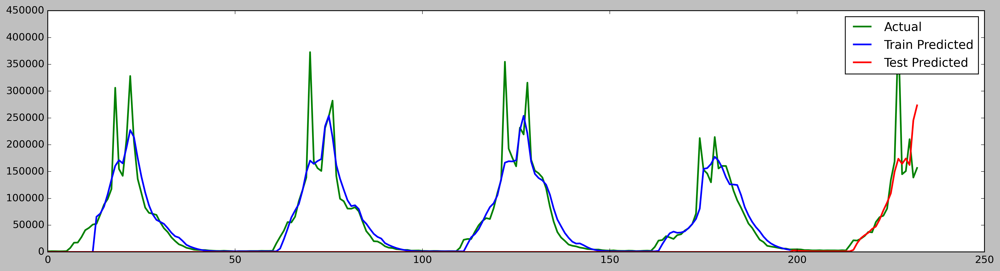

In [ ]:
plt.figure(figsize=(20,5),dpi=300)
plt.plot(scaler.inverse_transform(X_scaled), label='Actual', color = 'g', linewidth=2)
plt.plot(np.append(np.zeros(13),train_pred_inverse), label='Train Predicted', color = 'b', linewidth=2)
#plt.plot(pred_inverse, linestyle= 'dashdot', label = 'Predicted', color='r', linewidth=4)
plt.plot(np.append(np.zeros(len(train_pred_inverse) + 13), pred_inverse), color='r', linewidth=2, linestyle= 'solid', label = 'Test Predicted')
plt.legend()
plt.show()


In [ ]:
X_scaled_rescaled_back = X_scaled.reshape((-1))

def predict(num_prediction, model, dataset):
    prediction_list = dataset[-13:]
    prediction_list_scaled = []
    for _ in range(num_prediction):
        x = prediction_list[-13:]
        x = x.reshape((1, 13, 1))
        out = model.predict(x)
        out_inverse = scaler.inverse_transform(model.predict(x))
        prediction_list = np.append(prediction_list, out.flatten())
        prediction_list_scaled.append(out_inverse)
    prediction_list = prediction_list[12:]
    
    return prediction_list, prediction_list_scaled
    
num_prediction = 52
forecast, inverse_forecast = predict(num_prediction, model, X_scaled_rescaled_back)
#forecast_dates = predict_dates(num_prediction)

In [ ]:
np.array(inverse_forecast).shape

(52, 1, 1)

In [ ]:
reqd_pred = 104
future_pred_scaled = []
future_pred = []
for i in range(reqd_pred):
    yhat = model.predict(train_x[-1].reshape(1,13,1), verbose=0)
    yhat_inverse = scaler.inverse_transform(yhat)
    print(yhat, yhat_inverse)
    future_pred_scaled.append(yhat)
    future_pred.append(yhat_inverse)
    train_x = np.append(train_x, yhat)
    print("Length of train_x " + str(len(train_x)))

[[0.00356664]] [[2682.857]]
Length of train_x 2419


ValueError: ignored

In [ ]:

close_data = close_data.reshape((-1))

def predict(num_prediction, model):
    prediction_list = close_data[-look_back:]
    
    for _ in range(num_prediction):
        x = prediction_list[-look_back:]
        x = x.reshape((1, look_back, 1))
        out = model.predict(x)[0][0]
        prediction_list = np.append(prediction_list, out)
    prediction_list = prediction_list[look_back-1:]
        
    return prediction_list
    
def predict_dates(num_prediction):
    last_date = df['Date'].values[-1]
    prediction_dates = pd.date_range(last_date, periods=num_prediction+1).tolist()
    return prediction_dates

num_prediction = 30
forecast = predict(num_prediction, model)
forecast_dates = predict_dates(num_prediction)

In [ ]:
train_x[-1]

array([[0.1995903 ],
       [0.16352367],
       [0.12662636],
       [0.10656268],
       [0.07897034],
       [0.05291035],
       [0.04244805],
       [0.02508816],
       [0.02175732],
       [0.01907168],
       [0.01575899],
       [0.01250275],
       [0.01234548]])

In [ ]:
np.append(train_pred_inverse, pred_inverse)

array([ 60172.797 ,  65297.82  ,  83526.88  , 105799.26  , 122577.83  ,
       141655.27  , 184073.36  , 166760.55  , 189472.83  , 224660.31  ,
       223995.94  , 187317.81  , 124373.43  ,  84942.4   ,  65234.496 ,
        56759.38  ,  53234.355 ,  48799.785 ,  37894.695 ,  29850.662 ,
        24862.223 ,  15531.621 ,   9227.668 ,   6003.885 ,   4315.579 ,
         3277.636 ,   2768.4346,   2250.1335,   1663.9939,   1223.475 ,
         1223.475 ,   1223.475 ,   1223.475 ,   1223.475 ,   1223.475 ,
         1223.475 ,   1223.475 ,   1223.475 ,   1223.475 ,   1223.475 ,
         1223.475 ,   1223.475 ,   1223.475 ,   1223.475 ,   1223.475 ,
         1223.475 ,   1223.475 ,   1223.475 ,   1223.475 ,   6628.097 ,
        22070.992 ,  39362.38  ,  62523.22  ,  70556.27  ,  84755.69  ,
       113094.28  , 135507.1   , 154569.11  , 175511.44  , 161331.4   ,
       167908.58  , 243332.52  , 259183.08  , 227332.95  , 170168.42  ,
       110010.24  ,  83745.64  ,  82239.836 ,  67917.805 ,  6196